In [2]:
##### import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import pydicom as dcm
import os
from scipy import stats
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from skimage import measure
import pyvista as pv
from scipy.interpolate import griddata
import matplotlib.tri as mtri
from scipy.spatial import Delaunay
from scipy.optimize import curve_fit
from scipy import interpolate
from matplotlib import cm

In [3]:
from Registration.dicom_registration import *
from Slice_Selection.slice_selection import *


ModuleNotFoundError: No module named 'Registration'

In [ ]:
PATH = '/mnt/iDriveShare/Kayla/CBCT_images/kayla_extracted/' # Path to patient files
patient = '22'
patient_path = PATH+patient+'/'
save_path = '/data/kayla/anonymized/'

In [ ]:
## Function Definitions

### Plotting

In [ ]:
def plot_all_contours(RS,image,slice_num,origin,spacing,ignore_terms=[]):
    contours_not_on_slice = []
    
    all_ROIs = [r for r in find_ROI_names(RS)]
    for term in ignore_terms:
        all_ROIs = [r for r in all_ROIs if term.lower() not in r.lower()]
    
#     dict_contours, z_lists_b = get_all_ROI_contours(all_ROIs, RS)
    colours= get_ROI_colour_dict(RS)
    z_slice = image_to_xyz_coords_single(slice_num, spacing[2],origin[2])[0]
#     xyz_to_image_coords_single(X,spacing,origin):
    print(z_slice)
    
    
    plt.imshow(image[slice_num],cmap='gray')
    for roi in all_ROIs:
#         print(roi)
        dict_contours, z_lists = get_all_ROI_contours([roi], RS)
#         if len(dict_contours) >1:
        for i,r in enumerate(dict_contours):
            if r == roi:
                break
        try:       
            roi_slice = get_ROI_slice(z_slice,z_lists[i])
#             print(len(roi_slice))
            
            c =colours[roi]
            for s in roi_slice:
                roi_x, roi_y = get_ROI_pixel_array(dict_contours[roi][s],origin[0],origin[1],spacing)
                plt.plot(roi_x,roi_y,'-',color=  (c[0]/255,c[1]/255,c[2]/255),label=roi)
        except Exception as e:
            contours_not_on_slice.append(roi)
#             print(roi,"not on slice.")
        

    plt.legend(prop={'size': 12})
    print("Other contours not on slice:",contours_not_on_slice)
    
    


In [4]:
def plot_3d(image, threshold=-300):
    
    # Position the scan upright, 
    # so the head of the patient would be at the top facing the camera
    p = image.transpose(2,1,0)
    p = p[:,:,::-1]
    
    print(len(measure.marching_cubes(p,threshold)))
    verts, faces, _, _ = measure.marching_cubes(p, threshold)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces],alpha=1)
    face_color = [0.5, 0.5, 1]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, p.shape[0])
    ax.set_ylim(0, p.shape[1])
    ax.set_zlim(0, p.shape[2])

    plt.show()

In [5]:
def plot_3_views(slices, slice_number=100,image=[],plot_cor=False):
    ps = slices[0].PixelSpacing
    ss = slices[0].SliceThickness 
    ax_aspect = ps[1]/ps[0]
    sag_aspect = ps[1]/ss
    cor_aspect = ss/ps[0]

    # create 3D array
    img_shape = list(slices[0].pixel_array.shape)
    img_shape.append(len(slices))
    img3d = np.zeros(img_shape)
    
    # fill 3D array with the images from the files
    for i, s in enumerate(slices):
        if len(image)==0:
            img2d = s.pixel_array
        else:
            img2d = image[i]
        img3d[:, :, i] = img2d

    # plot 3 orthogonal slices
    a1 = plt.subplot(2, 2, 1)
    plt.imshow(img3d[:, :, slice_number],cmap='gray')
    a1.set_aspect(ax_aspect)

    a2 = plt.subplot(2, 2, 2)
    plt.imshow(img3d[:, img_shape[1]//2, :],cmap='gray')
    a2.set_aspect(sag_aspect)
    if plot_cor:
        a3 = plt.subplot(2, 2, 3)
        plt.imshow(img3d[img_shape[0]//2, :, :].T)
        a3.set_aspect(cor_aspect)

    plt.show()

In [6]:
def plot_pv(points_3d,camera='yz',alpha=4):
    pl = pv.Plotter()

    # points is a 3D numpy array (n_points, 3) coordinates of a sphere
    cloud = pv.PolyData(points_3d)
    # cloud.plot()

    volume = cloud.delaunay_3d(alpha=4)
    pl.add_mesh(volume,show_edges=False)
    # volume.plot()
    # shell = volume.extract_geometry()

    # shell.plot()

    pl.camera_position = camera#[(0.0, 0.0, 1.0),  (0.0, 0.0, 0.0), (0.0, 1.0, 0.0)]
    pl.show()

In [7]:
def get_isodose(slice, iso,prescription_dose):
    isodose = [ [0] * len(slice[0]) ] * len( slice)
    isodose = []
    first_row = 0

    for i,row in enumerate(slice):
        new_row = []
        first_col = 0
        
        for j,col in enumerate(row):
            
            if col >= prescription_dose*iso:   
                
                new_row.append(1)
                

            else:
                new_row.append(0)
        isodose.append(new_row)
        
    return isodose

    
            
    

In [8]:
def get_3D_isodose(image,iso,prescription_dose):
    isodose_3D = []
    
    for slice in image:
        isodose_2D = get_isodose(slice,iso,prescription_dose)
        isodose_3D.append(isodose_2D)
        
    return isodose_3D

In [9]:
### Image Processing

In [10]:
def get_pixels_hu(scans):
    image = np.stack([s.pixel_array for s in scans])
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)
    
    # Convert to Hounsfield units (HU)
    intercept = scans[0].RescaleIntercept
    slope = scans[0].RescaleSlope
    print("Intersept:", intercept)
    print("slope:", slope)
    
    if slope != 1:
        image = slope * image.astype(np.float64)
        image = image.astype(np.int16)
        
    image += np.int16(intercept)
    
    return np.array(image, dtype=np.int16)

In [11]:
def get_pixels(scans):
    image = np.stack([s.pixel_array for s in scans])
   
    return np.array(image, dtype=np.int16)

In [12]:
def reverse_pixels_hu(anon,scans):
#     image = np.stack([s.pixel_array for s in scans])
    # Convert to int16 (from sometimes int16), 
    # should be possible as values should always be low enough (<32k)
    image = anon
    image = image.astype(np.int16)
    
    # Convert to Hounsfield units (HU)
    intercept = scans[0].RescaleIntercept
    slope = scans[0].RescaleSlope
    print("Intersept:", intercept)
    print("slope:", slope)
    
    if slope != 1:
        image = image.astype(np.float64) / slope
        image = image.astype(np.int16)
        
    image -= np.int16(intercept)
    
    return np.array(image, dtype=np.int16)

### Anonymization

In [13]:
# to do, fix z mess for when its revesrsed
def generate_anon_image(image,z_lists,spacing,y_cutoff, cut_above = True,isodose=[], contours_to_keep = [],origin=[0,0,0],reverse_z=False):
    anon_image = image.copy()

    all_z_slices = sorted(z_lists[0] + [z for z in z_lists[1] if z not in z_lists[0]])

    prev_z = -1000
    for i in range(max([len(z) for z in z_lists])):
        current_z = all_z_slices[i]
        img_slice = get_image_slice(start_z, all_z_slices[i], spacing)
        print(img_slice,current_z)


        for j,row in enumerate(image[img_slice]):
#             print(j)
            new_row = [-1000]*len(row)
            
            if len(isodose) > 0:
                for k, col in enumerate(isodose[img_slice][j]):
                    if col == 1:
                        new_row[k] = row[k]
            
#             if current_z != prev_z:
#                 print("X")
            for contour in contours_to_keep:
#                 print(contour)
                for c_slice in contours_to_keep[contour]:
                    if c_slice[2] == current_z:

                        xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
                        X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)
    


                        cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
                        cont_xy = cont_xy.reshape((-1,1,2))
#                         cv2.drawContours(mask,cont_xy,-1,1)

#                              print("HI",cont_xy)
                        for k in range(len(new_row)):
                            result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
#                             print(k,j,result)
                            if result == 1:
#                                 print(contour)
                                new_row[k] = row[k]
                                if row[k]!=-1000:
                                    print(row[k])

                
            anon_image[img_slice][j] = new_row
            prev_z = current_z

            if j > y_cutoff:
                break
            
    if cut_above:
        if reverse_z:
            for slice in range(0,img_slice):
                z_current = image_to_xyz_coords_single(slice,spacing[2],origin[2])
            #     print(slice)
                for j,row in enumerate(image[slice]):
                    new_row = [-1000]*len(row)

                    if len(isodose) > 0:
                        for k, col in enumerate(isodose[img_slice][j]):
        #                 print(col)
                            if col == 1:
                                new_row[k] = row[k]

                    for contour in contours_to_keep:
                        print(contour)
                        for c_slice in contours_to_keep[contour]:
                            if c_slice[2] == current_z:

                                xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
                                X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)



                                cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
                                cont_xy = cont_xy.reshape((-1,1,2))
                            #                         cv2.drawContours(mask,cont_xy,-1,1)

                                print("HI",cont_xy)
                                for k in range(len(new_row)):
                                    result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
                            #                             print(k,j,result)
                                    if result == 1:
                                        print(contour)
                                        new_row[k] = row[k]

                    anon_image[slice][j] = new_row
                    #         print(len(row))
                    #         print(new_row)
                    if j > y_cutoff:
                        break
            
        else:
            print("NOT REV")
            for slice in range(img_slice,len(image)):
            #     print(slice)
                z_current = image_to_xyz_coords_single(slice,spacing[2],origin[2])
                for j,row in enumerate(image[slice]):
                    new_row = [-1000]*len(row)

                    if len(isodose) > 0:
                        for k, col in enumerate(isodose[img_slice][j]):
        #                 print(col)
                            if col == 1:
                                new_row[k] = row[k]

                    for contour in contours_to_keep:
                        print(contour)
                        for c_slice in contours_to_keep[contour]:
                            if c_slice[2] == current_z:

                                xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
                                X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)



                                cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
                                cont_xy = cont_xy.reshape((-1,1,2))
                            #                         cv2.drawContours(mask,cont_xy,-1,1)

                            #                              print("HI",cont_xy)
                                for k in range(len(new_row)):
                                    result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
                            #                             print(k,j,result)
                                    if result == 1:
                                        print(contour)
                                        new_row[k] = row[k]

                    anon_image[slice][j] = new_row
                    #         print(len(row))
                    #         print(new_row)
                    if j > y_cutoff:
                        break
                    
    return anon_image



In [14]:
# to do, fix z mess for when its revesrsed
def generate_anon_image_remove_all(image,z_lists,spacing,y_cutoff, cut_above = True,isodose=[], contours_to_keep = [],origin=[0,0,0],reverse_z=False):
    anon_image = image.copy()
   
    all_z_slices = sorted(z_lists[0] + [z for z in z_lists[1] if z not in z_lists[0]])

    prev_z = -1000
    
    for i in range(max([len(z) for z in z_lists])):
        current_z = all_z_slices[i]
        img_slice = get_image_slice(start_z, all_z_slices[i], spacing)
#         print(img_slice,current_z)
        

        for j,row in enumerate(image[img_slice]):
#             print(j)
            new_row = [-1000]*len(row)
            
            if len(isodose) > 0:
                for k, col in enumerate(isodose[img_slice][j]):
                    if col == 1:
                        new_row[k] = row[k]
            
#             if current_z != prev_z:
#                 print("X")
            for contour in contours_to_keep:
#                 print(contour)
                for c_slice in contours_to_keep[contour]:
                    if c_slice[2] == current_z:

                        xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
                        X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)
    


                        cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
                        cont_xy = cont_xy.reshape((-1,1,2))
#                         cv2.drawContours(mask,cont_xy,-1,1)

#                              print("HI",cont_xy)
                        for k in range(len(new_row)):
                            result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
#                             print(k,j,result)
                            if result == 1:
#                                 print(contour)
                                new_row[k] = row[k]
#                                 if row[k]!=-1000:
#                                     print(row[k])



            anon_image[img_slice][j] = new_row
            prev_z = current_z

    if cut_above:
        if reverse_z:
            for slice in range(0,img_slice):
            #     print(slice)
                z_current = image_to_xyz_coords_single(slice,spacing[2],origin[2])[0]
         
                for j,row in enumerate(image[slice]):
                    new_row = [-1000]*len(row)

                    if len(isodose) > 0:
                        for k, col in enumerate(isodose[img_slice][j]):
        #                 print(col)
                            if col == 1:
                                new_row[k] = row[k]

                    for contour in contours_to_keep:
#                         print(contour)
                        for c_slice in contours_to_keep[contour]:
                            if c_slice[2] == z_current:

                                xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
                                X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)

                                X.append(X[0])
                                Y.append(Y[0])

                                cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
                                cont_xy = cont_xy.reshape((-1,1,2))
                            #                         cv2.drawContours(mask,cont_xy,-1,1)

                            #                              print("HI",cont_xy)
                                for k in range(len(new_row)):
                                    result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
                            #                             print(k,j,result)
                                    if result == 1:
                            #                                 print(contour)
                                        new_row[k] = row[k]

                    anon_image[slice][j] = new_row
                    #         print(len(row))
                    #         print(new_row)

        else:
            print("NOT REV")
            for slice in range(img_slice,len(image)):
#                 print(img_slice, len(image))
#                 print(slice)
                z_current = image_to_xyz_coords_single(slice,spacing[2],origin[2])[0]
#                 print(z_current)
                for j,row in enumerate(image[slice]):
                    new_row = [-1000]*len(row)

                    if len(isodose) > 0:
                        for k, col in enumerate(isodose[img_slice][j]):
        #                 print(col)
                            if col == 1:
                                new_row[k] = row[k]

                    for contour in contours_to_keep:
#                         print(contour)
                        for c_slice in contours_to_keep[contour]:
                            if c_slice[2] == z_current:
#                                 print("c",c_slice[2])

                                xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
                                X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)
                                
                                X.append(X[0])
                                Y.append(Y[0])


                                cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
                                cont_xy = cont_xy.reshape((-1,1,2))
                            #                         cv2.drawContours(mask,cont_xy,-1,1)

                            #                              print("HI",cont_xy)
                                for k in range(len(new_row)):
                                    result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
                            #                             print(k,j,result)
                                    if result == 1:
                            #                                 print(contour)
                                        new_row[k] = row[k]

                    anon_image[slice][j] = new_row
                    #         print(len(row))
                    #         print(new_row)
    return anon_image



In [15]:
def generate_anon_body(dict_contours_body,z_lists,y_cutoff, isodose=[], body_name = 'BODY',contours_to_keep=[],get_ind = False,reverse_z=False):
    all_z_slices = sorted(z_lists[0] + [z for z in z_lists[1] if z not in z_lists[0]])

#     x_iso = X_new
#     y_iso = Y_new
#     z_iso = Z_new

#TODO:add isodoes
    contour_curves = {}
  
    for contour in contours_to_keep:
        print(contour)
        contour_curves[contour] = get_contour_curves(contours_to_keep[contour], all_z_slices, y_cutoff)
        print(contour_curves)
 
        
    
    x_iso = []
    y_iso = []
    z_iso = []
    
    
    # test = dict_contours[body_ROI_names[0]][roi_slice]
    # print(len(test))
    XN = []
    YN = []
    ZN = []
    fullN = []
    full_stack_N = []
    y_prev = 0
    x_prev = 0
    z_prev = -1000
    z_cont = -1000
    for c in dict_contours_body[body_name]:
    #     print(c)
        test = c
    #     full = full + list(c)
        slice = []

#         if c[2] < -650:
#             continue

        for i in range(0,len(c),3):

            x = test[i]
            y = test[i+1]
            z = test[i+2]
#             print(x)


            add_N = True
            if z in all_z_slices or (not reverse_z and z>min(all_z_slices)) or (reverse_z and z<min(all_z_slices)):
                if y < y_cutoff:
                    if z==137:
                        print(y)
                    y = y_cutoff
#                     print(z,z_prev)
#                     if True:#z != z_prev:
#                         iso_z_ind =  [ind for ind, e in enumerate(z_iso) if e == z]
#                         print(z_iso)
#                     for index in iso_z_ind:
#                         if round(x_iso[index]) == round(x) and y_iso[index] < y:
#                             y = y_iso[index]
                    
                    for contour in contours_to_keep:
                        if z in contour_curves[contour]:  
                            contour_slice = contour_curves[contour][z]
                            if x > contour_slice['x_min'] and  x < contour_slice['x_max']:
                                y = contour_slice['spline'](x)
                                


    #         if y < min_eye + 30:
    #             print(y, max_y)
#             print(add_N)
            if not (y== y_prev and x==x_prev):# and add_N:
                XN.append(x)
                YN.append(y)
                ZN.append(z)
                fullN.append([x,y,z])
                slice = slice + [x,y,z]
            
            y_prev = y
            x_prev = x
            z_prev = z

        if z==137:
            print(slice)
        full_stack_N.append(slice)

    return full_stack_N

    

In [16]:
# spacing = [pixel_spacing[0],pixel_spacing[1],z_spacing]

In [17]:
# cont_xy = np.array([tuple([(x),(y)]) for x,y in zip(X,Y)])
# cont_xy = cont_xy.reshape((-1,1,2))

In [20]:
# dist = cv2.pointPolygonTest(cont_xy, (220,2), False)
# print(dist)

In [21]:
# for i,row in enumerate(mask):
#     for j, col in enumerate(row):
        

In [22]:
# [[x,y] for x,y in zip(xi,yi)]

In [23]:
x_iso_p_int = x_iso_p
y_iso_p_int = y_iso_p
img_slice = 99
y_cutoff = ((max_y-min_y)/2+min_y)
print(y_cutoff)
anon_image = image[img_slice].copy()

for j,row in enumerate(image[img_slice]):
#     print(j,len(anon_img))

    new_row = [-1000]*len(row)
#     print(j)
    if j in y_iso_p_int:
        print(j)
#         print(j)
        ind_x = [ind for ind, y in enumerate(y_iso_p_int) if y == j]
#         print(ind_x)
#         ind_x = y_iso_p_int.index(j)
        for ind in ind_x:
#             print("x",x_iso_p_int[ind])
#             print(row[x_iso_p_int[ind]])
            new_row[x_iso_p_int[ind]] = row[x_iso_p_int[ind]]
    anon_image[j] = new_row
#     print("before cturr")
    if j > y_cutoff:
        print(j,y_cutoff)
#         print("Curting off")
        break

# if cut_above:
#     for slice in range(img_slice,len(image)):
#     #     print(slice)
#         for j,row in enumerate(image[slice]):
#             new_row = [-1000]*len(row)
#             anon_image[slice][j] = new_row
#             #         print(len(row))
#             #         print(new_row)
#             if j > ((max_y-min_y)/2+min_y):
#                 break


NameError: name 'x_iso_p' is not defined

In [24]:
# # test = dict_contours[body_ROI_names[0]][roi_slice]
# # print(len(test))
# X = []
# Y = []
# Z = []
# full = []
# full_3 = []
# full_stack = []
# all = []
# for c in dict_contours_body[body_ROI_names[0]]:
# #     print(len(c))
#     test = c
    
#     if c[2] > -625:
        
#         full = full + list(c)
#         full_stack.append(c)
    
#     for i in range(0,len(test),3):
        
            
#         x = test[i]
#         y = test[i+1]
#         z = test[i+2]
        
# #         print(z)
#         if z < -650:
#             continue
            
        
# #         if y < min_eye + 30:
# #             print(y, max_y)
        
#         X.append(x)
#         Y.append(y)
#         Z.append(z)
       
#         full_3.append([x,y,z])

In [25]:
### Contour Processing

In [18]:
def get_contour_stack(contour_name, dict_contours,cutoff=-1000):
    XN = []
    YN = []
    ZN = []
    fullN = []
    full_stack_N = []
    y_prev = 0
    x_prev = 0
    for c in dict_contours[contour_name]:
    #     print(c)
        test = c
    #     full = full + list(c)
        slice = []

        if c[2] < cutoff:
            continue

        for i in range(0,len(c),3):

            x = test[i]
            y = test[i+1]
            z = test[i+2]

            if not (y== y_prev and x==x_prev): # ensure interpolation functin oworks
                XN.append(x)
                YN.append(y)
                ZN.append(z)
                fullN.append([x,y,z])
                slice = slice + [x,y,z]
            y_prev = y
            x_prev = x

        full_stack_N.append(slice)
        
            # full_stack = full_stack_N
    
    full_stack_int = {}
    keys = []


    for slice in full_stack_N:
        
    #     print(slice)
    #     break
        xi, yi, zi = slice[::3], slice[1::3], slice[2::3]
#         print(zi[0])
        # Append starting coordinates to make it closed
    #     xi = np.r_[xi, xi]
    #     yi = np.r_[yi, yi]

        keys.append(zi[0])
        # Fit spline with s=0 (passing through all points)
        tck, u = interpolate.splprep([xi, yi], s=0, per=True)

        # Evaluate spline for 1000 evenly spaced points
        xj, yj = interpolate.splev(np.linspace(0, 1, 1000), tck)
        zj = [zi[0]]*1000
        full_stack_int[zi[0]] = []
        print
        for i in range(len(zj)):
            full_stack_int[zi[0]].append(xj[i]) 
            full_stack_int[zi[0]].append(yj[i])

    return full_stack_int, keys



    

In [19]:

# from three import BufferGeometry, Vector3, Mesh, MeshPhongMaterial, Float32BufferAttribute, Uint8Array

def distance(x1, y1, x2, y2):
    return np.sqrt((x2-x1)**2 + (y2-y1)**2)

def closest_index(x, y, array):
    dist = distance(x, y, array[0], array[1])
    index = 0
    for j in range(2, len(array), 2):
        newdist = distance(x, y, array[j], array[j+1])
        if newdist < dist:
            dist = newdist
            index = j
    return index

def render_body(slices, keys):
    pts = []  # The 3D points making up the entire body
    indices = []  # The indices of those points ordered in such a way that it forms a triangular mesh
    curr = 0  # The index of the current point (in the overall pts array, not of the current slice)
    colours = []  # The array of colours assigned to each point

    # Sort slice height (z) to be floats and in order
    keys.sort()

    # Loop through each slice to form triangle faces between current and subsequent slice
    for i in range(len(keys)):
        z = float(keys[i])  # the z value (height) of the slice
        slice = []  # stores the x and y values of each point in the slice (they all have the same z value)
        slice2 = []

        # Parse the slice data
        slice = slices[keys[i]]
#         print(len(slice))

        # Do not do for last slice since it will have already been connected to the previous slice
#         print(len(keys))
        if i < len(keys) - 1:
            slice2 = slices[keys[i+1]]
#             print(len(slice2))

        # Loop through the points in the current slice
        index = 0
        for j in range(0, len(slice), 2):
            pts.extend([slice[j], slice[j+1], z])

            # If first iteration, find starting point on second slice (this ensure both slices align)
            if j == 0 and i != len(keys)-1:
                index = closest_index(slice[j], slice[j+1], slice2)

#             # Check if point is inside one of the beams (stored in meshes array) and sets colour accordingly
#             point = Vector3(slice[j], slice[j+1], z)
#             is_inside = False

#             for mesh in meshes:
#                 if ConvexHull(mesh).containsPoint(point):
#                     is_inside = True
#                     break
#             if is_inside:
#                 colours.extend([153, 153, 255])  # blue
#             else:
#                 colours.extend([127, 127, 127])  # grey

            # Algorithm to create two triangular faces (between points [c,a,d] and [a,b,d] per point
            if j != len(slice)-2 and i != len(keys)-1:
                a = curr
                b = curr - j//2 + len(slice)//2 + ((index//2)+j//2) % (len(slice2)//2)
                c = curr + 1
                d = curr - j//2 + len(slice)//2 + ((index//2)+j//2 +1) % (len(slice2)//2)

                indices.extend([c, a, d])
                indices.extend([a, b, d])

            # For the final point in the slice, algorithm is such that it links back to first points of each slice
            if j == len(slice)-2 and i != len(keys)-1:
                a = curr
                b = curr + (((index//2) + len(slice2)//2) ) % (len(slice2)//2)
                if index == 0:
                    b += len(slice2)//2
                c = curr - j//2
                d = curr + 1 + ((index//2)) % (len(slice2)//2)

                indices.extend([c, a, d])
                indices.extend([a, b, d])

            # Algorithm to cap top and bottom slices (creates triangles across the slice instead of to next slice)
            if (i == len(keys)-1 or i == 0) and j == 0:
                for k in range(1, len(slice)//4):
                    a = curr + k - 1
                    b = curr + (len(slice)//2 - k)
                    c = curr + k
                    d = curr + (len(slice)//2 - k - 1)

                    indices.extend([c, a, d])
                    indices.extend([a, b, d])

            curr += 1
    return pts, indices

    # Create buffer geometry from points and set index and position attributes
#     geo = BufferGeometry()
#     geo.set_index(indices)
#     geo.set_attribute('position', Float32BufferAttribute(pts, 3))

#     geo.compute_bounding_sphere()
#     geo.compute_vertex_normals()

#     # Set colour attribute
#     colours = Uint8Array(colours)
#     geo.set_attribute('color', BufferAttribute(colours, 3, True))
#     geo.attributes.color.normalized = True

#     # Create final mesh
#     mesh = Mesh(geo, MeshPhongMaterial(vertex_colors=VertexColors, side=DoubleSide, shininess=0))
#     group.add(mesh)

In [20]:
def generate_mesh_from_RS(RS, structure, z_min=None, z_max=None):#z_cutoff=None):
    dict_contours, z_lists = get_all_ROI_contours([structure], RS)
    full_stack, keys = get_contour_stack(structure, dict_contours)
    
#     if z_cutoff is not None:
#         for key in keys.copy():
#             print(key)
#             if key < z_cutoff:
# #                 print(key)
#                 full_stack.pop(key)
#                 keys.remove(key)
        
    if z_min is not None or z_max is not None:
        if z_min is None:
            z_min = min(keys)
        if z_max is None:
            z_max = max(keys)
            
        for key in keys.copy():
            print(key)
            if key < z_min or key > z_max:
#                 print(key)
                if key in full_stack:
                    full_stack.pop(key)
                if key in keys:
                    keys.remove(key)
    print(full_stack.keys())
    
    
    return triangulate_structure(full_stack, keys)

In [21]:
def triangulate_structure(full_stack, keys):
    pts, indices = render_body(full_stack,keys)
    triangles = [indices[i:i+3] for i in range(0, len(indices), 3)]
    
    return pts, triangles
    

In [22]:
def generate_mesh_from_array(slice_stack, z_cutoff=None):
    full_stack_int = {}
    keys = []


    for slice in slice_stack:
        xi, yi, zi = slice[::3], slice[1::3], slice[2::3]
        if z_cutoff is not None and zi[0] < z_cutoff:
            continue

        keys.append(zi[0])
        # Fit spline with s=0 (passing through all points)
        tck, u = interpolate.splprep([xi, yi], s=0, per=True)

        # Evaluate spline for 1000 evenly spaced points
        xj, yj = interpolate.splev(np.linspace(0, 1, 1000), tck)
        zj = [zi[0]]*1000
        full_stack_int[zi[0]] = []
        
        for i in range(len(zj)):
            full_stack_int[zi[0]].append(xj[i]) 
            full_stack_int[zi[0]].append(yj[i])
            
    
    
    
    return triangulate_structure(full_stack_int, keys)

In [23]:
### Dose

In [24]:
def find_dose_file(CT_path):
    dose_files = [f for f in os.listdir(CT_path) if 'RD' in f]
    num_dose_files = len(dose_files)
    
    if num_dose_files == 0:
        raise FileNoteFoundError("ERROR: NO DOSE FILES FOUND")
    
    RD = dcm.read_file(CT_path+dose_files[0]) 
    
    if num_dose_files == 1:
        return RD
    
    elif num_dose_files > 1:
        
        smallest_spacing = RD[0x0028, 0x0030]
        
        for dose_file in dose_files[1:]:
            rd = dcm.read_file(CT_path+dose_file)
            spacing = rd[0x0028, 0x0030]
            
            if spacing[0] <= smallest_spacing[0] and spacing[1] <= smallest_spacing[1]:
                smallest_spacing = spacing
                RD = rd 
            

    return RD

In [25]:
def convert_isodose_image(iso_x,iso_y,image_slice):
#     isodose = [ [0] * len(slice[0]) ] * len( slice)
#     isodose = []
    first_row = 0
    iso_img = []

    for i,row in enumerate(image_slice):
#         print(i)
        new_row = []
       
        for j,col in enumerate(row):
            
            if i in iso_y and j in iso_x:
                
                
                new_row.append(1)
                

            else:
                new_row.append(0)
        print(len(new_row))
        iso_img.append(new_row)
        print(len(iso_img))
    return iso_img


In [26]:
def resample_dose_map_2D(dose_map, new_spacing, old_spacing):

    scaling_factors = [old/new for old, new in zip(old_spacing,new_spacing)]
    original_size = np.array([len(dose_map), len(dose_map[0])]) # change to 3D
    
    new_size = (original_size*scaling_factors).astype(int)
    resampled_dose_map = np.zeros(new_size)

    # to do make 3d
    for i in range(new_size[0]):
        for j in range(new_size[1]):

            original_index = np.array([i,j])/scaling_factors
            resampled_dose_map[i][j] = dose_map[int(original_index[0]), int(original_index[1])]            
        
    return resampled_dose_map

In [27]:
def resample_dose_map_3D(dose_map, new_spacing, old_spacing):

    scaling_factors = [old/new for old, new in zip(old_spacing,new_spacing)]
    original_size = np.array([len(dose_map[0]), len(dose_map[0][0]),len(dose_map)]) # change to 3D
    
    print(original_size)
    new_size_xyz = (original_size*scaling_factors).astype(int)
    new_size = [new_size_xyz[2],new_size_xyz[0],new_size_xyz[1]]
    print(new_size)
    print(original_size*scaling_factors)
    resampled_dose_map = np.zeros(new_size)
#     return resampled_dose_map
    print(resampled_dose_map.shape)

    # to do make 3d
    for k in range(new_size[0]):
        for i in range(new_size[1]):
            for j in range(new_size[2]):
           
#                 print(k)
                original_index = (np.array([i,j,k])/scaling_factors).astype(int)
#                 print(original_index)
#                 print(int(original_index[2]), int(original_index[0]),int(original_index[1]))
                resampled_dose_map[k][i][j] = dose_map[ int(original_index[2]), int(original_index[0]),int(original_index[1])]            

    return resampled_dose_map

In [28]:
#     if x_img < 0:
#         x_end = x_end - x_img
#         x_img = 0
#     if y_img < 0:
#         y_end = y_end - y_img
#         y_img = 0
        

In [29]:
def resize_dose_map(dose_map,new_size, spacing, new_origin, old_origin,default=0):
#     if default==0:
    resized_dose_map = np.zeros(new_size)
#     else:
#         resized_dose_map = np.full((new_size), default)

#     print(resized_dose_map.shape)
    x_img = int((new_origin[0]-old_origin[0])/spacing[0])
    y_img = int((new_origin[1]-old_origin[1])/spacing[1])
    print(x_img,y_img)
    print((new_origin[0]-old_origin[0])/spacing[0],(new_origin[1]-old_origin[1])/spacing[1])
    print("X",x_img, len(dose_map[0]))
    print("Y",y_img, len(dose_map))
    print(x_img+len(dose_map[0]))
    
    y_end = y_img+len(dose_map)
    x_end = x_img+len(dose_map[0])
    


    print('xy ends',x_end,y_end)
    if y_end > 512:
        dose_map = dose_map[:(new_size[1]-y_end)]
    if x_end > 512:
        dose_map = dose_map[:,:(new_size[0]-x_end)]
          
    resized_dose_map[y_img:y_end,x_img:x_end] = dose_map
    return resized_dose_map

In [30]:
def resize_dose_map_3D(dose_map,new_size, spacing, new_origin, old_origin,default=0):
    new_size_zxy = new_size[2],new_size[0],new_size[1]
    print(new_size_zxy)
    resized_dose_map = np.zeros(new_size_zxy)
    z_image = int((new_origin[2] - old_origin[2])/spacing[2])
    print("z_img",z_image, (new_origin[2] - old_origin[2])/spacing[2])
    
    len_dose_map = len(dose_map)
    print("len dose map",len_dose_map)
    # Crop dose map if starting index is negative
    if z_image < 0:       
        z_image = 0
        len_dose_map = len_dose_map + z_image
    print("len dose map after < 0",len_dose_map)     
    
    for i,resized_index in enumerate(range(z_image,z_image+len_dose_map)):  # added zimage + lendose map. idk anymore
        print(i,resized_index)
        print("new or (DOSE)", new_origin[2])
        print("old or (IMG)", old_origin[2])
        print("spacing", spacing)
        resized_dose_map[resized_index] = resize_dose_map(dose_map[i],[new_size[0],new_size[1]],spacing,new_origin,old_origin,default=0)
    
    return resized_dose_map

In [31]:
### Image <---> Patient (XYZ) space conversions

In [32]:
def mask_to_contour_image_space(mask_3D):
    contour = []
    X,Y,Z = [], [], []
    
    for z,slice in enumerate(mask_3D):
        mask = np.array(slice,dtype=np.uint8)*255
        contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contour_img = np.zeros_like(mask)
        result_img_space = cv2.drawContours(contour_img,contours,-1,1)
        
        for y,row in enumerate(result_img_space):
            for x, col in enumerate(row):
                if col == 1:
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    
        contour.append(result_img_space)
    return contour, X, Y, Z
        

In [33]:
def mask_to_xyz_coords(mask, spacing, origin):
    _, X, Y, Z = mask_to_contour_image_space(mask)
    return image_to_xyz_coords(X, Y, Z, spacing, origin)
     

In [34]:
def image_to_xyz_coords(X,Y,Z,spacing,origin):
    X_new, Y_new, Z_new = [], [], []
    for x,y,z in zip(X,Y,Z):
        
        X_new.append(x*spacing[0]+origin[0])
        Y_new.append(y*spacing[1]+origin[1])
        Z_new.append(z*spacing[2]+origin[2])
    
    return X_new, Y_new, Z_new

In [35]:
def xyz_to_image_coords(X,Y,Z,spacing,origin):
    X_new, Y_new, Z_new = [], [], []
    for x,y,z in zip(X,Y,Z):
        X_new.append((x-origin[0])/spacing[0])
        Y_new.append((y-origin[1])/spacing[1])
        Z_new.append((z-origin[2])/spacing[2])
    
    return X_new, Y_new, Z_new

In [36]:
def xyz_to_image_coords_single(X,spacing,origin):
    if type(X) is not list:
        X = [X]
    X_new = []
    for x in X:
        X_new.append((x-origin)/spacing)
        
    return X_new

In [37]:
def image_to_xyz_coords_single(X,spacing,origin):
    if type(X) is not list:
        X = [X]
    X_new = []
    for x in X:
        X_new.append(x*spacing+origin)
        
    return X_new

In [46]:
# Test Patient

In [47]:
p = '629'
CT='20210913_CT_07_SEP_2021'

In [48]:
p = '54'


In [99]:
patient = '747'
CT = '20210826_CT_19_AUG_2021'
CT_dcm = dcm.read_file(PATH+patient+'/'+CT+'/'+[f for f in os.listdir(PATH+patient+'/'+CT) if 'CT' in f][0])
RS_file = 'RS.1.2.246.352.221.531554799061951801714531701477212462526.dcm'
RS = dcm.read_file(PATH+patient+'/'+CT+'/'+RS_file)
RD_file = 'RD.1.2.246.352.221.537436778072101049514669538410716431037.dcm'
RD = dcm.read_file(PATH+patient+'/'+CT+'/'+RD_file)

In [47]:
patient = '54'
CT = '20190122_CT_14_JAN_2019/'
CT_dcm = dcm.read_file(PATH+patient+'/'+CT+[f for f in os.listdir(PATH+patient+'/'+CT) if 'CT' in f][0])
RS_file = 'RS.1.2.246.352.221.4788979292313920773602254472041266589.dcm'
RS = dcm.read_file(PATH+patient+'/'+CT+'/'+RS_file)
RD_file = 'RD.1.2.246.352.221.52854389348525023601825189725712376974.dcm'
RD = dcm.read_file(PATH+patient+'/'+CT+'/'+RD_file)

In [80]:
patient = '1481'
CT = '20230323_CT_17_MAR_2023'

RS_file = 'RS.1.2.246.352.221.47870337214738315541522182572356103335.dcm'
RS = dcm.read_file(PATH+patient+'/'+CT+'/'+RS_file)
RD_file = 'RD.1.2.246.352.221.47190037348439239793067778626451552169.dcm'
RD = dcm.read_file(PATH+patient+'/'+CT+'/'+RD_file)
RP_file = 'RP.1.2.246.352.221.53509562640857454253951659965359420828.dcm'
RP = dcm.read_file(PATH+patient+'/'+CT+'/'+RD_file)

In [232]:
patient = '437'
CT = '20180305_CT_26_FEB_2018'
ct_path_new ='/mnt/iDriveShare/Kayla/CBCT_images/anonymized/437/og_2/'
CT_dcm = dcm.read_file(PATH+patient+'/'+CT+'/'+[f for f in os.listdir(PATH+patient+'/'+CT) if 'CT' in f][0])
RS_file = [f for f in os.listdir(PATH+patient+'/'+CT+'/') if 'RS' in f][0]
RS = dcm.read_file(PATH+patient+'/'+CT+'/'+RS_file)

slices = [dcm.read_file(ct_path_new+ s) for s in os.listdir(ct_path_new) if 'CT' in s]
# Order slices
slices.sort(key = lambda x: (x.InstanceNumber))
image = get_pixels_hu(slices)

Intersept: -1000
slope: 1


In [216]:
patient = '22'
CT = '20180921_CT_13_SEP_2018'
CT_dcm = dcm.read_file(PATH+patient+'/'+CT+'/'+[f for f in os.listdir(PATH+patient+'/'+CT) if 'CT' in f][0])
RS_file = [f for f in os.listdir(PATH+patient+'/'+CT+'/') if 'RS' in f][0]
RS = dcm.read_file(PATH+patient+'/'+CT+'/'+RS_file)

Intersept: -1000
slope: 1


In [213]:
patient = '743'
CT = '20200709_CT_30_JUN_2020'
CT_dcm = dcm.read_file(PATH+patient+'/'+CT+'/'+[f for f in os.listdir(PATH+patient+'/'+CT) if 'CT' in f][0])
RS_file = [f for f in os.listdir(PATH+patient+'/'+CT+'/') if 'RS' in f][0]
RS = dcm.read_file(PATH+patient+'/'+CT+'/'+RS_file)
RD_file = 'RD.1.2.246.352.221.54115399764881058463592763037809870472.dcm'
RD = dcm.read_file(PATH+patient+'/'+CT+'/'+RD_file)

Intersept: -1000
slope: 1


In [201]:
#for test phantom

phantom_path_CT = '/mnt/iDriveShare/Kayla/CBCT_images/test_phantom/' 
CT_dcm = dcm.read_file(phantom_path_CT+[f for f in os.listdir(phantom_path_CT) if 'CT' in f][0])
RS_file = 'RS.1.2.246.352.71.4.2088656855.2401823.20110920093221.dcm'
RS_phantom = dcm.read_file(phantom_path_CT+RS_file)
RD_file = 'RD.1.2.246.352.71.7.2088656855.452404.20110921073629.dcm'
RD = dcm.read_file(phantom_path_CT+RD_file)


slices = [dcm.read_file(phantom_path_CT+ s) for s in os.listdir(phantom_path_CT) if 'CT' in s]
# Order slices
slices.sort(key = lambda x: (x.InstanceNumber))
image = get_pixels_hu(slices)

KeyboardInterrupt: 

In [ ]:
# For complete test 743
patient = '743'
path_ct = '/mnt/iDriveShare/Kayla/CBCT_images/anonymized/TEST_FULL_743/OG_CT/'
CT_dcm = dcm.read_file(path_ct+[f for f in os.listdir(path_ct) if 'CT' in f][0])
RS_file = [f for f in os.listdir(path_ct) if 'RS' in f][0]
RS = dcm.read_file(path_ct+RS_file)

slices = [dcm.read_file(path_ct+ s) for s in os.listdir(path_ct) if 'CT' in s]
# Order slices
slices.sort(key = lambda x: (x.InstanceNumber))
image = get_pixels_hu(slices)

In [197]:
patient

'437'

In [ ]:
### Get CT Slices

In [172]:
slices = [dcm.read_file(PATH+patient+'/'+CT + '/'+ s) for s in os.listdir(PATH+patient+'/'+CT) if 'CT' in s]
# Order slices
slices.sort(key = lambda x: (x.InstanceNumber))
image = get_pixels_hu(slices)

Intersept: -1000
slope: 1


In [203]:
reverse_z = (slices[0].ImagePositionPatient[2]-slices[1].ImagePositionPatient[2] > 0) # Z increasung
print(reverse_z)

False


In [233]:
# Image Sacping Parameters
origin = slices[0].ImagePositionPatient
start_z = origin[2]
start_x = origin[0]
start_y = origin[1]
z_spacing = slices[0].SliceThickness 
pixel_spacing = slices[0].PixelSpacing
spacing = [pixel_spacing[0],pixel_spacing[1],z_spacing]

# Spacing in Z,X,Y format
dose_spacing = [RD.GridFrameOffsetVector[1]-RD.GridFrameOffsetVector[0],RD.PixelSpacing[0],RD.PixelSpacing[1]]
CT_spacing = [CT_dcm.SliceThickness,pixel_spacing[0],pixel_spacing[1]]

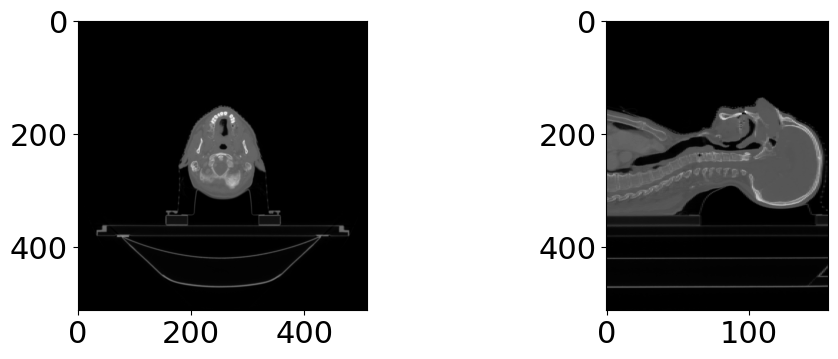

In [234]:
plot_3_views(slices, 100)

In [235]:
print(slices[0].ImagePositionPatient,"-->", slices[1].ImagePositionPatient)

[-305, -206, -802.5] --> [-305, -206, -799.5]


In [236]:
find_ROI_names(RS)

['BODY',
 'BrachialPlexus_L',
 'PharCon_Sup',
 'BoneRadCalc',
 'Brain',
 'Pituitary',
 'BrachialPlexus_R',
 'TemporalLobe_L',
 'Eye_R',
 'PharCon_Inf',
 'Esophagus_Upper',
 'SpinalCord',
 'SubmndSalv_R',
 'Mandible',
 'Parotid_L',
 'Larynx',
 'Lens_L',
 'TemporalLobe_R',
 'Lips',
 'Brainstem_PRV5',
 'OpticNerve_R',
 'OpticNerve_L',
 'LUNG_L',
 'LUNG_R',
 'ESOPHAGUS_2CM',
 'PTV70+PTV60',
 'PTV_ALL',
 'AVOID 56',
 'AVOID 60',
 'RING 56',
 'RING 60',
 'RING 70',
 'MIDDLE AVOID',
 'POST AVOID',
 'SHOULDERS',
 'Lens_R',
 'Cochlea_R',
 'Parotid_R',
 'Eye_L',
 'PharCon_Mid',
 'Thyroid',
 'Cochlea_L',
 'SpinalCord_PRV5',
 'Chiasm',
 'Brainstem',
 'OralCavity',
 'CTV60',
 'CTV70',
 'GTV70',
 'CARINA',
 'CTV56',
 'PTV70',
 'PTV60',
 'PTV56',
 'POST Avoid30',
 'SubmndSalv_L',
 'PHARYNX',
 'Optic App',
 'Optic PRV',
 'Density override',
 'CHIASMA PRV3',
 'OPTIC_L_PRV3',
 'OPTIC_R_PRV3',
 'PTV70_OPT 5MM',
 'PTV AND OPTIC',
 'MIDDLE INF',
 'LENS_L_PRV',
 'LENS_R_PRV',
 'PTV70_OPT3MM',
 'CouchSurface

In [237]:
eye_ROI_names = find_ROI_names(RS,keyword='eye')
# eye_ROI_names = find_ROI_names(RS,'orbit')
print(eye_ROI_names)

['Eye_R', 'Eye_L']


In [238]:
dict_contours, z_lists = get_all_ROI_contours(eye_ROI_names, RS)
roi_slice, z_smg = get_avg_ROI_z_and_slice(z_lists)

In [239]:
all_z_slices = []
for z_list in z_lists:
    all_z_slices = sorted(all_z_slices + [z for z in z_list if z not in all_z_slices])

In [240]:
img_slice = get_image_slice(start_z, z_smg, [0,0,z_spacing])
print("Centre ROI slice:", img_slice)

Centre ROI slice: 119


In [241]:
roi_x, roi_y = get_ROI_pixel_array(dict_contours[eye_ROI_names[0]][roi_slice],start_x,start_y,pixel_spacing)
roi_x2, roi_y2 = get_ROI_pixel_array(dict_contours[eye_ROI_names[1]][roi_slice],start_x,start_y,pixel_spacing)

In [242]:
y_eye = []
roi_eye = dict_contours[eye_ROI_names[1]][roi_slice]
for eye in eye_ROI_names:
    roi_eye = dict_contours[eye][roi_slice] 
    for i in range(0,len(roi_eye),3):
        y_eye.append(roi_eye[i+1])
max_eye = max(y_eye)
min_eye = min(y_eye)
y_cutoff_roi = ((max_eye-min_eye)/2+min_eye)

In [243]:
min_x = (min(min(roi_x),min(roi_x2)))
max_x = (max(max(roi_x),max(roi_x2)))
min_y = (min(min(roi_y),min(roi_y2)))
max_y = (max(max(roi_y),max(roi_y2)))

In [244]:
y_cutoff = ((max_y-min_y)/2+min_y)


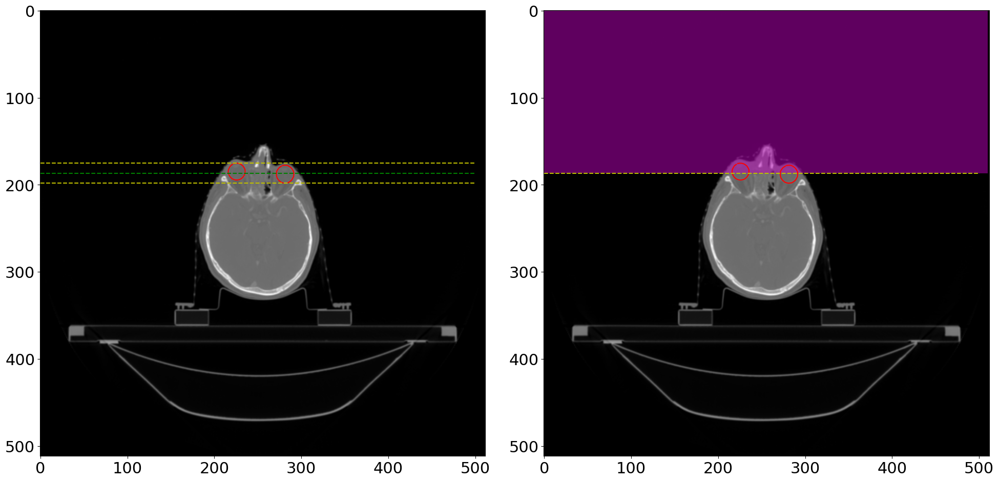

In [245]:

fig = plt.figure(figsize=(20, 10))

fig.add_subplot(1,2,1)
plt.imshow(image[img_slice],cmap='gray')
plt.plot(roi_x, roi_y,'r-')
plt.plot(roi_x2, roi_y2,'r-')
# plt.plot([min_x,min_x],[0,500],'y--')
# plt.plot([max_x,max_x],[0,500],'y--')
plt.plot([0,500],[min_y,min_y],'y--')
plt.plot([0,500],[max_y,max_y],'y--')
plt.plot([0,500],[(max_y-min_y)/2+min_y,(max_y-min_y)/2+min_y],'g--')
# plt.fill([min_x,max_x,max_x,min_x],[0,0,max_y,max_y],"m",alpha=0.5)

fig.add_subplot(1,2,2)
# plot_ROI(image[len(image)-img_slice], roi_x, roi_y)
plt.imshow(image[img_slice],cmap='gray')
plt.plot(roi_x, roi_y,'r-')
plt.plot(roi_x2, roi_y2,'r-')
# plt.plot([min_x,min_x],[0,510],'y--')
# plt.plot([max_x,max_x],[0,510],'y--')
# plt.plot([0,500],[min_y,min_y],'y--')
# plt.plot([0,500],[max_y,max_y],'y--')
plt.plot([0,500],[(max_y-min_y)/2+min_y,(max_y-min_y)/2+min_y],'y--')
plt.fill([0,510,510,0],[0,0,(max_y-min_y)/2+min_y,(max_y-min_y)/2+min_y],"m",alpha=0.5)

fig.tight_layout()
plt.show()

In [246]:
find_ROI_names(RS,'ptv')

['PTV70+PTV60',
 'PTV_ALL',
 'PTV70',
 'PTV60',
 'PTV56',
 'PTV70_OPT 5MM',
 'PTV AND OPTIC',
 'PTV70_OPT3MM']

In [247]:
## Anonymize Image according to eyes (no isodose)
dict_contours_keep,_ = get_all_ROI_contours(find_ROI_names(RS,keyword='brain')+find_ROI_names(RS,keyword='PTV_ALL'),RS)
dict_contours_keep_all,_ = get_all_ROI_contours([f for f in find_ROI_names(RS) if 'OPTIC' not in f and 'body' not in f.lower() and 'non' not in f.lower() and 'eye' not in f.lower() and '^' not in f and f[0] != 'z' and 'globe' not in f.lower() and 'cornea' not in f.lower() and 'lens' not in f.lower() and 'skin' not in f.lower()],RS)
# dict_contours_keep = {}

In [248]:
dict_contours_keep_all.keys()

dict_keys(['BrachialPlexus_L', 'PharCon_Sup', 'BoneRadCalc', 'Brain', 'Pituitary', 'BrachialPlexus_R', 'TemporalLobe_L', 'PharCon_Inf', 'Esophagus_Upper', 'SpinalCord', 'SubmndSalv_R', 'Mandible', 'Parotid_L', 'Larynx', 'TemporalLobe_R', 'Lips', 'Brainstem_PRV5', 'OpticNerve_R', 'OpticNerve_L', 'LUNG_L', 'LUNG_R', 'ESOPHAGUS_2CM', 'PTV70+PTV60', 'PTV_ALL', 'AVOID 56', 'AVOID 60', 'RING 56', 'RING 60', 'RING 70', 'MIDDLE AVOID', 'POST AVOID', 'SHOULDERS', 'Cochlea_R', 'Parotid_R', 'PharCon_Mid', 'Thyroid', 'Cochlea_L', 'SpinalCord_PRV5', 'Chiasm', 'Brainstem', 'OralCavity', 'CTV60', 'CTV70', 'GTV70', 'CARINA', 'CTV56', 'PTV70', 'PTV60', 'PTV56', 'POST Avoid30', 'SubmndSalv_L', 'PHARYNX', 'Optic App', 'Optic PRV', 'Density override', 'CHIASMA PRV3', 'PTV70_OPT 5MM', 'MIDDLE INF', 'PTV70_OPT3MM', 'CouchSurface', 'CouchInterior', 'remove 60', 'remove 55'])

In [249]:
anon,cont = generate_anon_image(image,z_lists,spacing, y_cutoff,reverse_z=False,contours_to_keep=dict_contours_keep,origin=origin)
# x,y,z = generate_anon_image(image,z_lists,spacing, y_cutoff,reverse_z=False,contours_to_keep=dict_contours_keep,origin=origin)

116 -454.5
46
39
46
48
47
44
135
202
106
45
46
53
51
53
19
121
277
304
117
38
37
54
54
64
56
105
97
152
248
184
68
33
31
41
56
74
75
156
94
118
176
176
87
45
32
29
34
68
78
72
103
101
114
132
176
140
64
42
36
25
33
74
77
66
68
160
76
132
166
186
178
110
49
39
37
19
34
79
78
68
67
79
339
58
87
111
167
214
179
88
49
42
39
23
42
83
81
68
71
60
193
85
119
119
85
101
121
105
68
64
64
62
47
58
84
79
64
68
62
119
124
149
187
180
101
79
83
82
85
96
94
88
77
73
86
78
67
71
73
99
82
131
175
199
183
113
78
84
71
73
96
97
92
88
83
89
80
75
74
64
6
73
69
82
114
107
95
84
76
79
65
65
83
86
85
88
88
96
105
141
121
16
-209
71
73
75
77
61
45
42
42
47
64
68
76
87
84
84
89
85
100
124
198
175
2
-345
74
67
67
55
30
38
44
43
42
61
75
85
86
85
83
90
80
94
104
150
144
-4
-410
-39
93
66
48
38
29
39
45
50
43
64
80
85
86
80
77
90
79
87
81
95
100
-9
-448
-101
80
68
55
48
52
53
48
62
56
69
76
86
89
76
78
86
82
84
68
70
81
-6
-467
-200
727
78
75
74
54
50
48
46
60
60
67
76
86
89
80
82
84
84
84
65
65
70
0
-473
-390
4

822
838
798
915
986
790
865
773
743
874
939
838
474
919
828
654
670
800
821
830
137
622
924
744
538
559
734
816
864
697
287
815
880
667
482
481
671
766
825
770
496
931
706
519
427
458
606
609
650
752
81
607
916
529
352
323
410
551
477
569
729
36
76
571
782
379
231
232
339
388
172
444
657
29
52
480
612
243
143
172
271
179
-104
308
472
3
38
407
467
154
90
126
180
-24
-231
277
378
56
6
93
399
357
118
82
115
113
-179
-281
298
429
99
121
65
265
475
270
103
89
120
82
-290
-307
324
520
176
126
151
184
593
585
203
88
89
124
55
-377
-321
354
662
350
78
122
152
450
970
634
162
83
78
118
1
-462
-330
382
807
596
195
74
62
56
60
59
58
57
59
58
58
60
81
108
282
850
1150
595
137
78
71
98
-62
-527
-317
386
864
883
379
73
59
57
64
61
64
62
63
60
66
74
77
82
182
695
1219
1109
509
110
73
73
94
-91
-548
-295
350
829
1090
669
76
73
69
69
67
64
51
58
64
68
80
91
112
473
1123
1209
942
428
92
72
74
95
-78
-505
-283
346
836
1192
1005
23
64
76
70
65
61
61
46
45
58
75
92
105
251
896
1289
1071
876
379
84
62
68
91

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brai

Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brai

Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Bra

Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainste

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL


Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
B

Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brai

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brai

Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brai

Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
B

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brai

Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem


Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
Brain
B

PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV

Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
Brain
Brainstem_PRV5
Brainstem
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV_ALL
PTV

In [ ]:
anon_all,cont = generate_anon_image(image,z_lists,spacing, y_cutoff,reverse_z=reverse_z,contours_to_keep=dict_contours_keep_all,origin=origin)

In [168]:
anon_all,cont = generate_anon_image_remove_all(image,z_lists,spacing, y_cutoff,reverse_z=False,contours_to_keep=dict_contours_keep_all,origin=origin)

NOT REV


In [376]:
dict_contours_keep_all.keys()

dict_keys(['Spc_Retrophar_R', 'Spc_Retrophar_L', 'PTV_7000', 'Pituitary', 'Pharynx', 'Parotid_L', 'OpticNrv_R', 'OpticNrv_L', 'Chiasm', 'Musc_Constrict_S', 'Musc_Constrict_M', 'Musc_Constrict_I', 'Lung~_R', 'Lung~_L', 'Lobe_Temporal_R', 'Lobe_Temporal_L', 'Lips', 'LARYNX_GLOTTIC', 'GTV', 'Glnd_Thyroid', 'Glnd_Submand_R', 'Glnd_Submand_L', 'Parotid_R', 'Esophagus~^2cm', 'Esophagus_S', 'CTV_7000', 'CTV_5600', 'Cochlea_R', 'Cochlea_L', 'Cavity_Oral', 'Carina', 'BRAIN', 'BrachialPlex_R', 'BrachialPlex_L', 'Bones^RadCalc', 'MANDIBLE', 'BRACHIALPLEXS', 'BRSTEM', 'BRSTEM_PRV', 'CONSTRICTOR_MUSC', 'CORD', 'CORD_PRV', 'GTVn', 'GTVp', 'NON-PTV', 'OPTIC', 'PAROTIDS', 'PTV_5600', 'Cavity_Oral-PTV', 'zDensityOverride', 'CouchSurface', 'CouchInterior'])

In [251]:
# anon = anon_all
print(len(anon), len(slices))
slices_copy = slices.copy()
anon_rev = reverse_pixels_hu(anon, slices)
slope = 1.0
intercept = -1000
for i,slice in enumerate(slices_copy):
    slices_copy[i].PixelData = ((anon[i]-intercept)).tobytes() #NOTE: divide by SLOPE IS FUCKED
    

156 156
Intersept: -1000
slope: 1


In [195]:
path_ct

NameError: name 'path_ct' is not defined

In [253]:

save_path_anon = '/data/kayla/anon_imgs/TEST_437/'

for slice in slices_copy:
    if not os.path.exists(save_path_anon+patient):
        os.makedirs(save_path_anon+patient)
    if not os.path.exists(save_path_anon+patient+'/'+CT):
        os.makedirs(save_path_anon+patient+'/'+CT)
    slice.save_as(save_path_anon+patient+'/'+CT+'/'+'CT.'+slice.SOPInstanceUID+'.dcm')
    

In [157]:
dict_contours_body,_ = get_all_ROI_contours(['BODY'],RS)
full_stack_N = generate_anon_body(dict_contours_body,z_lists,y_cutoff_roi, isodose=[], body_name = 'BODY',contours_to_keep=dict_contours_keep)

PTV70+PTV60
xy [['-30.73', '16.2'], ['-30.38', '15.82'], ['-28.49', '13.81'], ['-28.46', '4.28'], ['-28.35', '11.43'], ['-28.0', '3.79'], ['-25.62', '2.39'], ['-25.06', '1.9'], ['-23.23', '0.29'], ['-22.46', '-0.48'], ['-20.85', '-2.09'], ['-20.08', '-2.87'], ['-19.73', '-5.25'], ['-19.52', '-7.63'], ['-18.47', '-8.68'], ['-17.05', '-10.01'], ['-16.08', '-10.92'], ['-14.52', '-12.4'], ['-13.7', '-13.22'], ['-12.23', '-14.78'], ['-11.32', '-15.75'], ['-10.13', '-17.16'], ['-8.94', '-18.58'], ['-8.02', '-19.54'], ['-6.55', '-21.02'], ['-4.17', '-21.85'], ['-4.06', '-21.93'], ['-1.79', '-23.24'], ['0.6', '-22.98'], ['2.98', '-22.79'], ['3.89', '-21.93'], ['5.36', '-20.36'], ['6.13', '-19.54'], ['7.02', '-17.16'], ['7.74', '-16.29'], ['8.81', '-7.63'], ['8.94', '-14.78'], ['9.22', '-12.4'], ['9.36', '-10.01'], ['10.13', '-5.55'], ['10.35', '-5.25'], ['11.24', '-2.87'], ['11.77', '4.28'], ['11.91', '-0.48'], ['12.02', '1.9'], ['12.51', '5.83'], ['12.95', '6.67'], ['13.48', '9.05'], ['13.7',

In [183]:
roi_ref = '1'

In [182]:
RS

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 188
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: RT Structure Set Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.246.352.221.54162806448186087767563333417651109794
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.246.352.70.2.1.160.3
(0002, 0013) Implementation Version Name         SH: 'DCIE 2.2'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0012) Instance Creation Date              DA: '20240330'
(0008, 0013) Instance Creation Time              TM: '161501'
(0008, 0016) SOP Class UID                       UI: RT Structure Set Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.246.352.221.54162806448186087767563333417651

In [208]:
slices[i].SOPInstanceUID 

'1.2.246.352.221.5397655999331664119686290552913020802'

In [354]:
patient

'743'

In [377]:
img_slice

110

In [215]:
find_ROI_names(RS,'brain')

['BrainStem', 'BrainStem PRV', 'BRAIN']

In [74]:
slices[img_slice].pixel_array

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [75]:
slices_copy[img_slice].pixel_array

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [76]:
slice_copy = slices[0].copy()
slice_copy.PixelData = anon[0].tobytes()

In [65]:
plt.imshow(slices_copy[122].pixel_array)
# plt.plot(X,Y,'r-')
# plt.imshow(anon[img_slice])

NameError: name 'slices_copy' is not defined

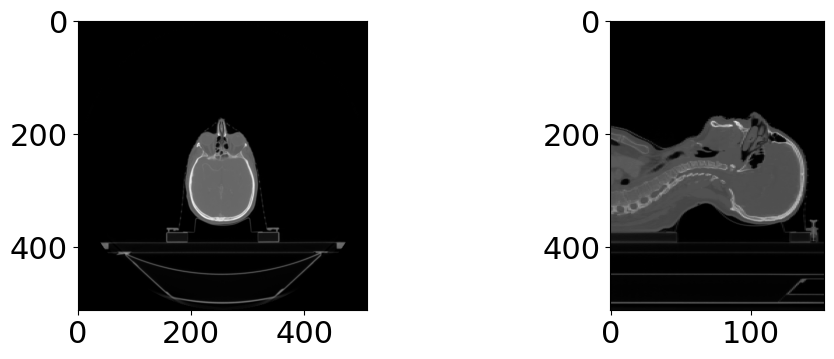

In [165]:
plot_3_views(slices, img_slice)

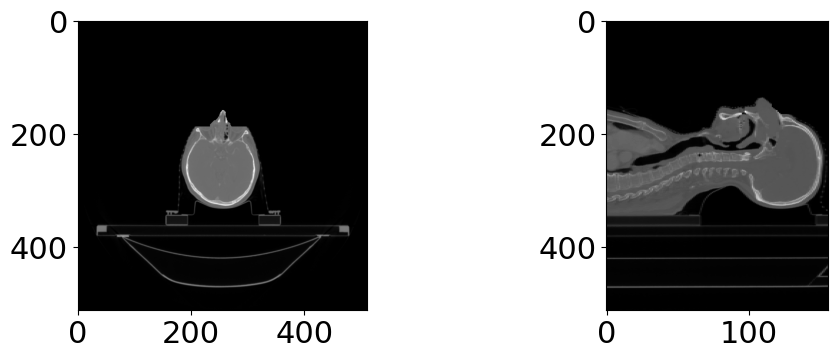

In [250]:
plot_3_views(slices, img_slice,anon)

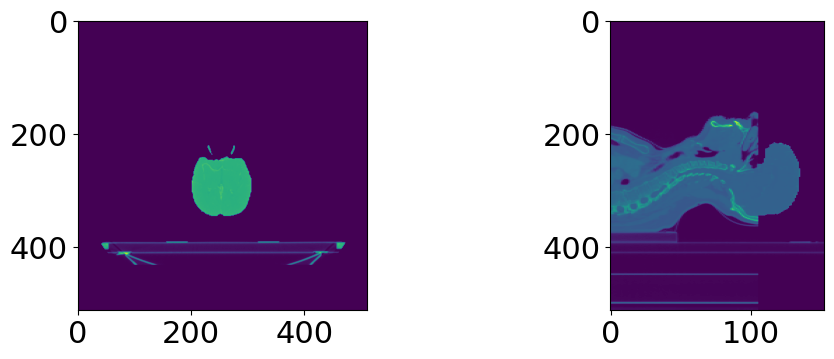

In [585]:
plot_3_views(slices, img_slice,anon_all)

In [551]:
len(anon_all[100:])

53

In [449]:
all_ROIs = [r for r in find_ROI_names(RS) if 'body' not in r.lower() and 'skin' not in r.lower() and r[0] != 'z' and '^' not in r]# and 'eye' not in r.lower() and 'lens' not in r.lower()]
print(all_ROIs)
# all_ROIs = 
dict_contours_keep, z_lists_b = get_all_ROI_contours(all_ROIs, RS)

['Spc_Retrophar_R', 'Spc_Retrophar_L', 'PTV_7000', 'Pituitary', 'Pharynx', 'Parotid_L', 'OpticNrv_R', 'OpticNrv_L', 'Chiasm', 'Musc_Constrict_S', 'Musc_Constrict_M', 'Musc_Constrict_I', 'Lung~_R', 'Lung~_L', 'Lobe_Temporal_R', 'Lobe_Temporal_L', 'Lips', 'Lens_R', 'Lens_L', 'LARYNX_GLOTTIC', 'GTV', 'Glnd_Thyroid', 'Glnd_Submand_R', 'Glnd_Submand_L', 'Globe_R', 'Parotid_R', 'Globe_L', 'Esophagus_S', 'CTV_7000', 'CTV_5600', 'Cochlea_R', 'Cochlea_L', 'Cavity_Oral', 'Carina', 'BRAIN', 'BrachialPlex_R', 'BrachialPlex_L', 'MANDIBLE', 'BRACHIALPLEXS', 'BRSTEM', 'BRSTEM_PRV', 'CONSTRICTOR_MUSC', 'CORD', 'CORD_PRV', 'GTVn', 'GTVp', 'NON-PTV', 'OPTIC', 'PAROTIDS', 'PTV_5600', 'Cavity_Oral-PTV', 'CouchSurface', 'CouchInterior']


In [167]:
anon_all_keep,cont = generate_anon_image_remove_all(image,z_lists,spacing, y_cutoff,reverse_z=False,contours_to_keep=dict_contours_keep,origin=origin)

NOT REV


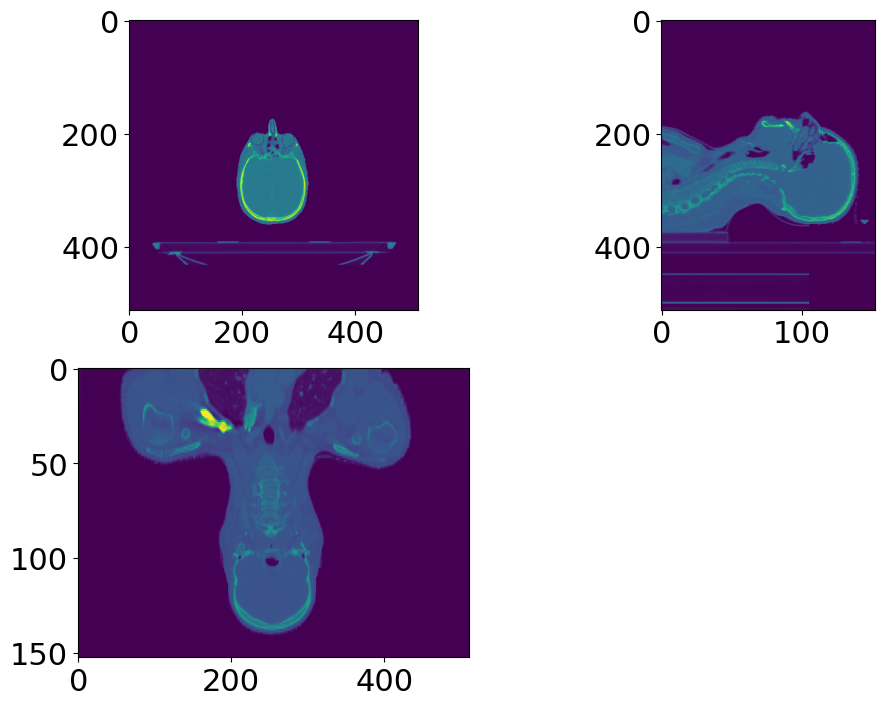

In [451]:
plot_3_views(slices, img_slice,anon_all_keep,True)

In [102]:
plot_all_contours(RS,anon_all_keep,img_slice,origin,spacing,ignore_terms=[])

NameError: name 'get_ROI_colour_dict' is not defined

In [1149]:
all_ROIs

['BrachialPlex_L',
 'Musc_Constrict_S',
 'Brain',
 'Pituitary',
 'BrachialPlex_R',
 'Lobe_Temporal_L',
 'Musc_Constrict_I',
 'Esophagus~_S',
 'SpinalCord~',
 'Bone_Mandible',
 'Parotid_L',
 'Larynx',
 'Lobe_Temporal_R',
 'Lips',
 'Brainstem_PRV03',
 'OpticNrv_R',
 'OpticNrv_L',
 'Lung~_L',
 'Lung~_R',
 'Esophagus~^2cm',
 'Cochlea_R',
 'Parotid_R',
 'Musc_Constrict_M',
 'Glnd_Thyroid',
 'Cochlea_L',
 'SpinalCord~_PRV5',
 'OpticChiasm',
 'Brainstem',
 'Cavity_Oral',
 'CTV_6000',
 'CTV_7000',
 'GTV',
 'Carina',
 'PTV_7000-05',
 'PTV!_6000-05',
 'Pharynx',
 'Glnd_Submand_R',
 'Glnd_Submand_L',
 'OpticChiasm_PRV',
 'OpticApp',
 'OpticApp_PRV',
 'OpticNrv_PRV_L',
 'OpticNrv_PRV_R',
 'Level_Retropha_R',
 'Level_Retropha_L',
 'Level_Parapha_L',
 'Level_Parapha_R',
 'GTVn',
 'PTV_Eval_7000',
 'ZPTVOP54+OPTIC',
 'z  _PTVOPT70_SUP',
 'CouchSurface',
 'CouchInterior']

-807.5
-804.5
-801.5
-798.5
-795.5
-792.5
-789.5
-786.5
-783.5
-780.5
-777.5
-774.5
-771.5
-768.5
-765.5
-762.5
-759.5
-756.5
-753.5
-750.5
-747.5
-744.5
-741.5
-738.5
-735.5
-732.5
-729.5
-726.5
-723.5
-720.5
-717.5
-714.5
-711.5
-708.5
-705.5
-702.5
-699.5
-696.5
-693.5
-690.5
-687.5
-684.5
-681.5
-678.5
-675.5
-672.5
-669.5
-666.5
-663.5
-660.5
-657.5
-654.5
-651.5
-648.5
-645.5
-642.5
-639.5
-636.5
-633.5
-630.5
-627.5
-624.5
-621.5
-618.5
-615.5
-612.5
-609.5
-606.5
-603.5
-600.5
-597.5
-594.5
-591.5
-588.5
-585.5
-582.5
-579.5
-576.5
-573.5
-570.5
-567.5
-564.5
-561.5
-558.5
-555.5
-552.5
-549.5
-546.5
-543.5
-540.5
-537.5
-534.5
-531.5
-528.5
-525.5
-522.5
-519.5
-516.5
-513.5
-510.5
-507.5
-504.5
-501.5
-498.5
-495.5
-492.5
-489.5
-486.5
-483.5
-480.5
-477.5
-474.5
-471.5
-468.5
-465.5
-462.5
-459.5
-456.5
-453.5
-450.5
-447.5
-444.5
-441.5
-438.5
-435.5
-432.5
-429.5
-426.5
-423.5
-420.5
-417.5
-414.5
-411.5
-408.5
-405.5
-402.5
-399.5
-396.5
-393.5
-390.5
-387.5
dict_keys(['-

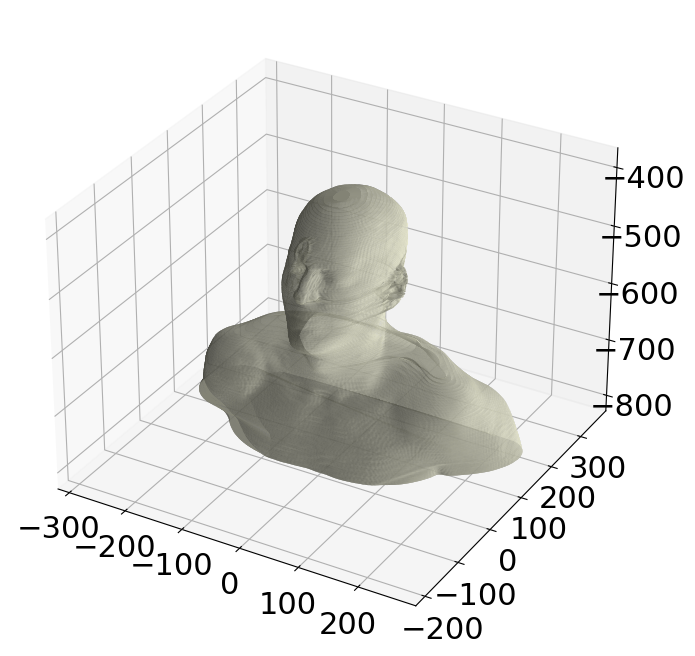

In [17]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ptsL, trianglesL = generate_mesh_from_RS(RS,'BODY',z_max=7)
ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='beige')  
ax.set_aspect('equal', adjustable='box')
plt.show()

BrachialPlex_L
dict_keys(['-149.0', '-146.0', '-143.0', '-140.0', '-137.0', '-134.0', '-131.0', '-128.0', '-125.0', '-122.0', '-119.0', '-116.0', '-113.0', '-110.0', '-107.0', '-104.0', '-101.0', '-98.0', '-95.0', '-92.0', '-89.0', '-86.0', '-44.0'])
Musc_Constrict_S
dict_keys(['-83.0', '-80.0', '-77.0', '-74.0', '-71.0', '-68.0', '-65.0', '-62.0', '-59.0', '-56.0', '-53.0', '-50.0', '-47.0', '-44.0', '-41.0', '-38.0', '-35.0', '-32.0'])
Brain
dict_keys(['-14.0', '-11.0', '-8.0', '-5.0', '-2.0', '1.0', '4.0', '7.0', '10.0', '13.0', '16.0', '19.0', '22.0', '25.0', '28.0', '31.0', '34.0', '37.0', '40.0', '43.0', '46.0', '49.0', '52.0', '55.0', '58.0', '61.0', '64.0', '67.0', '70.0', '73.0', '76.0', '79.0', '82.0', '85.0', '88.0', '91.0', '94.0', '97.0', '100.0', '103.0', '106.0', '109.0', '112.0', '115.0', '118.0', '121.0', '124.0'])
Pituitary
dict_keys(['-47.0', '22.0', '25.0'])
BrachialPlex_R
dict_keys(['-152.0', '-149.0', '-146.0', '-143.0', '-140.0', '-137.0', '-134.0', '-131.0', '-1

GTV
dict_keys(['-74.0', '-71.0', '-68.0', '-65.0', '-62.0', '-59.0', '-56.0', '-53.0', '-50.0', '-47.0', '-44.0', '-41.0', '-38.0', '-35.0', '-32.0', '-29.0', '-26.0', '-23.0', '-20.0', '-17.0', '-14.0', '-11.0', '-8.0', '-5.0', '-2.0', '1.0', '4.0', '7.0', '10.0', '13.0', '16.0', '19.0', '22.0', '25.0', '28.0', '31.0'])
Carina
dict_keys(['-257.0', '-254.0', '-251.0', '-248.0', '-245.0', '-242.0', '-239.0', '-236.0', '-233.0', '-230.0', '-227.0', '-224.0', '-221.0', '-218.0', '-215.0', '-212.0', '-209.0', '-206.0', '-203.0', '-200.0', '-197.0', '-194.0', '-191.0', '-188.0', '-185.0', '-182.0', '-179.0', '-176.0', '-173.0', '-170.0', '-167.0', '-164.0'])
PTV_7000-05
dict_keys(['-86.0', '-83.0', '-80.0', '-77.0', '-74.0', '-71.0', '-68.0', '-65.0', '-62.0', '-59.0', '-56.0', '-53.0', '-50.0', '-47.0', '-44.0', '-41.0', '-38.0', '-35.0', '-32.0', '-29.0', '-26.0', '-23.0', '-20.0', '-17.0', '-14.0', '-11.0', '-8.0', '-5.0', '-2.0', '1.0', '4.0', '7.0', '10.0', '13.0', '16.0', '19.0', '22.

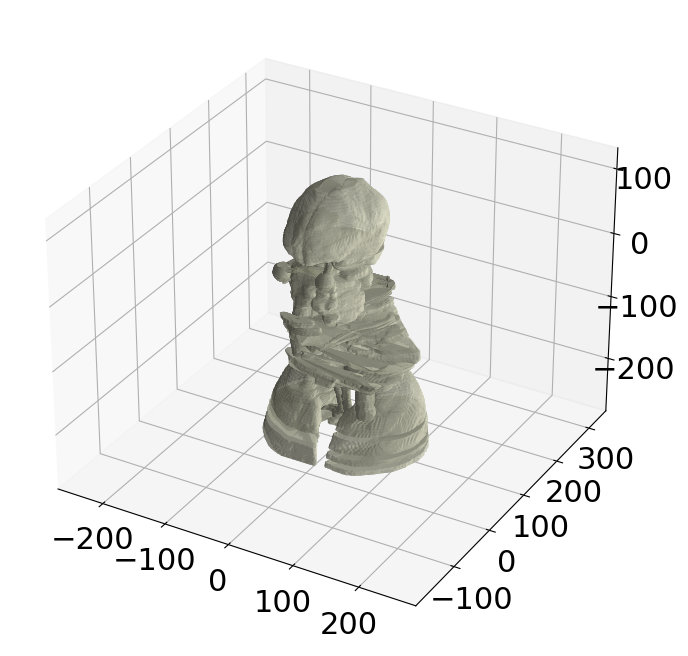

In [1158]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
# ptsL, trianglesL = generate_mesh_from_RS(RS,'BODY',z_max=min([min(z) for z in z_lists]))
# ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='beige')  
# ax.set_aspect('equal', adjustable='box')

for roi in all_ROIs:
    if 'Couch' in roi:
        continue
    print(roi)
    ptsL, trianglesL = generate_mesh_from_RS(RS,roi)
    ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='beige')

# ptsL, trianglesL = generate_mesh_from_RS(RS,'BODY',z_max=min([min(z) for z in z_lists]))
# ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='beige')  
ax.set_aspect('equal', adjustable='box')
plt.show()

In [318]:
slices[122].ImagePositionPatient

[-301, -204, -462.5]

In [ ]:
dict_contours_brain, z_lists_brain = get_all_ROI_contours(['BRAIN'], RS)
roi_brain = get_ROI_slice(z_ear, z_lists_brain[0])

In [321]:
img_slice=122
slice
for j,row in enumerate(image[img_slice]):
    new_row = [-1000]*len(row)

current_z = -462.5
for c_slice in dict_contours_keep['BRAIN']:
    if c_slice[2] == current_z:

        xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
        X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)

        cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
        cont_xy = cont_xy.reshape((-1,1,2))

        for k in range(len(new_row)):
            result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
            if result == 1:
                new_row[k] = row[k]


In [127]:
ROI_colours = get_ROI_colour_dict(RS)
ROI_names = find_ROI_names(RS)
print(ROI_names)
# dict_contours = get
dict_contours_b, z_lists_b = get_all_ROI_contours(['BRAIN'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_x, roi_y = get_ROI_pixel_array(dict_contours_b['BRAIN'][roi_brain],start_x,start_y,pixel_spacing)

dict_contours_b, z_lists_b = get_all_ROI_contours(['Chiasm'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_xo, roi_yo = get_ROI_pixel_array(dict_contours_b['Chiasm'][roi_brain],start_x,start_y,pixel_spacing)

# dict_contours_b, z_lists_b = get_all_ROI_contours(['BRSTEM'], RS)
# roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
# roi_xbs, roi_ybs= get_ROI_pixel_array(dict_contours_b['BRSTEM'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['OpticNrv_R'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_xor, roi_yor= get_ROI_pixel_array(dict_contours_b['OpticNrv_R'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['OpticNrv_L'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_xol, roi_yol= get_ROI_pixel_array(dict_contours_b['OpticNrv_L'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['BODY'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_xb, roi_yb= get_ROI_pixel_array(dict_contours_b['BODY'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Globe_R'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_xer, roi_yer= get_ROI_pixel_array(dict_contours_b['Globe_R'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Globe_L'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_xel, roi_yel= get_ROI_pixel_array(dict_contours_b['Globe_L'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Lens_R'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_xlr, roi_ylr= get_ROI_pixel_array(dict_contours_b['Lens_R'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Lens_L'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])[0]
roi_xll, roi_yll= get_ROI_pixel_array(dict_contours_b['Lens_L'][roi_brain],start_x,start_y,pixel_spacing)

['BODY', 'Spc_Retrophar_R', 'Spc_Retrophar_L', 'PTV_7000', 'Pituitary', 'Pharynx', 'Parotid_L', 'OpticNrv_R', 'OpticNrv_L', 'Chiasm', 'Musc_Constrict_S', 'Musc_Constrict_M', 'Musc_Constrict_I', 'Lung~_R', 'Lung~_L', 'Lobe_Temporal_R', 'Lobe_Temporal_L', 'Lips', 'Lens_R', 'Lens_L', 'LARYNX_GLOTTIC', 'GTV', 'Glnd_Thyroid', 'Glnd_Submand_R', 'Glnd_Submand_L', 'Globe_R', 'Parotid_R', 'Globe_L', 'Esophagus~^2cm', 'Esophagus_S', 'CTV_7000', 'CTV_5600', 'Cochlea_R', 'Cochlea_L', 'Cavity_Oral', 'Carina', 'BRAIN', 'BrachialPlex_R', 'BrachialPlex_L', 'Bones^RadCalc', 'MANDIBLE', 'BRACHIALPLEXS', 'BRSTEM', 'BRSTEM_PRV', 'CONSTRICTOR_MUSC', 'CORD', 'CORD_PRV', 'GTVn', 'GTVp', 'NON-PTV', 'OPTIC', 'PAROTIDS', 'PTV_5600', 'SKIN', 'Cavity_Oral-PTV', 'zDensityOverride', 'CouchSurface', 'CouchInterior', 'Skin_5mm']


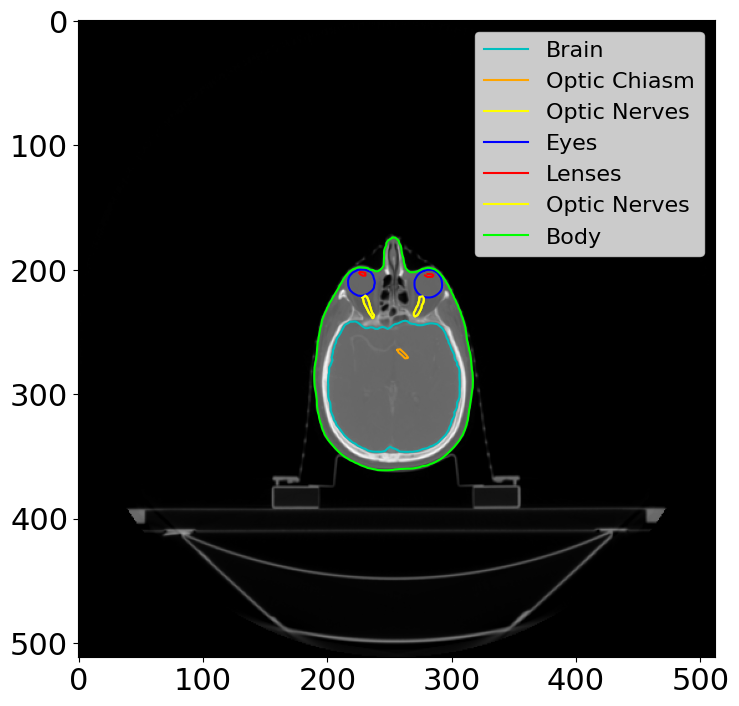

In [132]:
plt.imshow(image[img_slice],cmap='gray')
plt.plot(roi_x,roi_y,'c-',label='Brain')
plt.plot(roi_xo,roi_yo,'-',color='orange',label='Optic Chiasm')
# plt.plot(roi_xbs,roi_ybs,'-',color='magenta',label='Brainstem')
plt.plot(roi_xor,roi_yor,'-',color='yellow')
plt.plot(roi_xol,roi_yol,'-',color='yellow',label='Optic Nerves')
plt.plot(roi_xer,roi_yer,'-',color='blue')
plt.plot(roi_xel,roi_yel,'-',color='blue',label='Eyes')
plt.plot(roi_xlr,roi_ylr,'-',color='red')
plt.plot(roi_xll,roi_yll,'-',color='red',label='Lenses')
plt.plot(roi_xor,roi_yor,'-',color='yellow')
plt.plot(roi_xol,roi_yol,'-',color='yellow',label='Optic Nerves')
plt.plot(roi_xb,roi_yb,'-',color='lime',label='Body')
plt.legend(prop={'size': 16})

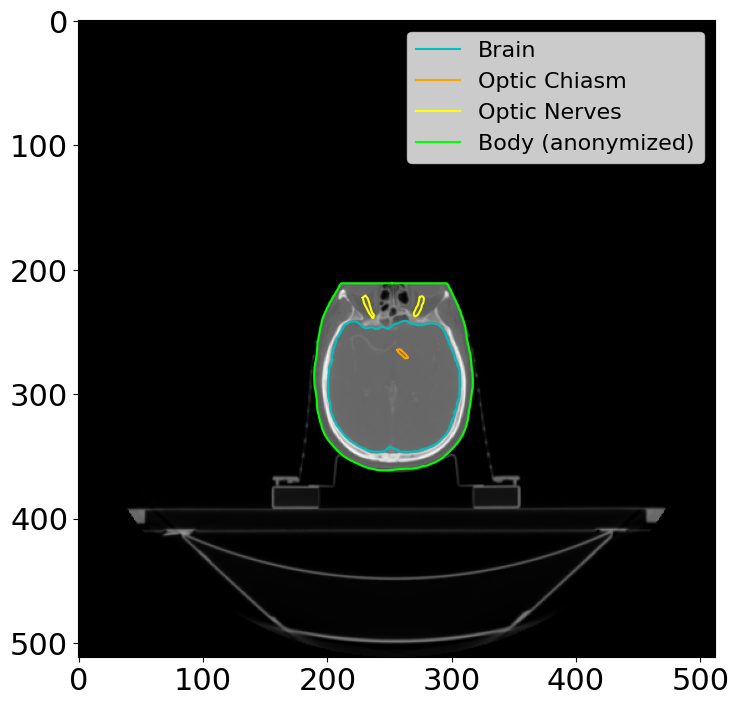

In [151]:
plt.imshow(anon[img_slice],cmap='gray')
plt.plot(roi_x,roi_y,'c-',label='Brain')
plt.plot(roi_xo,roi_yo,'-',color='orange',label='Optic Chiasm')
# plt.plot(roi_xbs,roi_ybs,'-',color='magenta',label='Brainstem')
plt.plot(roi_xor,roi_yor,'-',color='yellow')
plt.plot(roi_xol,roi_yol,'-',color='yellow',label='Optic Nerves')
plt.plot(x_new,y_new,'-',color='lime',label='Body (anonymized)')
plt.legend(prop={'size': 16})

NameError: name 'X' is not defined

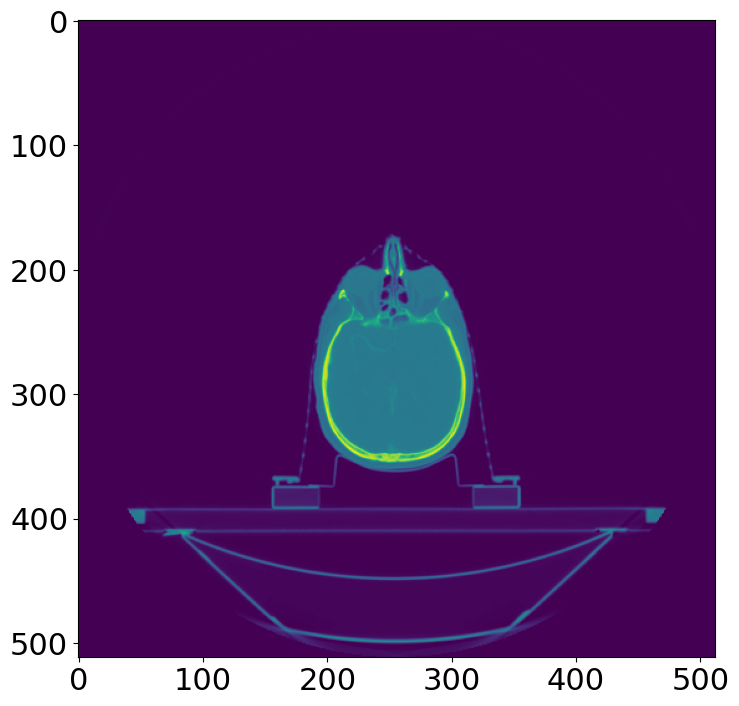

In [129]:

plt.imshow(image[img_slice])
plt.plot(X,Y,'r-')

In [234]:
ROI_colours = get_ROI_colour_dict(RS)
ROI_names = find_ROI_names(RS)
print(ROI_names)
# dict_contours = get
dict_contours_b, z_lists_b = get_all_ROI_contours(['BRAIN'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_x, roi_y = get_ROI_pixel_array(dict_contours_b['BRAIN'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Optic Chiasm'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xo, roi_yo = get_ROI_pixel_array(dict_contours_b['Optic Chiasm'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['BRSTEM'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xbs, roi_ybs= get_ROI_pixel_array(dict_contours_b['BRSTEM'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Optic Nerve - Rt'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xor, roi_yor= get_ROI_pixel_array(dict_contours_b['Optic Nerve - Rt'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Optic Nerve-Lt'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xol, roi_yol= get_ROI_pixel_array(dict_contours_b['Optic Nerve-Lt'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['BODY'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xb, roi_yb= get_ROI_pixel_array(dict_contours_b['BODY'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Orbit - right'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xer, roi_yer= get_ROI_pixel_array(dict_contours_b['Orbit - right'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Orbit - left'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xel, roi_yel= get_ROI_pixel_array(dict_contours_b['Orbit - left'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Lens - right'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xlr, roi_ylr= get_ROI_pixel_array(dict_contours_b['Lens - right'][roi_brain],start_x,start_y,pixel_spacing)
dict_contours_b, z_lists_b = get_all_ROI_contours(['Lens - left'], RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xll, roi_yll= get_ROI_pixel_array(dict_contours_b['Lens - left'][roi_brain],start_x,start_y,pixel_spacing)

NameError: name 'get_ROI_colour_dict' is not defined

In [416]:
PTV_names=find_ROI_names(RS,'PTV')

In [142]:
dict_contours_b, z_lists_b = get_all_ROI_contours(PTV_names, RS)
roi_brain = get_ROI_slice(z_smg, z_lists_b[0])
roi_xll, roi_yll= get_ROI_pixel_array(dict_contours_b['PTV_ALL'][roi_brain],start_x,start_y,pixel_spacing)

NameError: name 'PTV_names' is not defined

In [143]:
find_ROI_names(RS,'body')

['BODY']

In [144]:
dict_contours_body,_ = get_all_ROI_contours(['BODY'],RS)

In [150]:
full_stack_N = generate_anon_body(dict_contours_body,z_lists=z_lists,y_cutoff=y_cutoff_roi,reverse_z=reverse_z,contours_to_keep=dict_contours_keep)
for slice in full_stack_N:
    if slice[2] == z_smg:
#         print(slice)
        break
x_new_body = slice[::3] 
y_new_body = slice[1::3] 
z_new_body =slice[2::3] 
x_new, y_new, z_new = xyz_to_image_coords(x_new_body,y_new_body,z_new_body,spacing,origin)

BRAIN
{'BRAIN': {}}


In [480]:
img_slice = get_image_slice(start_z, z_smg, [0,0,z_spacing])
print("Centre ROI slice:", img_slice)

Centre ROI slice: 119


In [481]:
# roi_x, roi_y = get_ROI_pixel_array(dict_contours[eye_ROI_names[0]][roi_slice],start_x,start_y,pixel_spacing)
# roi_x2, roi_y2 = get_ROI_pixel_array(dict_contours[eye_ROI_names[1]][roi_slice],start_x,start_y,pixel_spacing)

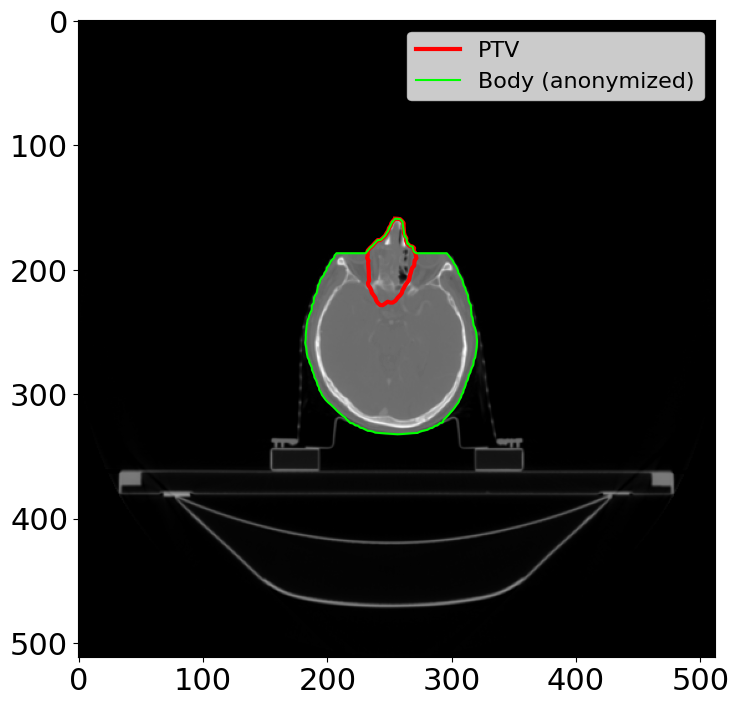

In [495]:
plt.imshow(anon[119],cmap='gray')
# plt.plot(roi_x,roi_y,'c-',label='Brain')
# plt.plot(roi_xo,roi_yo,'-',color='orange',label='Optic Chiasm')
# plt.plot(roi_xbs,roi_ybs,'-',color='magenta',label='Brainstem')
# plt.plot(roi_xor,roi_yor,'-',color='yellow')
# plt.plot(roi_xll,roi_yll,'-',color='yellow',label='Optic Nerves')
plt.plot(x,y,'-r',linewidth=3,label="PTV")
plt.plot(x_new,y_new,'-',color='lime',label='Body (anonymized)')
plt.legend(prop={'size': 16})

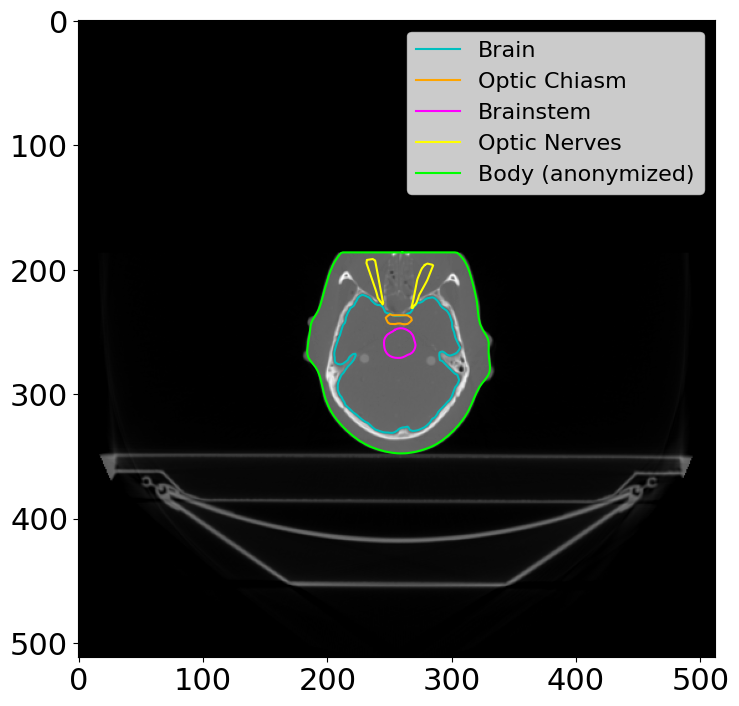

In [217]:
plt.imshow(anon[43],cmap='gray')
plt.plot(roi_x,roi_y,'c-',label='Brain')
plt.plot(roi_xo,roi_yo,'-',color='orange',label='Optic Chiasm')
plt.plot(roi_xbs,roi_ybs,'-',color='magenta',label='Brainstem')
plt.plot(roi_xor,roi_yor,'-',color='yellow')
plt.plot(roi_xol,roi_yol,'-',color='yellow',label='Optic Nerves')
plt.plot(x_new,y_new,'-',color='lime',label='Body (anonymized)')
plt.legend(prop={'size': 16})

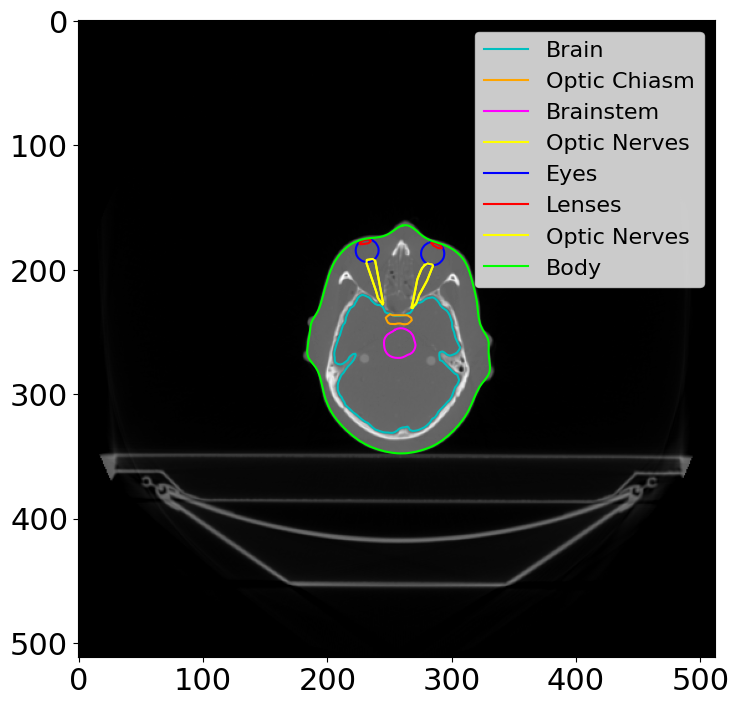

In [222]:
plt.imshow(image[43],cmap='gray')
plt.plot(roi_x,roi_y,'c-',label='Brain')
plt.plot(roi_xo,roi_yo,'-',color='orange',label='Optic Chiasm')
plt.plot(roi_xbs,roi_ybs,'-',color='magenta',label='Brainstem')
plt.plot(roi_xor,roi_yor,'-',color='yellow')
plt.plot(roi_xol,roi_yol,'-',color='yellow',label='Optic Nerves')
plt.plot(roi_xer,roi_yer,'-',color='blue')
plt.plot(roi_xel,roi_yel,'-',color='blue',label='Eyes')
plt.plot(roi_xlr,roi_ylr,'-',color='red')
plt.plot(roi_xll,roi_yll,'-',color='red',label='Lenses')
plt.plot(roi_xor,roi_yor,'-',color='yellow')
plt.plot(roi_xol,roi_yol,'-',color='yellow',label='Optic Nerves')
plt.plot(roi_xb,roi_yb,'-',color='lime',label='Body')
plt.legend(prop={'size': 16})

In [69]:
body_ROI_names = find_ROI_names(RS,keyword='body')
print(body_ROI_names)
dict_contours_body, z_lists_body = get_all_ROI_contours(body_ROI_names, RS)
# roi_slice, z_smg_body = get_avg_ROI_z_and_slice(z_lists)

['BODY']


In [91]:
#TO DO -- finish below

In [140]:
def get_uni_spline(xi,yi):
    
        # Fit spline with s=0 (passing through all points)
    tck = interpolate.UnivariateSpline(xi, yi, s=0)
        
#         # Evaluate spline for 1000 evenly spaced points
#         xj, yj = interpolate.splev(np.linspace(0, 1, 1000), tck)
    return tck
        
        

In [139]:
def get_contour_curves(slices, all_z_slices, y_cutoff_roi):
    dict_curves = {}
    
    for c_slice in slices:
#         print(c_slice[2] )
        z = c_slice[2]
        if z in all_z_slices or z>min(all_z_slices):
#             print(z)
            
            

            xo = []
            yo = []
            x_prev = -1000

            xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
            for k,y_i in enumerate(yi):
            #         print(xi[k])
                if y_i < y_cutoff_roi and x_prev != xi[k]:
                    xo.append(xi[k])
                    yo.append(yi[k])
                    x_prev = xi[k]
                    
            
            if len(xo)> 3 and len(yo) > 3:
                
                

                xy = [[xs,ys] for xs, ys in sorted(zip(xo, yo))]
                print("xy",xy)
                xs, ys = zip(*xy)
                print("xs",xs)
#                 x_prev = -1000
                xs = list(xs)
                ys = list(ys)
                
                ind_to_del = []
                
#                 i = 1
                for i,x in enumerate(xs):
                    print(i,x)
                    print(x, xs[i-1])
                    if x == xs[i-1]:
                        print("YRD")
                        if  ys[i] > ys[i-1]:
                            ind_to_del.append(i-1)

                        else:
                            ind_to_del.append(i)
#                     i+=1
                
                offset =0
                for ind in ind_to_del:
                    del xs[ind-offset]
                    del ys[ind-offset]
                    offset+=1
                    
#                         print(len(xs))
#                         if  ys[i] > ys[i-1]:
#                             del ys[i-1]
#                             del xs[i-1]

#                         else:
#                             del ys[i]
#                             del xs[i]
#                         i-=1
                   
    

                        
                print(xs)
                print(ys)

                s =  get_uni_spline(xs, ys)
    #             print(s)
                dict_curves[z] = {}
                dict_curves[z]['spline'] = s
                dict_curves[z]['x_max'] = max(xs)
                dict_curves[z]['x_min'] = min(xs)
    return dict_curves

In [68]:
dict_curve = get_contour_curves( dict_contours['Eye_R'], all_z_slices, y_cutoff_roi)

KeyError: 'Eye_R'

In [95]:
dict_curve[z_smg]

NameError: name 'dict_curve' is not defined

In [95]:
zm = -486.5
eye_r = dict_contours_eyes_lens['Eye_R']
for c_slice in eye_r:
    if c_slice[2] == zm:
        xie, yie, zie = c_slice[::3], c_slice[1::3], c_slice[2::3]
        break
for c_slice in dict_contours_eyes_lens['Lens_R']:
    if c_slice[2] == zm:
        xil, yil, zil = c_slice[::3], c_slice[1::3], c_slice[2::3]
        break
        
# e_slice = 

# s = get_uni_spline(xs,ys)

# xj = np.linspace(min(xs), max(xs), 100)
# yj = s(xj)
# # xj, yj = interpolate.splev(np.linspace(0, 1, 100), s)

NameError: name 'dict_contours_eyes_lens' is not defined

In [104]:
z_lists

[[124.5,
  127.0,
  129.5,
  132.0,
  134.5,
  137.0,
  139.5,
  142.0,
  144.5,
  147.0,
  149.5,
  152.0],
 [124.5,
  127.0,
  129.5,
  132.0,
  134.5,
  137.0,
  139.5,
  142.0,
  144.5,
  147.0,
  149.5,
  152.0]]

In [159]:
full_stack_N = generate_anon_body(dict_contours_body,z_lists,y_cutoff_roi, isodose=[], body_name = 'BODY',contours_to_keep=dict_contours_keep)
pts, triangles = generate_mesh_from_array(full_stack_N)


PTV70+PTV60
xy [['-30.73', '16.2'], ['-30.38', '15.82'], ['-28.49', '13.81'], ['-28.46', '4.28'], ['-28.35', '11.43'], ['-28.0', '3.79'], ['-25.62', '2.39'], ['-25.06', '1.9'], ['-23.23', '0.29'], ['-22.46', '-0.48'], ['-20.85', '-2.09'], ['-20.08', '-2.87'], ['-19.73', '-5.25'], ['-19.52', '-7.63'], ['-18.47', '-8.68'], ['-17.05', '-10.01'], ['-16.08', '-10.92'], ['-14.52', '-12.4'], ['-13.7', '-13.22'], ['-12.23', '-14.78'], ['-11.32', '-15.75'], ['-10.13', '-17.16'], ['-8.94', '-18.58'], ['-8.02', '-19.54'], ['-6.55', '-21.02'], ['-4.17', '-21.85'], ['-4.06', '-21.93'], ['-1.79', '-23.24'], ['0.6', '-22.98'], ['2.98', '-22.79'], ['3.89', '-21.93'], ['5.36', '-20.36'], ['6.13', '-19.54'], ['7.02', '-17.16'], ['7.74', '-16.29'], ['8.81', '-7.63'], ['8.94', '-14.78'], ['9.22', '-12.4'], ['9.36', '-10.01'], ['10.13', '-5.55'], ['10.35', '-5.25'], ['11.24', '-2.87'], ['11.77', '4.28'], ['11.91', '-0.48'], ['12.02', '1.9'], ['12.51', '5.83'], ['12.95', '6.67'], ['13.48', '9.05'], ['13.7',

In [567]:
# lens_names = find_ROI_names(RS,'lens')
eye_names = find_ROI_names(RS,'eye')
brain_names = find_ROI_names(RS,'brain')
mandible_names = find_ROI_names(RS,'mandible')
print(mandible_names)

['Bone_Mandible']


In [596]:
z_lists_eye_lens

[[-501.5, -498.5, -495.5, -492.5, -489.5, -486.5, -483.5, -480.5, -477.5],
 [-498.5, -495.5, -492.5, -489.5, -486.5, -483.5, -480.5, -477.5, -474.5],
 [-492.5, -489.5, -486.5],
 [-489.5, -486.5, -483.5]]

In [584]:
dict_contours_eyes_lens, z_lists_eye_lens = get_all_ROI_contours(eye_names + lens_names, RS)

In [106]:
full_stack_N = generate_anon_body(dict_contours_body,z_lists,y_cutoff_roi, isodose=[], body_name = 'BODY',contours_to_keep=dict_contours_eyes_lens)
pts, triangles = generate_mesh_from_array(full_stack_N)

NameError: name 'dict_contours_eyes_lens' is not defined

In [147]:
full_stack_N = generate_anon_body(dict_contours_body,z_lists,y_cutoff_roi)
pts, triangles = generate_mesh_from_array(full_stack_N,z_cutoff=-50)

NameError: name 'dict_contours_body' is not defined

In [594]:
ptsL, trianglesL = generate_mesh_from_RS(RS,'Eye_L')
ptsR, trianglesR = generate_mesh_from_RS(RS,'Eye_R')
ptsLL, trianglesLL = generate_mesh_from_RS(RS,'Lens_L')
ptsLR, trianglesLR = generate_mesh_from_RS(RS,'Lens_R')

dict_keys(['-498.5', '-495.5', '-492.5', '-489.5', '-486.5', '-483.5', '-480.5', '-477.5', '-474.5'])
dict_keys(['-501.5', '-498.5', '-495.5', '-492.5', '-489.5', '-486.5', '-483.5', '-480.5', '-477.5'])
dict_keys(['-489.5', '-486.5', '-483.5'])
dict_keys(['-492.5', '-489.5', '-486.5'])


In [96]:
find_ROI_names(RS, 'PTV')

['PTV1']

In [609]:
ptsL, trianglesL = generate_mesh_from_RS(RS,'PTV_7000')
ptsR, trianglesR = generate_mesh_from_RS(RS,'PTV_Eval_5600')
ptsLL, trianglesLL = generate_mesh_from_RS(RS,'PTV_Eval_6300')
# ptsLR, trianglesLR = generate_mesh_from_RS(RS,'Lens_R')


dict_keys(['-624.5', '-621.5', '-618.5', '-615.5', '-612.5', '-609.5', '-606.5', '-603.5', '-600.5', '-597.5', '-594.5', '-591.5', '-588.5', '-585.5', '-582.5'])
dict_keys(['-708.5', '-705.5', '-702.5', '-699.5', '-696.5', '-693.5', '-690.5', '-687.5', '-684.5', '-681.5', '-678.5', '-675.5', '-672.5', '-669.5', '-666.5', '-663.5', '-660.5', '-657.5', '-654.5', '-651.5', '-648.5', '-645.5', '-642.5', '-639.5', '-636.5', '-633.5', '-630.5', '-627.5', '-624.5', '-621.5', '-618.5', '-615.5', '-612.5', '-609.5', '-606.5', '-603.5', '-600.5', '-597.5', '-594.5', '-591.5', '-588.5', '-585.5', '-582.5', '-579.5', '-576.5', '-573.5', '-570.5', '-561.5', '-558.5', '-555.5', '-552.5', '-549.5', '-546.5', '-543.5'])
dict_keys(['-654.5', '-651.5', '-648.5', '-645.5', '-642.5', '-639.5', '-636.5', '-633.5', '-630.5', '-627.5', '-624.5', '-621.5', '-618.5', '-615.5', '-612.5', '-609.5', '-606.5', '-603.5', '-600.5', '-597.5', '-594.5', '-591.5', '-588.5', '-585.5', '-582.5', '-579.5', '-576.5', '-573

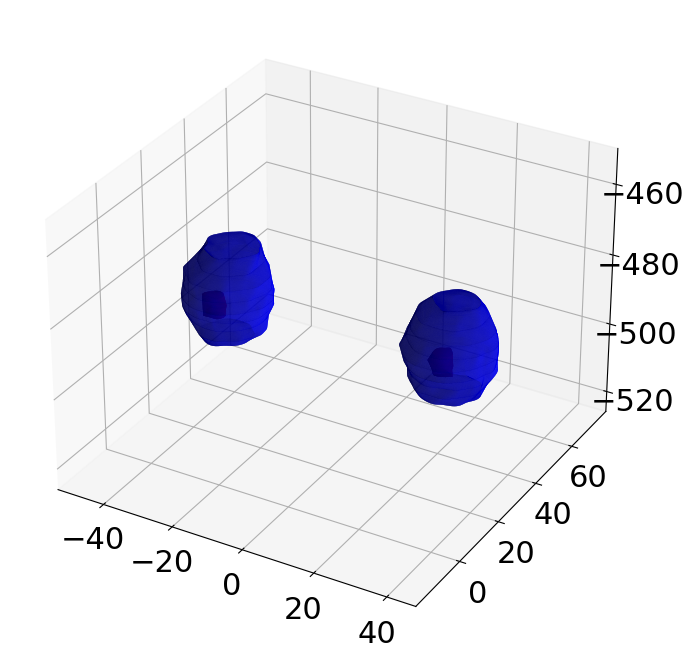

In [595]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='blue')
ax.plot_trisurf(ptsR[::3], ptsR[1::3], ptsR[2::3], triangles=trianglesR, alpha=1, shade=True,color='blue')
ax.plot_trisurf(ptsLL[::3], ptsLL[1::3], ptsLL[2::3], triangles=trianglesLL, alpha=1, shade=True,color='red')
ax.plot_trisurf(ptsLR[::3], ptsLR[1::3], ptsLR[2::3], triangles=trianglesLR, alpha=1, shade=True,color='red')
ax.set_aspect('equal', adjustable='box')
plt.show()

In [227]:
ptsLR, trianglesLR = generate_mesh_from_RS(RS,'BODY',z_cutoff=0)

-100.5
-98
-95.5
-93
-90.5
-88
-85.5
-83
-80.5
-78
-75.5
-73
-70.5
-68
-65.5
-63
-60.5
-58
-55.5
-53
-50.5
-48
-45.5
-43
-40.5
-38
-35.5
-33
-30.5
-28
-25.5
-23
-20.5
-18
-15.5
-13
-10.5
-8
-5.5
-3
-5.0e-1
2
4.5
7
9.5
12
14.5
17
19.5
22
24.5
27
29.5
32
34.5
37
39.5
42
44.5
47
49.5
52
54.5
57
59.5
62
64.5
67
69.5
72
74.5
77
79.5
82
84.5
87
89.5
92
94.5
97
99.5
102
104.5
107
109.5
112
114.5
117
119.5
122
124.5
127
129.5
132
134.5
137
139.5
142
144.5
147
149.5
152
154.5
157
159.5
162
164.5
167
169.5
172
174.5
177
179.5
182
184.5
187
189.5
192
194.5
197
199.5
202
204.5
207
209.5
212
214.5
217
219.5
222
224.5
227
229.5
232
234.5
237
dict_keys(['2.0', '4.5', '7.0', '9.5', '12.0', '14.5', '17.0', '19.5', '22.0', '24.5', '27.0', '29.5', '32.0', '34.5', '37.0', '39.5', '42.0', '44.5', '47.0', '49.5', '52.0', '54.5', '57.0', '59.5', '62.0', '64.5', '67.0', '69.5', '72.0', '74.5', '77.0', '79.5', '82.0', '84.5', '87.0', '89.5', '92.0', '94.5', '97.0', '99.5', '102.0', '104.5', '107.0', '109.5', '

NameError: name 'ptsLR' is not defined

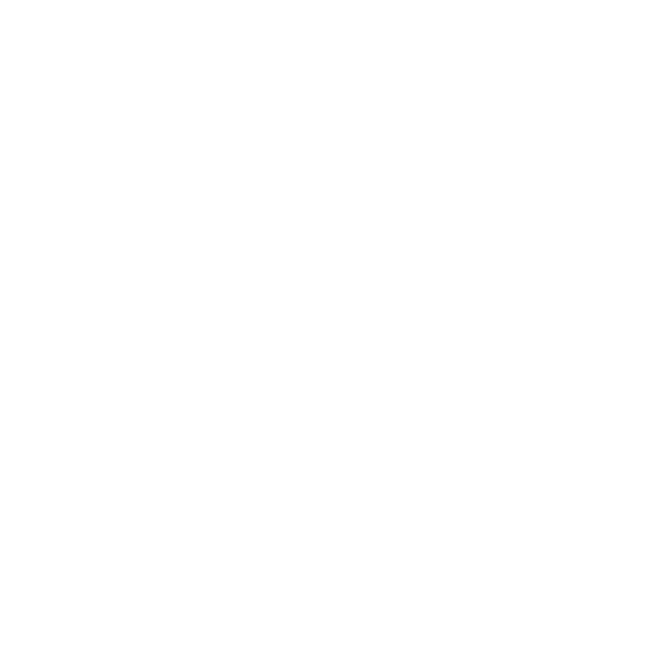

In [106]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax._axis3don = False
ax.plot_trisurf(ptsLR[::3], ptsLR[1::3], ptsLR[2::3], triangles=trianglesLR, alpha=1, shade=True,color="beige")
# ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='red')
# ax.plot_trisurf(ptsR[::3], ptsR[1::3], ptsR[2::3], triangles=trianglesR, alpha=1, shade=True,color='blue')
# ax.plot_trisurf(ptsLL[::3], ptsLL[1::3], ptsLL[2::3], triangles=trianglesLL, alpha=1, shade=True,color='green')
ax.set_aspect('equal', adjustable='box')
plt.show()

In [136]:
pts

[-13.950000000000001,
 11.500000000000004,
 -648.5,
 -13.235562199797796,
 11.164976913305845,
 -648.5,
 -12.49029661804831,
 10.89124135786969,
 -648.5,
 -11.728067455153784,
 10.658669744681887,
 -648.5,
 -10.96159729181712,
 10.448856943162037,
 -648.5,
 -10.192925910811002,
 10.259478435355168,
 -648.5,
 -9.41825927859089,
 10.096991236097523,
 -648.5,
 -8.634108079678969,
 9.96826783717259,
 -648.5,
 -7.842591181530116,
 9.885213852704078,
 -648.5,
 -7.050230284414422,
 9.86368626510528,
 -648.5,
 -6.2633973275629184,
 9.918504852085613,
 -648.5,
 -5.482790841551456,
 10.040291423140207,
 -648.5,
 -4.703696702998499,
 10.19658197879536,
 -648.5,
 -3.9214258029405626,
 10.354875549987833,
 -648.5,
 -3.1396700037288383,
 10.51341942486949,
 -648.5,
 -2.3724709247643765,
 10.708432265068383,
 -648.5,
 -1.6344330232926267,
 10.978267621465617,
 -648.5,
 -0.9313575136734411,
 11.336943824991376,
 -648.5,
 -0.25223819335547293,
 11.752017670451469,
 -648.5,
 0.41582236667579514,
 12.185

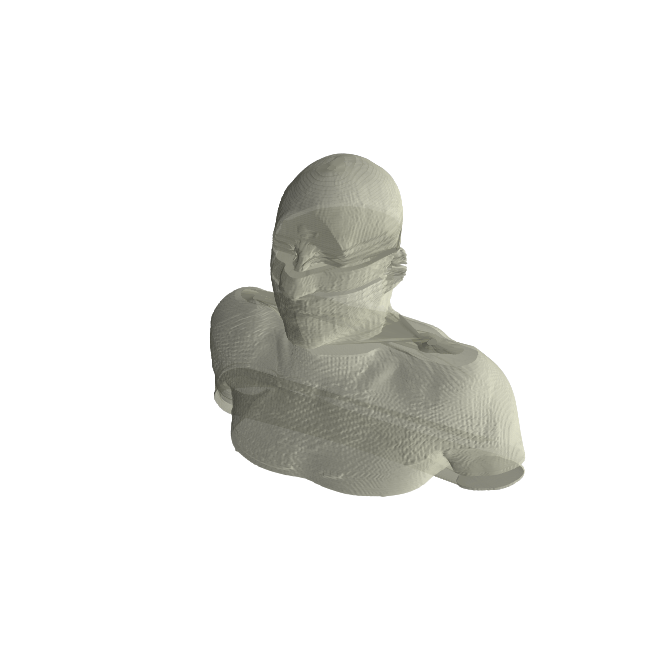

In [160]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax._axis3don = False
ax.plot_trisurf(pts[::3], pts[1::3], pts[2::3], triangles=triangles, alpha=1, shade=True,color="beige")
# ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='red')
# ax.plot_trisurf(ptsR[::3], ptsR[1::3], ptsR[2::3], triangles=trianglesR, alpha=1, shade=True,color='blue')
# ax.plot_trisurf(ptsLL[::3], ptsLL[1::3], ptsLL[2::3], triangles=trianglesLL, alpha=1, shade=True,color='green')
ax.set_aspect('equal', adjustable='box')
plt.show()

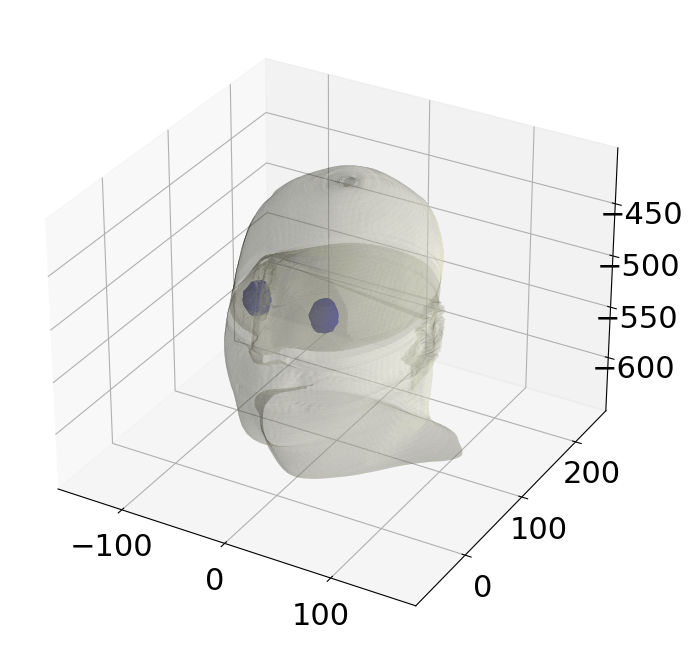

In [432]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(pts[::3], pts[1::3], pts[2::3], triangles=triangles, alpha=0.3, shade=True,color='beige')
ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='blue')
ax.plot_trisurf(ptsR[::3], ptsR[1::3], ptsR[2::3], triangles=trianglesR, alpha=1, shade=True,color='blue')
ax.set_aspect('equal', adjustable='box')
plt.show()

In [18]:
pts = ptsL
triangles=trianglesL
mesh = pv.PolyData(np.column_stack((np.array(pts[::3]).ravel(),np.array(pts[1::3]).ravel(),np.array(pts[2::3]).ravel())),triangles)

In [ ]:
plotter=pv.Plotter()
plotter.add_mesh(mesh,lighting=True,specular=0.5,smooth_shading=True)
plotter.show()

In [1]:
triangles[0:10]

NameError: name 'triangles' is not defined

In [411]:
y_eye = []
roi_eye = dict_contours[eye_ROI_names[1]][roi_slice]

for i in range(0,len(roi_eye),3):
    y_eye.append(roi_eye[i+1])
max_eye = max(y_eye)
min_eye = min(y_eye)
        

In [71]:
# contour_array = np.array(full_3)

# # Reshape the array to make it 3D (assuming you have multiple contours)
# num_contours = len(contour_array)  # Number of contours
# num_points_per_contour = len(contour_array[0])  # Number of points per contour
# contour_array_reshaped = contour_array.reshape(num_contours, num_points_per_contour, 3)

# # Set the desired isosurface value (e.g., 0)
# isosurface_value = 0

# # Generate the surface mesh using marching cubes
# verts, faces, normals, values = measure.marching_cubes(contour_array_reshaped, isosurface_value)

# # Set the desired isosurface value (e.g., 0)
# isosurface_value = 0

# # Generate the surface mesh using marching cubes
# verts, faces, normals, values = measure.marching_cubes(contour_array, isosurface_value)

# # Now you can use 'verts' and 'faces' to visualize the mesh
# # For example, using Matplotlib:
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# fig = plt.figure(figsize=(10, 10))
# ax = fig.add_subplot(111, projection='3d')
# mesh = Poly3DCollection(verts[faces])
# mesh.set_edgecolor('k')
# ax.add_collection3d(mesh)
# ax.set_xlabel("X")
# ax.set_ylabel("Y")
# ax.set_zlabel("Z")
# plt.tight_layout()
# plt.show()

In [72]:
all_z_slices

[-501.5,
 -498.5,
 -495.5,
 -492.5,
 -489.5,
 -486.5,
 -483.5,
 -480.5,
 -477.5,
 -474.5]

In [93]:
# all_z_slices = sorted(z_lists[0] + [z for z in z_lists[1] if z not in z_lists[0]])
# # print(all_z_slices)
# all_slices_p = xyz_to_image_coords_single(all_z_slices,CT_spacing[2],origin[2])
    
# max_eye_p, min_eye_p= xyz_to_image_coords_single([max_eye,min_eye],CT_spacing[1], origin[1] )

# # x_iso = X_new
# # y_iso = Y_new
# # Z_iso = Z_new

# x_iso = X_img
# y_iso = Y_img
# z_iso = Z_img

# # test = dict_contours[body_ROI_names[0]][roi_slice]
# # print(len(test))
# XN = []
# YN = []
# ZN = []
# fullN = []
# full_stack_N = []
# y_prev = 0
# x_prev = 0
# z_prev = -1000
# for c in dict_contours_body[body_ROI_names[0]]:
#     if c[2] < -650:
#         continue
        
#     xi, yi, zi = c[::3], c[1::3], c[2::3]
#     xp,yp,zp = xyz_to_image_coords(xi, yi, zi,CT_spacing,origin)
    

# #     print(c)
#     test = c
# #     full = full + list(c)
#     slice = []
    
#     for x,y,z in zip(xp,yp,zp):       
       
        
#         if z in all_slices_p or z>min(all_slices_p):
#             if y < ((max_eye_p - min_eye_p)/2 +min_eye_p):
# #                 print(y)
#                 y = (max_eye_p - min_eye_p)/2 +min_eye_p
#                 print(z,z_prev)
#                 if z != z_prev:
#                     iso_z_ind =  [ind for ind, e in enumerate(z_iso) if e == z]
# #                 print(z)
# #                 print(iso_z_ind)
#                 for index in iso_z_ind:
# #                     print(x, x_iso[index])
#                     if x_iso[index] == x and y_iso[index] < y:
#                         y = y_iso[index]
    
     
            
        
            
        
# #         if y < min_eye + 30:
# #             print(y, max_y)
#         if not (y== y_prev and x==x_prev):
#             XN.append(x)
#             YN.append(y)
#             ZN.append(z)
#             fullN.append([x,y,z])
#             slice = slice + [x,y,z]
#         y_prev = y
#         x_prev = x
        
#     full_stack_N.append(slice)


    

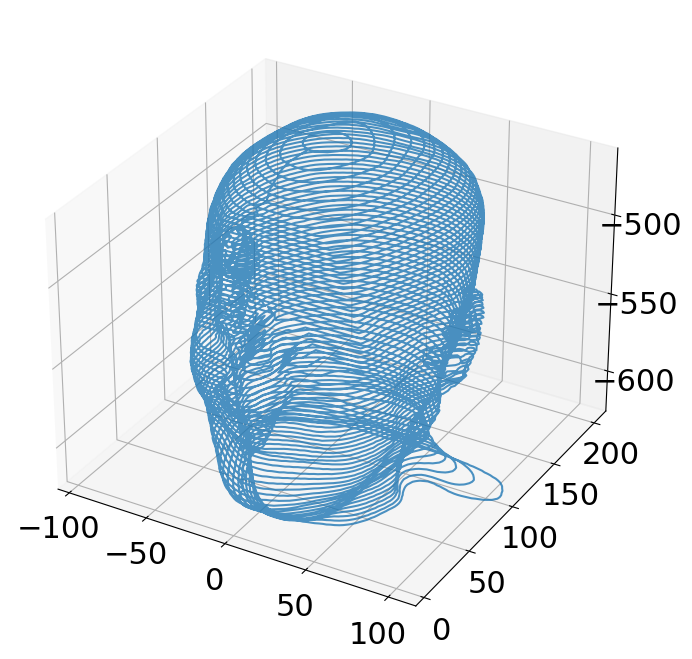

In [561]:



fig = plt.figure()
# ax = Axes3D(fig)

ax = fig.add_subplot(projection='3d')

# Xx,Yy = np.meshgrid(np.array(X),np.array(Y))
ax.plot(XN, YN, ZN,antialiased=True,alpha=0.8)
# ax.plot_trisurf(X,Y,np.array(Z))
# ax.plot_trisurf(X,Y,Z,cmap='viridis', alpha=0.8, edgecolor='none', linewidth=0, antialiased=True) 
ax.set_aspect('equal', adjustable='box')
# ls = LightSource()
# illuminated_surface = ls.shade_rgb(rgb, landscape)

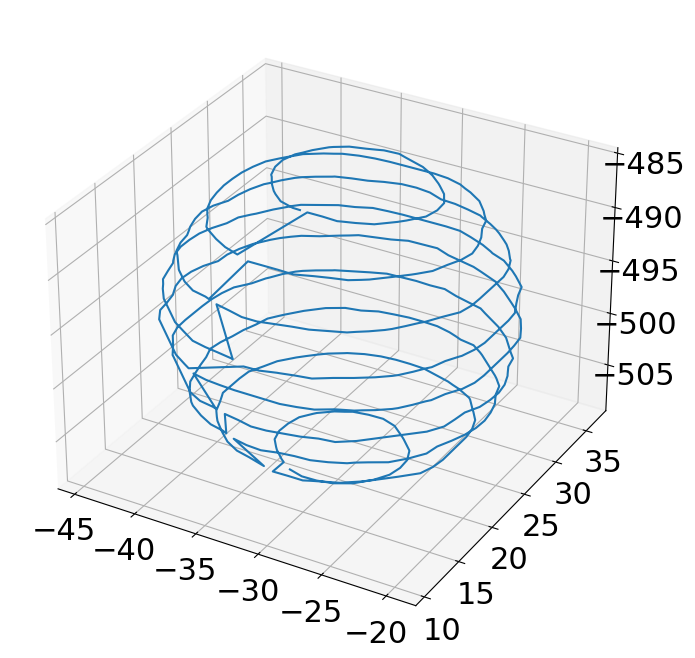

In [158]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
# X,Y = np.meshgrid(roi_x,roi_y)
ax.plot(X, Y, Z)

In [216]:

    
# # Position the scan upright, 
# # so the head of the patient would be at the top facing the camera
# # p = image.transpose(2,1,0)
# # p = p[:,:,::-1]
# full = np.array(full)
# print(len(measure.marching_cubes(full)))
# verts, faces, _, _ = measure.marching_cubes(full)

# fig = plt.figure(figsize=(10, 10))
# ax = fig.add_subplot(111, projection='3d')

# # Fancy indexing: `verts[faces]` to generate a collection of triangles
# mesh = Poly3DCollection(verts[faces], alpha=0.7)
# face_color = [0.5, 0.5, 1]
# mesh.set_facecolor(face_color)
# #     ax.add_collection3d(mesh)
# ax.plot_surface(x, y, z)

# ax.set_xlim(0, p.shape[0])
# ax.set_ylim(0, p.shape[1])
# ax.set_zlim(0, p.shape[2])

# plt.show()

In [44]:
# # full_stack = full_stack_N
# full_stack_int = {}
# keys = []



# for slice in full_stack_N:
# #     print(slice)
# #     break
#     xi, yi, zi = slice[::3], slice[1::3], slice[2::3]
# #     print(zi[0])
#     # Append starting coordinates to make it closed
# #     xi = np.r_[xi, xi]
# #     yi = np.r_[yi, yi]

#     keys.append(zi[0])
#     # Fit spline with s=0 (passing through all points)
#     tck, u = interpolate.splprep([xi, yi], s=0, per=True)

#     # Evaluate spline for 1000 evenly spaced points
#     xj, yj = interpolate.splev(np.linspace(0, 1, 1000), tck)
#     zj = [zi[0]]*1000
#     full_stack_int[zi[0]] = []
# #     print
#     for i in range(len(zj)):
#         full_stack_int[zi[0]].append(xj[i]) 
#         full_stack_int[zi[0]].append(yj[i])
        
    
# #     full_stack_int.append()

In [102]:
full_stack_int, keys = get_contour_stack('BODY', dict_contours_body,-100)

NameError: name 'get_contour_stack' is not defined

In [84]:
pts, indices = render_body(full_stack_int,keys)

In [85]:
triangles = [indices[i:i+3] for i in range(0, len(indices), 3)]


In [88]:
def plot_RS_structure(RS,structure,z_cutoff=-1000,colour='beige'):
    body_ROI_names = find_ROI_names(RS,keyword=structure)
    print("Contours containing the keyword",structure,":", body_ROI_names)
    dict_contours_body, z_lists_body = get_all_ROI_contours(body_ROI_names, RS)
    # roi_slice, z_smg_body = get_avg_ROI_z_and_slice(z_lists)
    if structure not in list(dict_contours_body.keys()):
        structure = body_ROI_names[0]
    print("Rendering",structure,"contour...")
    full_stack_int, keys = get_contour_stack(structure, dict_contours_body,z_cutoff)
    pts, indices = render_body(full_stack_int,keys)
    triangles = [indices[i:i+3] for i in range(0, len(indices), 3)]

    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.plot_trisurf(pts[::3], pts[1::3], pts[2::3], triangles=triangles, alpha=1, shade=True,color=colour)
    ax.set_aspect('equal', adjustable='box')
    plt.show()

In [176]:

c = ROI_colours['PTV_7000']
print(c)
coour=[(c[0]/255,c[1]/255,c[2]/255)]

[255, 0, 0]


In [177]:
coour

[(1.0, 0.0, 0.0)]

Contours containing the keyword BODY : ['BODY']
Rendering BODY contour...


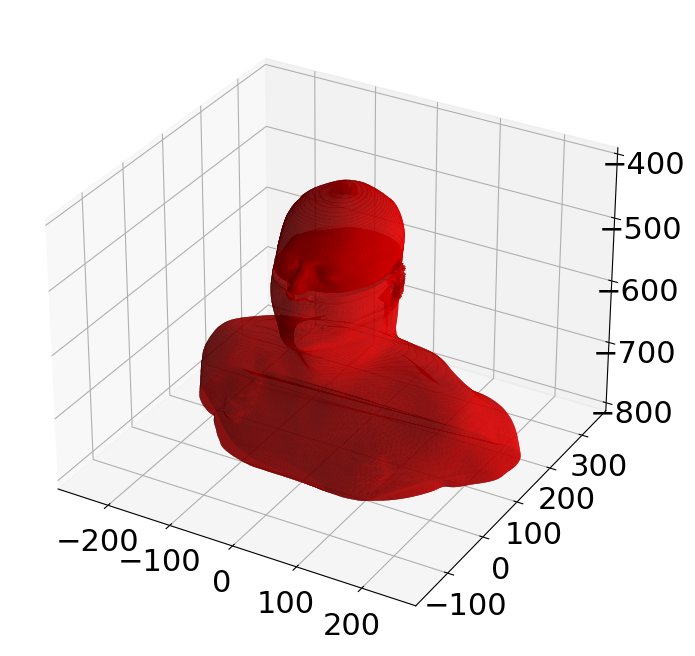

In [178]:
plot_RS_structure(RS,'BODY',colour=(c[0]/255,c[1]/255,c[2]/255))

In [322]:
pts, indices = render_body(full_stack_int,keys)

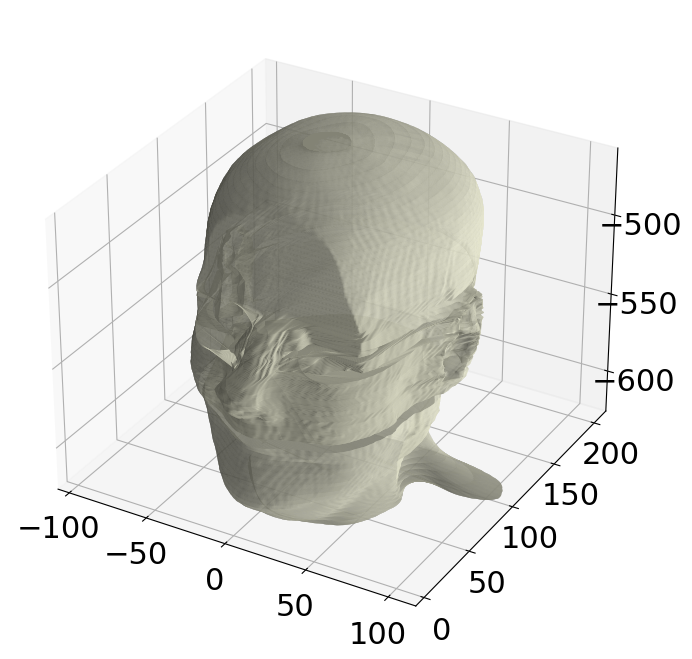

In [556]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(pts[::3], pts[1::3], pts[2::3], triangles=triangles, alpha=1, shade=True,color='beige')
ax.set_aspect('equal', adjustable='box')
plt.show()

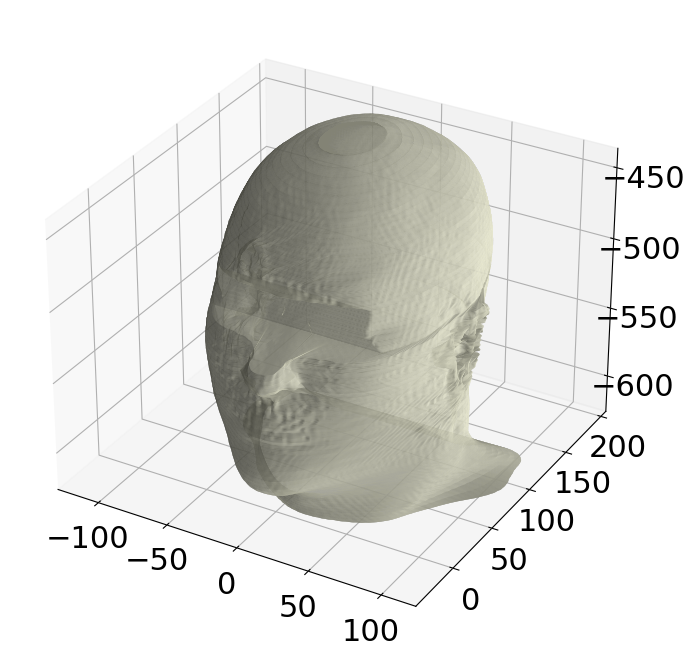

In [325]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(pts[::3], pts[1::3], pts[2::3], triangles=triangles, alpha=1, shade=True,color='beige')
ax.set_aspect('equal', adjustable='box')
plt.show()

In [79]:
RD = find_dose_file(PATH+patient+'/'+CT+'/')


In [487]:
# full_stack_N = generate_anon_body(z_lists,((max_y-min_y)/2+min_y))
pts, triangles = generate_mesh_from_array(full_stack_N)

In [123]:
pts_ptv, triangles_ptv = generate_mesh_from_RS(RS, 'PTV_Eval_6300')
pts, triangles = generate_mesh_from_RS(RS, 'BODY',z_cutoff=-650)
# pts, triangles = generate_mesh_from_array(full_stack_N)
pts_ptv70, triangles_ptv70 = generate_mesh_from_RS(RS, 'PTV_7000')
pts_ptv56, triangles_ptv56 = generate_mesh_from_RS(RS, 'PTV_Eval_5600')

dict_keys(['-654.5', '-651.5', '-648.5', '-645.5', '-642.5', '-639.5', '-636.5', '-633.5', '-630.5', '-627.5', '-624.5', '-621.5', '-618.5', '-615.5', '-612.5', '-609.5', '-606.5', '-603.5', '-600.5', '-597.5', '-594.5', '-591.5', '-588.5', '-585.5', '-582.5', '-579.5', '-576.5', '-573.5', '-570.5', '-567.5', '-564.5'])
-801.5
-798.5
-795.5
-792.5
-789.5
-786.5
-783.5
-780.5
-777.5
-774.5
-771.5
-768.5
-765.5
-762.5
-759.5
-756.5
-753.5
-750.5
-747.5
-744.5
-741.5
-738.5
-735.5
-732.5
-729.5
-726.5
-723.5
-720.5
-717.5
-714.5
-711.5
-708.5
-705.5
-702.5
-699.5
-696.5
-693.5
-690.5
-687.5
-684.5
-681.5
-678.5
-675.5
-672.5
-669.5
-666.5
-663.5
-660.5
-657.5
-654.5
-651.5
-648.5
-645.5
-642.5
-639.5
-636.5
-633.5
-630.5
-627.5
-624.5
-621.5
-618.5
-615.5
-612.5
-609.5
-606.5
-603.5
-600.5
-597.5
-594.5
-591.5
-588.5
-585.5
-582.5
-579.5
-576.5
-573.5
-570.5
-567.5
-564.5
-561.5
-558.5
-555.5
-552.5
-549.5
-546.5
-543.5
-540.5
-537.5
-534.5
-531.5
-528.5
-525.5
-522.5
-519.5
-516.5
-513.5

In [154]:
RS.StructureSetROISequence[0]

(3006, 0022) ROI Number                          IS: '68'
(3006, 0024) Referenced Frame of Reference UID   UI: 1.2.246.352.221.472824050974159010618364667790594408577
(3006, 0026) ROI Name                            LO: 'DBS_Battery D'
(3006, 0036) ROI Generation Algorithm            CS: 'MANUAL'

In [354]:
dict_contours, z_lists = get_all_ROI_contours(find_ROI_names(RS,keyword='PTV'), RS)
roi_slice, z_smg = get_avg_ROI_z_and_slice(z_lists)

In [111]:
def get_ROI_colour_dict(RS):
    index_colour_dict = {}
    for ROI_contour_seq in RS.ROIContourSequence:
        index_colour_dict[ROI_contour_seq.ReferencedROINumber] = ROI_contour_seq.ROIDisplayColor
   
    name_colour_dict = {}
    for seq in RS.StructureSetROISequence:
        name_colour_dict[seq.ROIName] = index_colour_dict[seq.ROINumber]

    return name_colour_dict
        

In [112]:
ROI_colours = get_ROI_colour_dict(RS)

In [ ]:
# def get_colour_from_ROI_name(ROI_name, RS):
#     '''
#     Gets the contour for the requested ROI_name in the RS file.
#     '''
#     for i, seq in enumerate(RS.StructureSetROISequence):
#         if seq.ROIName == ROI_name:
#             index = i
#             break

#     colour = [] 
    
#     for ROI_contour_seq in RS.ROIContourSequence[index].ContourSequence:
#         contour_coords.append(ROI_contour_seq.ContourData) 
        
#     return contour_coords


In [606]:
roi_names = find_ROI_names(RS,keyword='PTV')
print(roi_names)

['PTV!_6300', 'PTV!_5600', 'PTV_7000', 'E-PTV', 'PTV_Eval_5600', 'PTV_Eval_6300', 'Cavity_Oral-PTV', 'zPTV7000+PTV6000']


In [151]:
for seq in RS.ROIContourSequence:
    print(seq.ROIDisplayColor)

[176, 216, 255]
[0, 127, 255]
[0, 150, 0]
[128, 0, 128]
[0, 144, 144]
[69, 0, 207]
[69, 0, 207]
[192, 255, 62]
[192, 255, 62]
[255, 0, 255]
[50, 205, 50]
[197, 111, 24]
[102, 102, 0]
[140, 102, 255]
[242, 0, 255]
[255, 128, 128]
[255, 0, 0]
[0, 255, 255]
[0, 255, 224]
[0, 255, 224]
[0, 0, 255]
[255, 140, 190]
[255, 140, 190]
[0, 149, 149]
[0, 149, 149]
[255, 128, 128]
[51, 0, 102]
[51, 0, 102]
[2, 67, 18]
[0, 150, 0]
[128, 0, 128]
[128, 200, 200]
[10, 10, 250]
[10, 10, 250]
[255, 128, 0]
[128, 255, 255]
[0, 255, 255]
[0, 64, 64]
[0, 64, 64]
[60, 143, 142]
[0, 153, 153]
[102, 0, 153]
[0, 153, 153]
[255, 255, 51]
[255, 86, 120]
[255, 255, 0]
[128, 64, 64]
[128, 64, 64]
[43, 170, 254]
[255, 0, 0]
[204, 204, 255]
[204, 204, 255]
[255, 200, 150]
[255, 200, 150]
[255, 235, 205]
[198, 198, 0]
[0, 255, 0]
[128, 64, 64]
[255, 255, 185]
[255, 0, 255]
[205, 130, 255]
[255, 130, 255]
[0, 150, 0]
[0, 127, 255]
[0, 255, 255]
[187, 255, 187]
[255, 235, 205]
[255, 235, 205]
[249, 190, 254]
[249, 190, 

In [100]:
# RS

In [144]:
dict_contours, z_lists = get_all_ROI_contours(roi_names, RS)

AttributeError: 'Dataset' object has no attribute 'ContourSequence'

In [523]:
full_stack_ptv, keys_ptv = get_contour_stack('PTV_Eval_6000', dict_contours)
pts_ptv, indices_ptv = render_body(full_stack_ptv,keys_ptv)
triangles_ptv = [indices_ptv[i:i+3] for i in range(0, len(indices_ptv), 3)]

In [383]:
full_stack_ptv, keys_ptv = get_contour_stack('PTV_7000-5', dict_contours)
pts_ptv, indices_ptv = render_body(full_stack_ptv,keys_ptv)
triangles_ptv = [indices_ptv[i:i+3] for i in range(0, len(indices_ptv), 3)]

full_stack_ptv2, keys_ptv2 = get_contour_stack('PTV!_5600-5', dict_contours)
pts_ptv2, indices_ptv2 = render_body(full_stack_ptv2,keys_ptv2)
triangles_ptv2 = [indices_ptv2[i:i+3] for i in range(0, len(indices_ptv2), 3)]

full_stack_ptv3, keys_ptv3 = get_contour_stack('Cavity_Oral-PTV', dict_contours)
pts_ptv3, indices_ptv3 = render_body(full_stack_ptv3,keys_ptv3)
triangles_ptv3 = [indices_ptv3[i:i+3] for i in range(0, len(indices_ptv3), 3)]

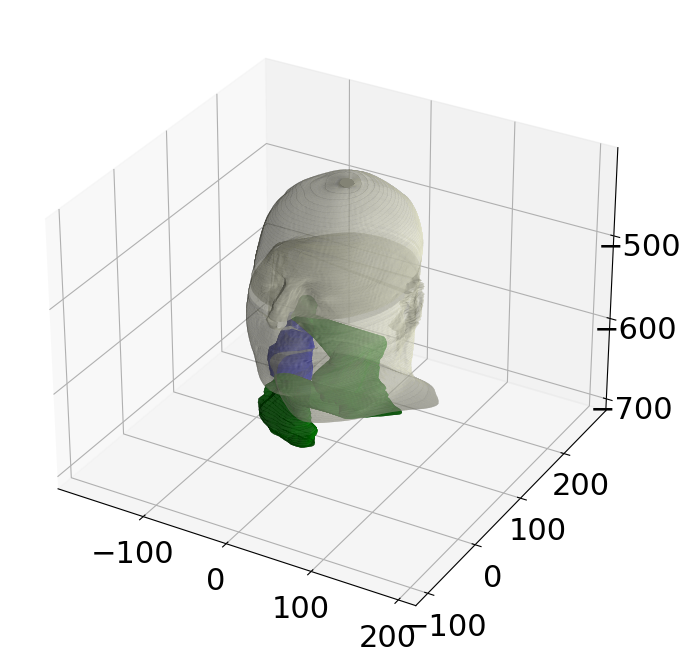

In [125]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(pts[::3], pts[1::3], pts[2::3], triangles=triangles, alpha=.5, shade=True,color='beige')

ax.plot_trisurf(pts_ptv[::3], pts_ptv[1::3], pts_ptv[2::3], triangles=triangles_ptv, alpha=1, shade=True,color='blue')
ax.plot_trisurf(pts_ptv56[::3], pts_ptv56[1::3], pts_ptv56[2::3], triangles=triangles_ptv56, alpha=1, shade=True,color='green')
ax.plot_trisurf(pts_ptv70[::3], pts_ptv70[1::3], pts_ptv70[2::3], triangles=triangles_ptv70, alpha=1, shade=True,color='red')
ax.set_aspect('equal', adjustable='box')
plt.show()

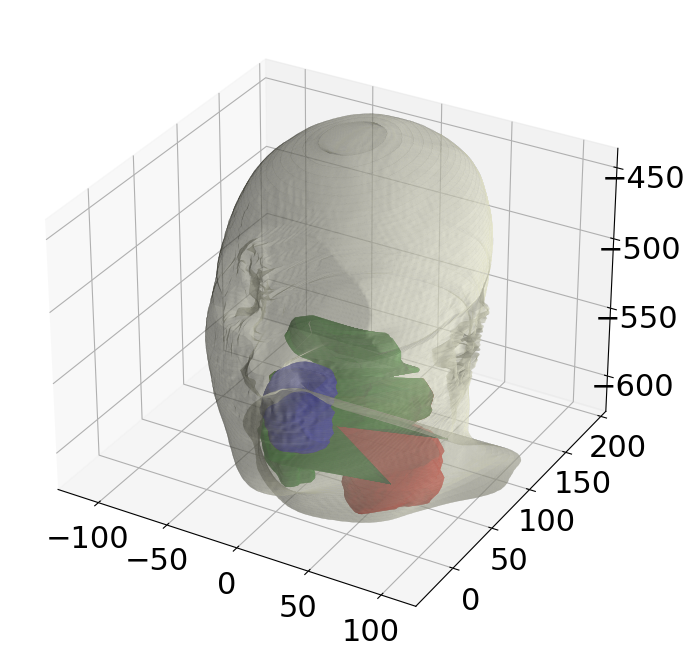

In [384]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(pts[::3], pts[1::3], pts[2::3], triangles=triangles, alpha=.5, shade=True,color='beige')

ax.plot_trisurf(pts_ptv3[::3], pts_ptv3[1::3], pts_ptv3[2::3], triangles=triangles_ptv3, alpha=1, shade=True,color='blue')
ax.plot_trisurf(pts_ptv2[::3], pts_ptv2[1::3], pts_ptv2[2::3], triangles=triangles_ptv2, alpha=1, shade=True,color='green')
ax.plot_trisurf(pts_ptv[::3], pts_ptv[1::3], pts_ptv[2::3], triangles=triangles_ptv, alpha=1, shade=True,color='red')
ax.set_aspect('equal', adjustable='box')
plt.show()

In [ ]:
# Anonymize keeping eyes

In [22]:
im,cont_xy = generate_anon_image(image,z_lists,z_spacing,((max_y-min_y)/2+min_y), cut_above = True,isodose=[], contours_to_keep = dict_contours,origin=origin)

NameError: name 'image' is not defined

[512, 512, 140]


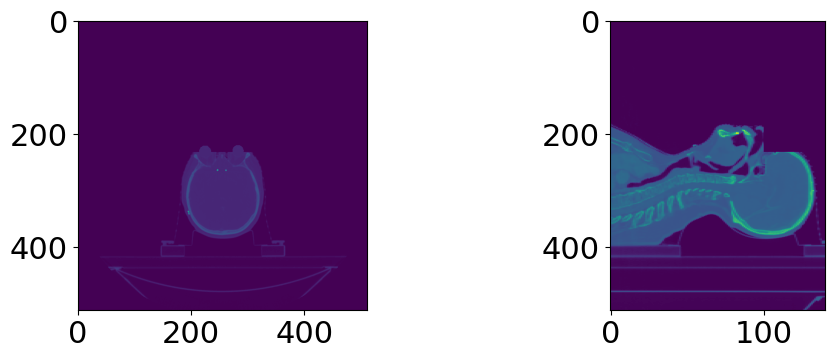

In [340]:
plot_3_views(slices, img_slice,im)

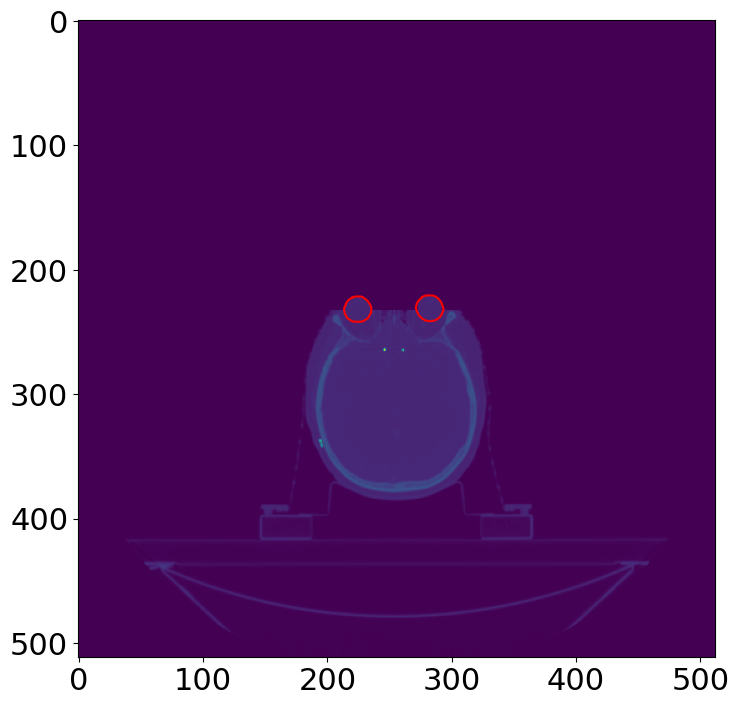

In [362]:

plt.imshow(im[img_slice])
plt.plot(roi_x, roi_y,'r-')
plt.plot(roi_x2, roi_y2,'r-')
x_cord, y_cord = zip(*cont_xy.reshape(len(cont_xy),2))
# plt.plot(x_cord, y_cord ,'m-')

In [ ]:
# DOSE

In [77]:
dose_array = RD.pixel_array
dose_scaling = RD.DoseGridScaling
dose_gy = dose_array  * dose_scaling
print(dose_array.shape)

(142, 105, 216)


In [100]:
# slice_num = 104
slice_num = img_slice

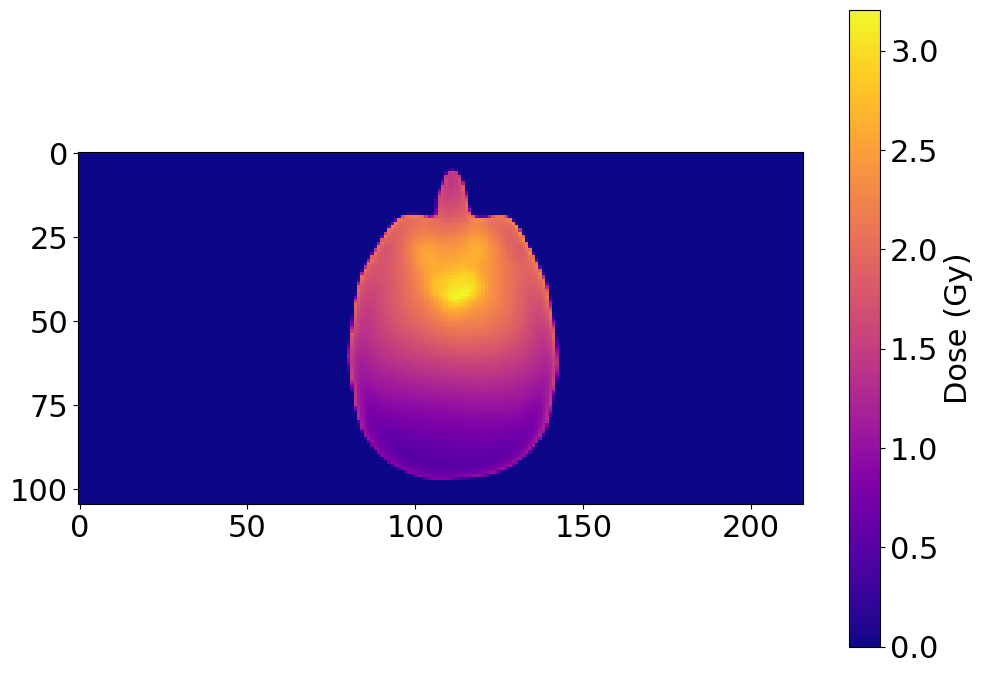

In [101]:
plt.imshow(dose_gy[img_slice],cmap=plt.cm.plasma)
plt.colorbar(label="Dose (Gy)")

In [80]:
P_dose = 70

In [81]:
isodose = get_isodose(dose_gy[slice_num],0.4286, P_dose)
isodose_3D = get_3D_isodose(dose_gy,0.4286, P_dose)
# idx = cv2.findContours(np.array(isodose,dtype=np.uint8),cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)[1][0]
# out = np.zeros_like(isodose)

In [620]:
mask = np.array(isodose_3D[slice_num],dtype=np.uint8)*255
contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = np.zeros_like(mask)
result = cv2.drawContours(contour_img,contours,-1,1)

In [621]:
xpos = np.arange(RD.Columns)*RD.PixelSpacing[0]+RD.ImagePositionPatient[0]
ypos = np.arange(RD.Rows)*RD.PixelSpacing[1]+RD.ImagePositionPatient[1]
zpos = np.asarray(RD.GridFrameOffsetVector) + RD.ImagePositionPatient[2]

In [353]:
# def get_ROI_pixel_array(roi_array,start_x,start_y,pixel_spacing):
#     '''
#     Get the pixel positions (rather than the x,y coords) of the contour array so it can be plotted.
#     '''
# #     roi_array = dict_contours[subgland_ROI_names[0]][roi_slice]
#     x = []
#     y = []

#     for i in range(0,len(roi_array),3):
#         x.append((roi_array[i] - start_x)/pixel_spacing[0])
#         y.append((roi_array[i+1] - start_y)/pixel_spacing[1]) 
        
#     return x, y

In [622]:

x_iso = []
y_iso = []
for i,row in enumerate(r_r[99]):
    for j, col in enumerate(row):
        if col == 1:
            x_iso.append(xpos[j])
            y_iso.append(ypos[i])
            

NameError: name 'r_r' is not defined

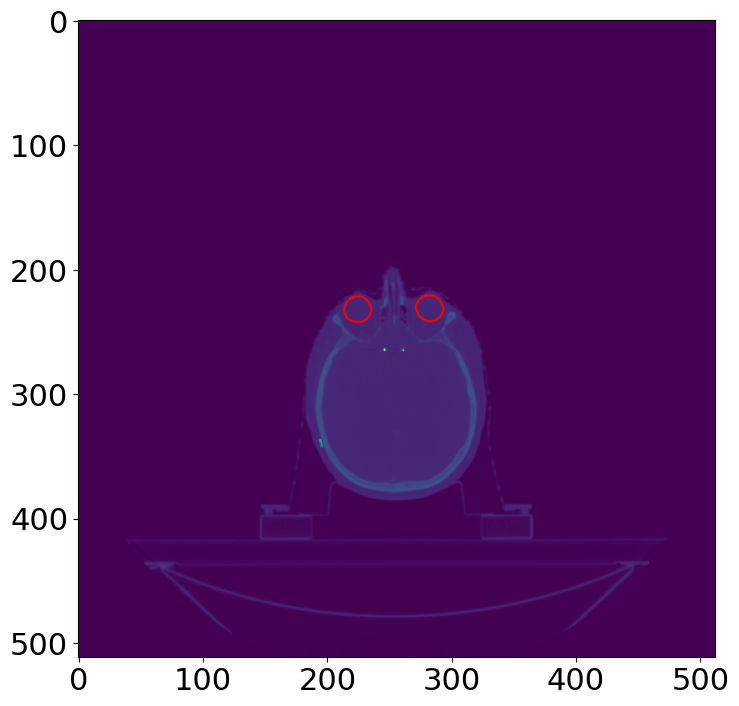

In [626]:
plt.imshow(image[img_slice])
plt.plot(roi_x, roi_y,'r-')
plt.plot(roi_x2, roi_y2,'r-')
plt.plot(x_iso_p, y_iso_p,'.',color='orange')

In [624]:
xpos = np.arange(512)*pixel_spacing[0]+start_x
ypos = np.arange(512)*pixel_spacing[1]+start_y

In [625]:
x_iso_p = []
y_iso_p = []
isodose_img = []

for x in x_iso:
    x_iso_p.append(int((x-start_x)/pixel_spacing[0]))
for y in y_iso:
    y_iso_p.append(int((y-start_y)/pixel_spacing[1]))
    

In [627]:
x_iso_p_int = x_iso_p
y_iso_p_int = y_iso_p
img_slice = 99
y_cutoff = ((max_y-min_y)/2+min_y)
print(y_cutoff)
anon_image = image[img_slice].copy()

for j,row in enumerate(image[img_slice]):
#     print(j,len(anon_img))

    new_row = [-1000]*len(row)
#     print(j)
    if j in y_iso_p_int:
        print(j)
#         print(j)
        ind_x = [ind for ind, y in enumerate(y_iso_p_int) if y == j]
#         print(ind_x)
#         ind_x = y_iso_p_int.index(j)
        for ind in ind_x:
#             print("x",x_iso_p_int[ind])
#             print(row[x_iso_p_int[ind]])
            new_row[x_iso_p_int[ind]] = row[x_iso_p_int[ind]]
    anon_image[j] = new_row
#     print("before cturr")
    if j > y_cutoff:
        print(j,y_cutoff)
#         print("Curting off")
        break

# if cut_above:
#     for slice in range(img_slice,len(image)):
#     #     print(slice)
#         for j,row in enumerate(image[slice]):
#             new_row = [-1000]*len(row)
#             anon_image[slice][j] = new_row
#             #         print(len(row))
#             #         print(new_row)
#             if j > ((max_y-min_y)/2+min_y):
#                 break


231.12367491166077
232 231.12367491166077


In [628]:
y_iso_p_int = [int(x) for x in y_iso_p]
x_iso_p_int = [int(x) for x in x_iso_p]

In [629]:
x_iso_p

[]

In [90]:
mask = np.array(isodose,dtype=np.uint8)*255
contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = np.zeros_like(mask)
result_img_space = cv2.drawContours(contour_img,contours,-1,1)

In [102]:
res = resample_dose_map_2D(dose_gy[slice_num],pixel_spacing,RD.PixelSpacing)

In [103]:
res_res = resize_dose_map(res,[512,512],pixel_spacing, RD.ImagePositionPatient,[start_x,start_y])

24 160
24.177132724466098 160.52173878630538
X 24 445
Y 160 216
469
xy ends 469 376


In [104]:
isodose = get_isodose(res_res,0.4286, P_dose)

In [105]:
mask = np.array(isodose,dtype=np.uint8)*255
contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = np.zeros_like(mask)
result_img_space = cv2.drawContours(contour_img,contours,-1,1)

In [376]:
def plot_dose(dose_map, slice):
    

SyntaxError: unexpected EOF while parsing (84383006.py, line 2)

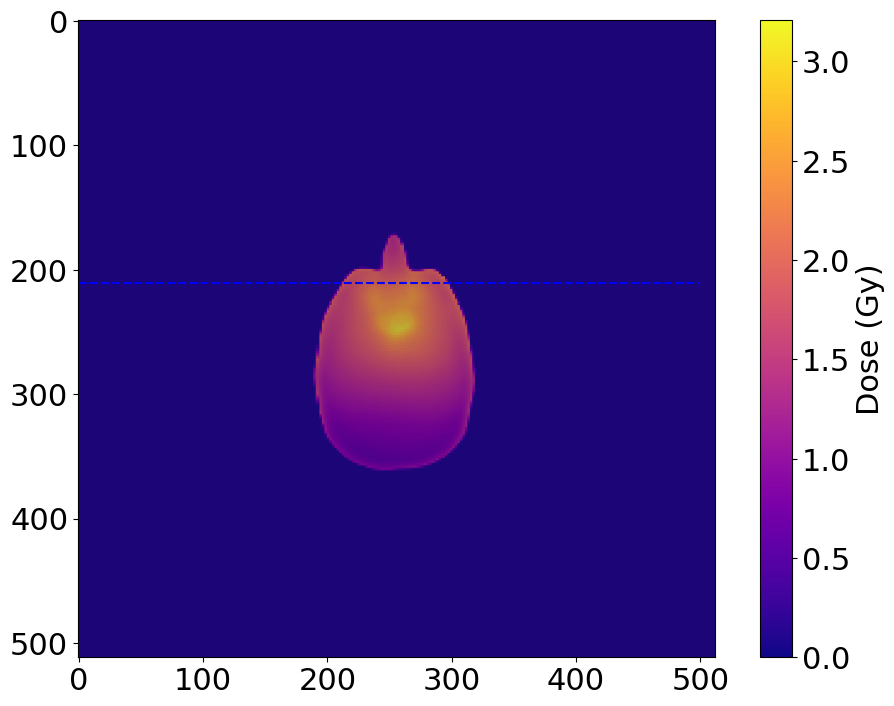

In [109]:
plt.imshow(res_res,cmap=plt.cm.plasma)
plt.colorbar(label="Dose (Gy)")
# plt.imshow(isodose,alpha=0.5)
plt.imshow(result_img_space,alpha=0.3)
# plt.imshow(idx)
plt.plot([0,500],[(max_y-min_y)/2+min_y,(max_y-min_y)/2+min_y],'b--')

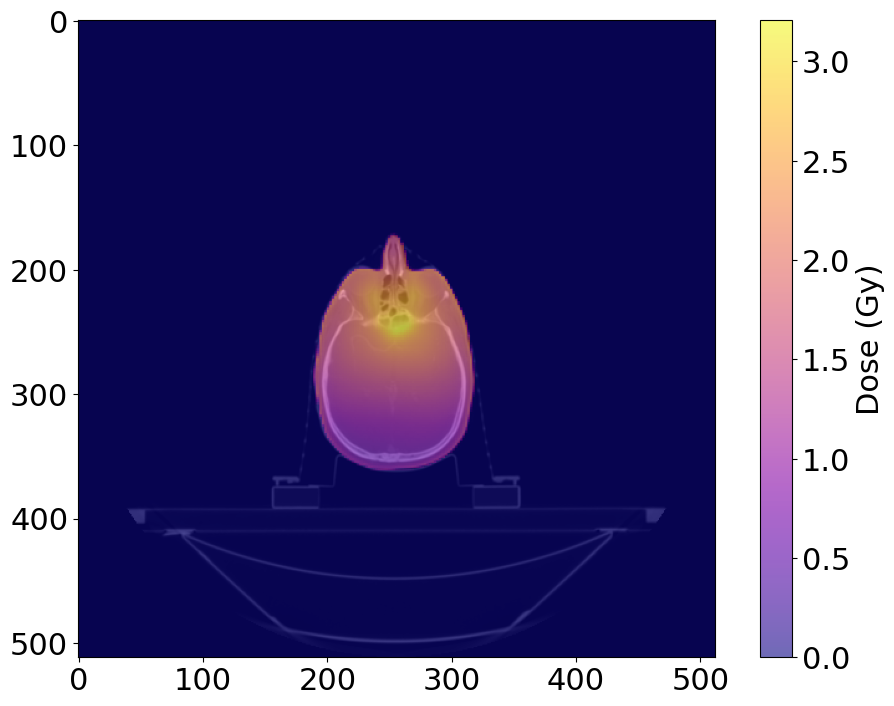

In [107]:
plt.imshow(image[img_slice],cmap='gray')
plt.imshow(res_res,cmap=plt.cm.plasma,alpha=.6)
plt.colorbar(label="Dose (Gy)")

# plt.imshow(isodose,alpha=0.5)
# plt.imshow(result,alpha=0.3)
# plt.imshow(idx)

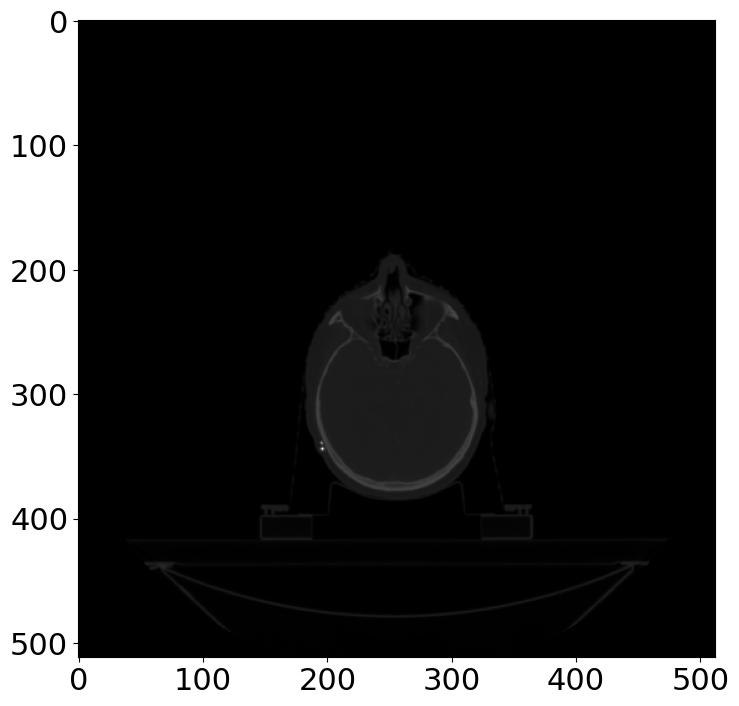

In [636]:
plt.imshow(image[99],cmap='gray')
plt.plot(x_iso_p_int,y_iso_p_int)
# plt.colorbar(label="Dose (Gy)")


In [637]:
dose_spacing = [RD.GridFrameOffsetVector[1]-RD.GridFrameOffsetVector[0],RD.PixelSpacing[0],RD.PixelSpacing[1]]
CT_spacing = [CT_dcm.SliceThickness,pixel_spacing[0],pixel_spacing[1]]

In [640]:
dose_spacing = [RD.PixelSpacing[0],RD.PixelSpacing[1],RD.GridFrameOffsetVector[1]-RD.GridFrameOffsetVector[0]]
CT_spacing = [pixel_spacing[0],pixel_spacing[1],CT_dcm.SliceThickness]

In [225]:
CT_spacing

['1.10546875', '1.10546875', '3.0']

In [231]:
dose_gy.shape

(135, 97, 198)

In [232]:
r.shape

(135, 219, 447)

In [641]:
r = resample_dose_map_3D(dose_gy,CT_spacing, dose_spacing)

[ 97 198 135]
[135, 219, 447]
[219.3639576  447.77385159 135.        ]
(135, 219, 447)


In [659]:
r_r = resize_dose_map_3D(r,[512,512,len(image)],[pixel_spacing[0],pixel_spacing[1],CT_dcm.SliceThickness], RD.ImagePositionPatient,[start_x,start_y,start_z])

(140, 512, 512)
z_img -1 -1.0
0 0
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
1 1
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
2 2
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
3 3
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
4 4
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
5 5
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
6 6
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
7 7
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
8 8
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
9 9
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.10546875', '3.0']
10 10
new or (DOSE) -804.5
old or (IMG) -801.5
spacing ['1.10546875', '1.1054687

In [ ]:
163+193

In [ ]:
plt.imshow(r[120],cmap=plt.cm.plasma)
plt.colorbar(label="Dose (Gy)")

In [670]:
img_slice = 90

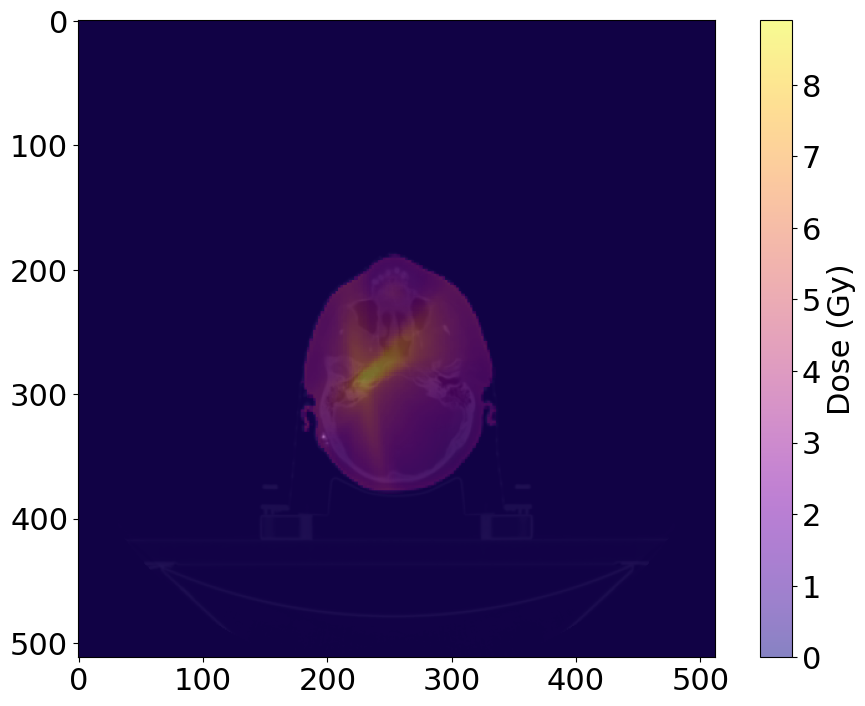

In [671]:
plt.imshow(image[img_slice],cmap='gray')
plt.imshow(r_r[img_slice],cmap=plt.cm.plasma,alpha=0.5)
plt.colorbar(label="Dose (Gy)")
plt.imshow(isodose_3D_20Gy[img_slice],alpha=0.2)
# plt.imshow(result_img_space,alpha=0.3)
# plt.imshow(idx)


In [432]:
isodose_3D = get_3D_isodose(r_r,0.4286, P_dose)

In [661]:
isodose_3D_20Gy = get_3D_isodose(r_r,0.2857, P_dose)

In [662]:
len(isodose_3D[0][0])

198

In [438]:
img_slice

99

In [436]:
new_img = generate_anon_image(image,z_lists,((max_y-min_y)/2+min_y),True,isodose_3D_20Gy)

0
1
2
3
4
5
6
7
8


[512, 512, 136]


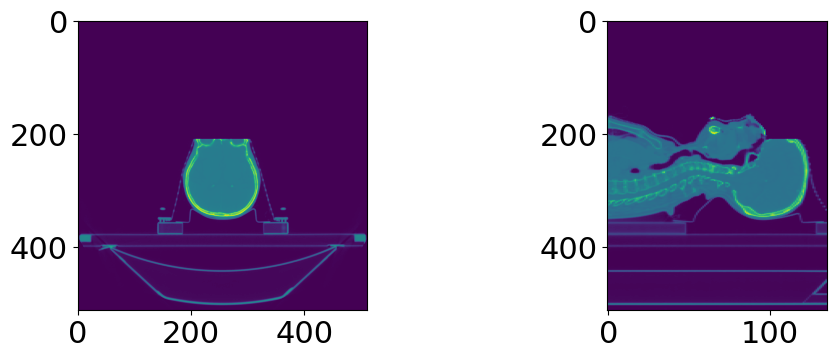

In [479]:
plot_3_views(slices, 100,new_img)

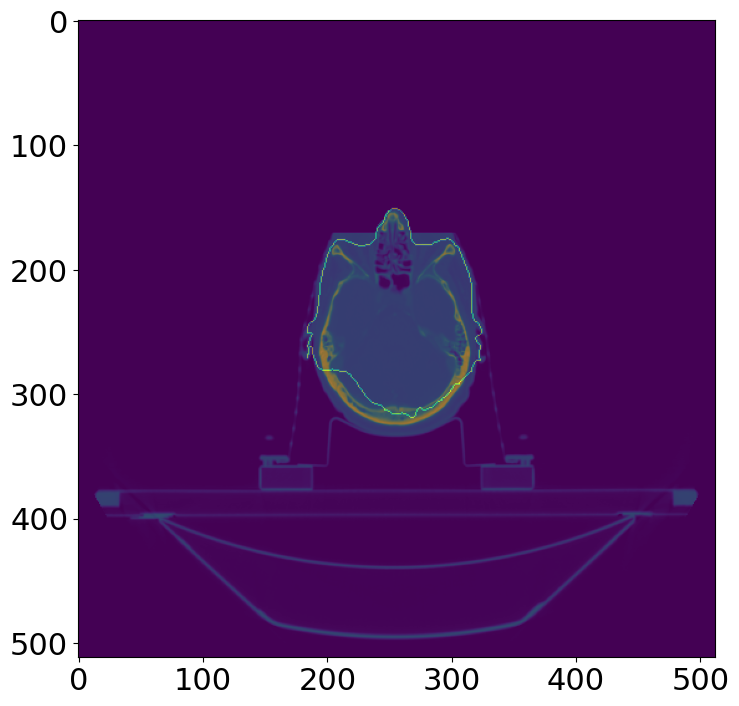

In [232]:
plt.imshow(new_img[100])
plt.imshow(result_img_space,alpha=0.5)

In [230]:
mask = np.array(isodose_3D_20Gy[99],dtype=np.uint8)*255
contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = np.zeros_like(mask)
result_img_space = cv2.drawContours(contour_img,contours,-1,1)

In [261]:
origin

[-281, -185, -278]

In [529]:
contour, X_img, Y_img, Z_img = mask_to_contour_image_space(isodose_3D_20Gy)

In [530]:
X_new, Y_new, Z_new = image_to_xyz_coords(X_img, Y_img, Z_img, [pixel_spacing[0],pixel_spacing[1],spacing], origin)

In [267]:
[pixel_spacing[0],pixel_spacing[1],spacing]

['1.09765625', '1.09765625', '3.0']

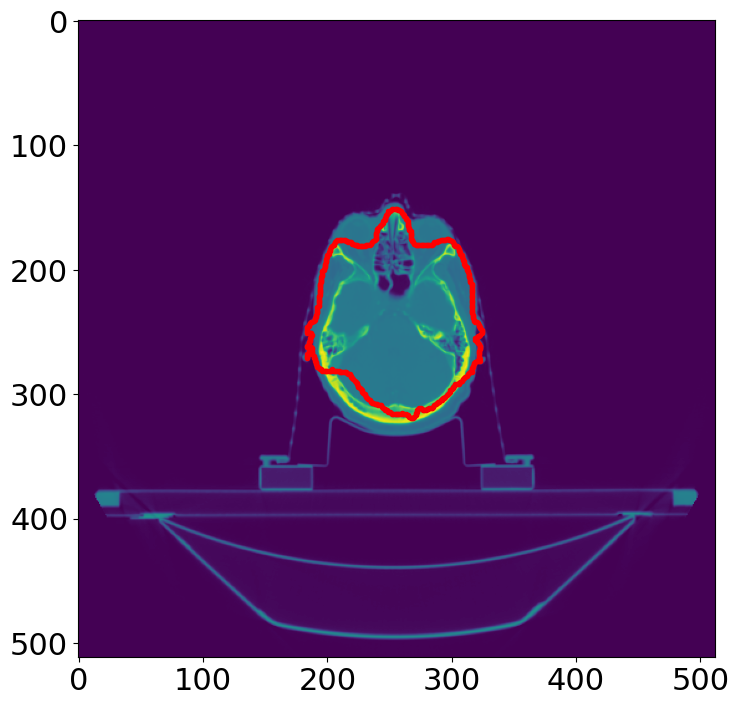

In [342]:
plt.imshow(image[99])
plt.plot([x for i,x in enumerate(X_img) if Z_img[i]==99], [y for i,y in enumerate(Y_img) if Z_img[i]==99],'.r')

In [ ]:
# Check PTV slices wrt CUT

In [740]:
PTV_names = [p for p in find_ROI_names(RS,"PTV") if '!' not in p and 'z' not in p]
print(PTV_names)

['PTV_ALL', 'PTV70+PTV60', 'PTV70', 'PTV60', 'PTV56', 'MOD1_PTV70', 'MOD1_PTV60', 'MOD1_PTV56', 'MOD1PTV70overSup', 'MOD1PTV60overInf', 'MOD1_PTV70+60', 'MOD1_PTV ALL']


In [741]:
PTV_dict_contours, z_lists = get_all_ROI_contours(PTV_names, RS)

In [755]:
# all_z_slices_PTV = sorted(z_lists[0] + [z for z in z_lists[1] if z not in z_lists[0]])

all_z_slices_PTV = []
for z_list in z_lists:
#     print([z for z in z_list if z not in all_z_slices_PTV])
    all_z_slices_PTV = sorted(all_z_slices_PTV + [z for z in z_list if z not in all_z_slices_PTV])
all_z_slices_PTV = list(dict.fromkeys(all_z_slices_PTV))

In [756]:
len(all_z_slices_PTV)

61

In [766]:
PTV_slices_cut = 0
for z in all_z_slices_PTV:
    if z in all_z_slices or z>min(all_z_slices):
        print(z)
        PTV_slices_cut += 1
    
print("Total PTV slices cut:", PTV_slices_cut,"/",len(all_z_slices_PTV),"=",PTV_slices_cut/len(all_z_slices_PTV) *100,"%")


Total PTV slices cut: 0 / 61 = 0.0 %


In [ ]:
(3006, 0084) Referenced ROI Number               IS: '5'
   ---------
   (3006, 002a) ROI Display Color                   IS: [128, 0, 128]
   (3006, 0040)  Contour Sequence  3 item(s) ---- 
      (3006, 0016)  Contour Image Sequence  1 item(s) ---- 
         (0008, 1150) Referenced SOP Class UID            UI: CT Image Storage
         (0008, 1155) Referenced SOP Instance UID         UI: 1.2.246.352.221.5743398713755600108864592695342003132
         ---------
      (3006, 0042) Contour Geometric Type              CS: 'CLOSED_PLANAR'
      (3006, 0046) Number of Contour Points            IS: '4'
      (3006, 0050) Contour Data                        DS: [18.11, 78.92, -47, 18.18, 78.99, -47, 18.11, 79.05, -47, 18.04, 78.99, -47]
      ---------
      (3006, 0016)  Contour Image Sequence  1 item(s) ---- 
         (0008, 1150) Referenced SOP Class UID            UI: CT Image Storage
         (0008, 1155) Referenced SOP Instance UID         UI: 1.2.246.352.221.47800459756798446143279743412218834832
         ---------
      (3006, 0042) Contour Geometric Type              CS: 'CLOSED_PLANAR'
      (3006, 0046) Number of Contour Points            IS: '22'
      (3006, 0050) Contour Data                        DS: Array of 66 elements
      ---------
      (3006, 0016)  Contour Image Sequence  1 item(s) ---- 
         (0008, 1150) Referenced SOP Class UID            UI: CT Image Storage
         (0008, 1155) Referenced SOP Instance UID         UI: 1.2.246.352.221.555056670848694991613916372253723897247
         ---------
      (3006, 0042) Contour Geometric Type              CS: 'CLOSED_PLANAR'
      (3006, 0046) Number of Contour Points            IS: '18'
      (3006, 0050) Contour Data                        DS: Array of 54 elements
      ---------

In [1054]:
def get_contour_from_ROI_name(ROI_name, RS):
    '''
    Gets the contour for the requested ROI_name in the RS file.
    '''
    for i, seq in enumerate(RS.StructureSetROISequence):
        if seq.ROIName == ROI_name:
            index = i
            break

    contour_coords = [] 
    
    if 'ContourSequence' in RS.ROIContourSequence[index]:
        i=0
        for ROI_contour_seq in RS.ROIContourSequence[index].ContourSequence:
            i+=1
#             print(i)
            contour_coords.append(ROI_contour_seq.ContourData) 
    else:
        print("Warning:",ROI_name,"has no contour sequence.")
            
    return contour_coords
def get_all_ROI_contours(list_ROIs,RS):
    '''
    Get dictionary of contours for each of the ROIs in list_ROIs.
    '''
    dict_contours = {}
    z_lists = []
#     print(list_ROIs)

    for roi_name in list_ROIs:

        all_contours_ROI = get_contour_from_ROI_name(roi_name, RS)
        all_contours_ROI = sorted(all_contours_ROI, key=lambda x: x[2])
        dict_contours[roi_name] = all_contours_ROI
        z_lists.append(sorted([float(roi[2]) for roi in all_contours_ROI]))
    return dict_contours, z_lists

In [1050]:
get_contour_from_ROI_name('Brain',RS)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57


[[-6.04, 94.87, -14, -3.84, 94.57, -14, -1.65, 94.42, -14, 0.55, 94.42, -14, 2.74, 94.7, -14, 4.94, 95.25, -14, 7.13, 95.16, -14, 8.18, 96.55, -14, 9.33, 98.64, -14, 9.4, 98.74, -14, 11.53, 100.62, -14, 11.87, 100.94, -14, 12.97, 103.13, -14, 13.72, 104.72, -14, 14.04, 105.33, -14, 13.93, 107.53, -14, 13.93, 109.72, -14, 13.79, 111.92, -14, 13.72, 112.01, -14, 12.32, 114.11, -14, 11.87, 116.31, -14, 11.53, 116.7, -14, 10.12, 118.5, -14, 9.33, 119.45, -14, 8.23, 120.7, -14, 7.13, 121.73, -14, 5.65, 122.89, -14, 4.94, 123.47, -14, 2.74, 124.06, -14, 0.55, 124.64, -14, -1.65, 124.33, -14, -3.84, 123.6, -14, -5.05, 122.89, -14, -6.04, 122.31, -14, -8.23, 120.77, -14, -8.31, 120.7, -14, -10.43, 118.82, -14, -10.75, 118.5, -14, -12.62, 116.51, -14, -12.83, 116.31, -14, -13.38, 114.11, -14, -14.82, 112.02, -14, -14.89, 111.92, -14, -15.25, 109.72, -14, -15.16, 107.53, -14, -15.14, 105.33, -14, -14.82, 103.96, -14, -14.62, 103.13, -14, -12.97, 100.94, -14, -12.62, 100.57, -14, -10.43, 99.45, -

In [695]:
for ROI_name in PTV_names:
    for i, seq in enumerate(RS.StructureSetROISequence):
        if seq.ROIName == ROI_name:
            
            index = i
            print(i, seq.ROINumber, seq.ROIName)
            break

    contour_coords = [] 
    if 'ContourSequence' in RS.ROIContourSequence[index]:

        for ROI_contour_seq in RS.ROIContourSequence[index].ContourSequence:
            contour_coords.append(ROI_contour_seq.ContourData) 
    else:
        print("skipping")



16 46 PTV_7000
58 99 E-PTV
skipping
62 109 PTV_Eval_5600
63 110 PTV_Eval_6300
78 73 Cavity_Oral-PTV


In [894]:
list_all_patients = sorted([p for p in os.listdir(PATH) if 'b' not in p and 'old' not in p], key=int,reverse=True)

In [77]:
# list_all_patients

In [78]:
PTV_cutoffs = {}

for p in list_all_patients:
    patient_path = PATH+p+'/'
    CT_list = [d for d in os.listdir(patient_path) if d[9:11] == 'CT' and len(d) == 23]
    if len(CT_list) > 2:
        print(p,"has",len(CT_list),"CTs.")
    PTV_cutoffs[p] = {}    
    for CT in CT_list:
        CT_path = patient_path+CT+'/'
        RS_file = [rs for rs in os.listdir(CT_path) if 'RS' in rs][0]
        RS = dcm.read_file(CT_path+RS_file)
        
#         print(p, CT, RS_file)
        
        
        eye_ROI_names = find_ROI_names(RS,keyword='eye')
        
        if len(eye_ROI_names) != 2:
            print(p, eye_ROI_names)
        if len(eye_ROI_names) == 0:
            print("***Patient", p, "CT",CT, "has no eye contours... ***")
            continue
   
            
        dict_contours, z_lists = get_all_ROI_contours(eye_ROI_names, RS)
#         all_z_slices = sorted(z_lists[0] + [z for z in z_lists[1] if z not in z_lists[0]])
        all_z_slices = []
        for z_list in z_lists:
            all_z_slices = sorted(all_z_slices + [z for z in z_list if z not in all_z_slices])
        
        PTV_names = [p for p in find_ROI_names(RS,"PTV") if '!' not in p and 'z' not in p and 'E-PTV' not in p and 'NON' not in []]
#         print(PTV_names)
        PTV_dict_contours, z_lists = get_all_ROI_contours(PTV_names, RS)
        
        all_z_slices_PTV = []
        for z_list in z_lists:
            all_z_slices_PTV = sorted(all_z_slices_PTV + [z for z in z_list if z not in all_z_slices_PTV])
        
        PTV_slices_cut = 0
        len_PTV_slices = len(all_z_slices_PTV)
        
        for z in all_z_slices_PTV:
            if z in all_z_slices or z>min(all_z_slices):
                PTV_slices_cut += 1
        
        
        PTV_cutoffs[p][CT] = {}
        PTV_cutoffs[p][CT]['total'] = len_PTV_slices
        PTV_cutoffs[p][CT]['cut'] = PTV_slices_cut
        
        

        

458 ['Eye_R']
666 has 3 CTs.
743 []
***Patient 743 CT 20200709_CT_30_JUN_2020 has no eye contours... ***
836 has 3 CTs.
853 []
***Patient 853 CT 20200304_CT_26_FEB_2020 has no eye contours... ***
868 ['Eye~_R^Ant', 'Eye~_L^Ant', 'Eye_R', 'Eye_L']
980 ['Eye_L', 'Eye_R', 'EYE_L_PRV']
1130 ['Eye_1_R', 'Eye_1_L', 'PRV_Eye R']
1130 ['Eye_L']
1314 has 3 CTs.
1467 []
***Patient 1467 CT 20230920_CT_20_SEP_2023 has no eye contours... ***
1502 has 3 CTs.
1520 has 3 CTs.


In [511]:
total_ps = 0
for p in PTV_cutoffs:
    if bool(PTV_cutoffs[p]) and p!='1514':
        total_ps+=1

In [512]:
total_ps

500

In [502]:
total_CTs = 0
for p in PTV_cutoffs:
    if p=='1514':
        continue
    for CT in PTV_cutoffs[p]:
        total_CTs+=1

In [85]:
total_CTs

674

In [232]:
PTV_cutoffs

{'19': {'20180411_CT_09_APR_2018': {'total': 92, 'cut': 0},
  '20180515_CT_10_MAY_2018': {'total': 92, 'cut': 0}},
 '22': {'20180921_CT_13_SEP_2018': {'total': 67, 'cut': 0}},
 '23': {'20180831_CT_22_AUG_2018': {'total': 96, 'cut': 0}},
 '35': {'20180209_CT_06_FEB_2018': {'total': 94, 'cut': 0},
  '20171220_CT_14_DEC_2017': {'total': 93, 'cut': 0}},
 '43': {'20190131_CT_24_JAN_2019': {'total': 71, 'cut': 0}},
 '51': {'20190430_CT_24_APR_2019': {'total': 77, 'cut': 0}},
 '54': {'20190122_CT_14_JAN_2019': {'total': 49, 'cut': 11},
  '20190225_CT_19_FEB_2019': {'total': 40, 'cut': 13}},
 '59': {'20180807_CT_31_JUL_2018': {'total': 100, 'cut': 4},
  '20180705_CT_27_JUN_2018': {'total': 140, 'cut': 5}},
 '60': {'20181004_CT_26_SEP_2018': {'total': 84, 'cut': 0}},
 '70': {'20180221_CT_14_FEB_2018': {'total': 88, 'cut': 0},
  '20180403_CT_28_MAR_2018': {'total': 120, 'cut': 0}},
 '77': {'20190320_CT_13_MAR_2019': {'total': 29, 'cut': 0}},
 '81': {'20190125_CT_16_JAN_2019': {'total': 97, 'cut'

In [775]:
# plot_RS_structure(RS,'PTV_ALL',colour='red')

In [ ]:
print("done")

In [844]:
CT_percentages = []

num_CTs = 0
for patient in PTV_cutoffs:
    for CT in PTV_cutoffs[patient]:
        if PTV_cutoffs[patient][CT]['total'] == 0:
            print("***",patient,PTV_cutoffs[patient],"***")
        else:
            num_CTs += 1
            percentage = PTV_cutoffs[patient][CT]['cut']/PTV_cutoffs[patient][CT]['total']*100
            CT_percentages.append(percentage)
            if percentage > 25:
                print(patient,":", percentage,"% -->",PTV_cutoffs[patient][CT]['cut'],"/",PTV_cutoffs[patient][CT]['total'])
    

54 : 32.5 % --> 13 / 40
108 : 54.54545454545454 % --> 18 / 33
248 : 44.61538461538462 % --> 29 / 65
466 : 38.46153846153847 % --> 10 / 26
638 : 32.432432432432435 % --> 12 / 37
638 : 42.857142857142854 % --> 9 / 21
*** 641 {'20191022_CT_15_OCT_2019': {'total': 0, 'cut': 0}} ***
690 : 37.719298245614034 % --> 43 / 114
868 : 40.42553191489361 % --> 19 / 47
936 : 51.724137931034484 % --> 15 / 29
980 : 50.0 % --> 10 / 20
1071 : 42.857142857142854 % --> 24 / 56
1130 : 38.333333333333336 % --> 23 / 60
1143 : 61.42857142857143 % --> 43 / 70
1183 : 27.941176470588236 % --> 38 / 136
1306 : 26.5625 % --> 34 / 128
1306 : 29.496402877697843 % --> 82 / 278
1467 : 45.45454545454545 % --> 15 / 33
1489 : 45.83333333333333 % --> 11 / 24
1514 : 44.44444444444444 % --> 8 / 18
1521 : 58.82352941176471 % --> 10 / 17


Text(0, 0.5, 'Number of CTs')

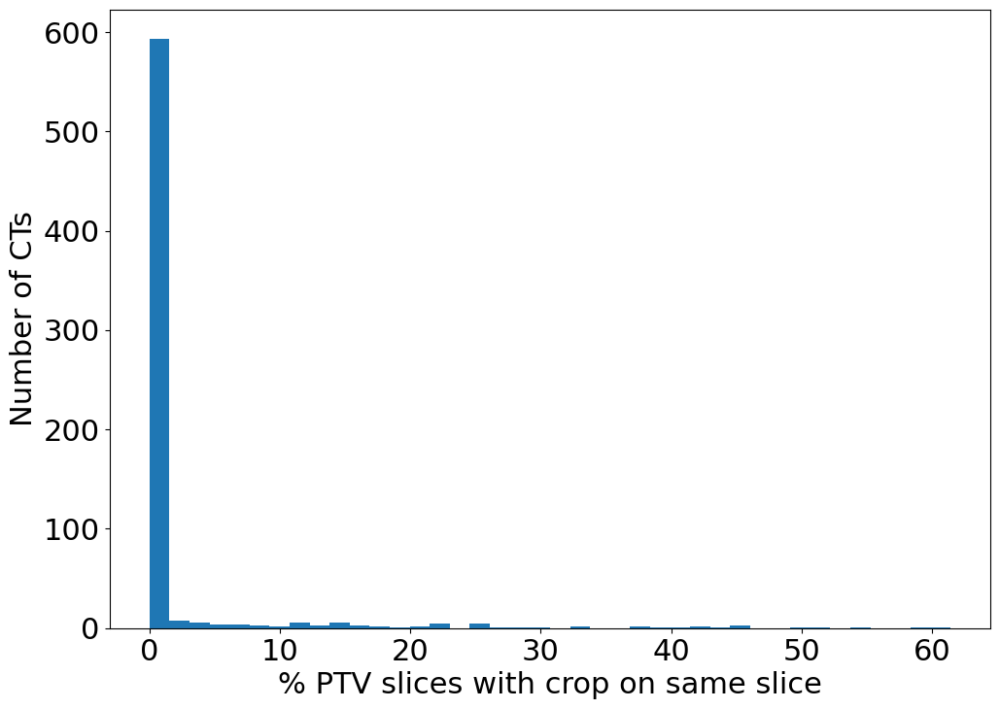

In [846]:
plt.hist(CT_percentages,bins=40)
plt.xlabel("% PTV slices with crop on same slice")
plt.ylabel("Number of CTs")

In [498]:
CT_slices = []
PTVs_below_cut = 0
for patient in PTV_cutoffs:
    if patient=='1514':
        continue
    for CT in PTV_cutoffs[patient]:
        CT_slices.append(PTV_cutoffs[patient][CT]['cut'])
        if PTV_cutoffs[patient][CT]['cut'] == 0:
            PTVs_below_cut+=1
    

(array([597.,   8.,   5.,   5.,   6.,   8.,   2.,   5.,   3.,   5.,   5.,
          3.,   1.,   1.,   3.,   0.,   0.,   2.,   1.,   0.,   0.,   0.,
          3.,   1.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   1.,   1.,
          1.,   0.,   0.,   1.,   1.,   0.,   0.,   0.,   2.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   1.]),
 array([ 0.   ,  1.025,  2.05 ,  3.075,  4.1  ,  5.125,  6.15 ,  7.175,
         8.2  ,  9.225, 10.25 , 11.275, 12.3  , 13.325, 14.35 , 15.375,
        16.4  , 17.425, 18.45 , 19.475, 20.5  , 21.525, 22.55 , 23.575,
        24.6  , 25.625, 26.65 , 27.675, 28.7  , 29.725, 30.75 , 31.775,
        32.8  , 33.825, 34.85 , 35.875, 36.9  , 37.925, 38.95 , 39.975,
        41.   , 42.025, 43.05 , 44.075, 45.1  , 46.125, 47.15 , 48.175,
        49.2  , 50.225

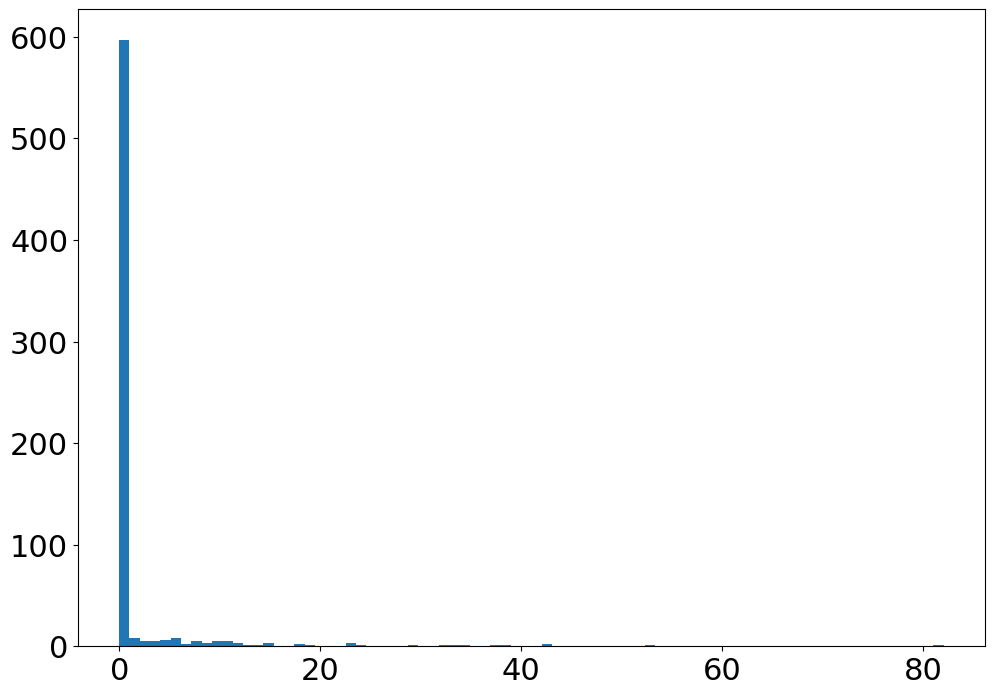

In [805]:
plt.hist(CT_slices,bins=80)

In [786]:
PTV_cutoffs['1467']

{}

In [20]:
def check_if_cut(slices, y_cutoff_roi, all_z_slices):
    if len(slices) == 0:
        return False
    for c_slice in slices:
        xo = []
        yo = []

        z = c_slice[2]
        if z in all_z_slices or z>min(all_z_slices):

#             xo = []
#             yo = []

            xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
            for k,y_i in enumerate(yi):
                if y_i < y_cutoff_roi:
                    xo.append(xi[k])
                    yo.append(yi[k])

    if len(xo)==0 and len(yo)==0:
        return False
    return True

In [810]:
p,RS_file

('1522', 'RS.1.2.246.352.221.50423586567316390399516958974914402718.dcm')

In [1]:

print(y_cutoff_roi)

NameError: name 'y_cutoff_roi' is not defined

In [26]:
PTV_cut= {}

for p in sorted(list_all_patients,reverse=True,key=int):
    patient_path = PATH+p+'/'
    CT_list = [d for d in os.listdir(patient_path) if d[9:11] == 'CT' and len(d) == 23]
    if len(CT_list) > 2:
        print(p,"has",len(CT_list),"CTs.")
    PTV_cutoffs[p] = {}    
    for CT in CT_list:
        CT_path = patient_path+CT+'/'
        RS_file = [rs for rs in os.listdir(CT_path) if 'RS' in rs][0]
        RS = dcm.read_file(CT_path+RS_file)
        
#         print(p, CT, RS_file)

        eye_ROI_names = [e for e in find_ROI_names(RS,keyword='eye') if '~' not in e]
#         print(eye_ROI_names)

        if len(eye_ROI_names) != 2:
            print(p, eye_ROI_names)
        if len(eye_ROI_names) == 0:
            print("***Patient", p, "CT",CT, "has no eye contours... ***")
            continue
            


        dict_contours, z_lists = get_all_ROI_contours(eye_ROI_names, RS)
#         print(z_lists)
        #         all_z_slices = sorted(z_lists[0] + [z for z in z_lists[1] if z not in z_lists[0]])
        all_z_slices = []
        for z_list in z_lists:
            all_z_slices = sorted(all_z_slices + [z for z in z_list if z not in all_z_slices])

        roi_slice, z_smg = get_avg_ROI_z_and_slice(z_lists)
#         print(roi_slice,z_smg)
        y_eye = []
        for eye in eye_ROI_names:
#             print(eye)
            roi_eye = dict_contours[eye][roi_slice] 
            for i in range(0,len(roi_eye),3):
                y_eye.append(roi_eye[i+1])
        max_eye = max(y_eye)
        min_eye = min(y_eye)
        y_cutoff_roi = ((max_eye-min_eye)/2+min_eye)
#         print(y_cutoff_roi)

        all_contour_names = find_ROI_names(RS)
        cut = []
        for name in all_contour_names:
            dict_cont, z_list = get_all_ROI_contours([name], RS)
            is_cut = check_if_cut(dict_cont[name], y_cutoff_roi, all_z_slices)
            if is_cut and 'lens' not in name.lower() and 'eye' not in name.lower():
                cut.append(name)
            if is_cut and 'ptv' in name.lower():
                if p not in PTV_cut:
                    PTV_cut[p] = {}
                if CT not in PTV_cut[p]:
                    PTV_cut[p][CT] = []
                
                PTV_cut[p][CT].append(name)
                

        print(p, cut)
        # dict_contours_all, z_lists_all = get_all_ROI_contours(all_contour_names, RS)

1522 []
1521 ['Skin', 'PTV_6000', 'CTV_6000', 'GTV', 'zDensityOverride', 'Bolus-3D', 'PTV_Eval_6000']
1520 has 3 CTs.
1520 []
1520 ['Skin']
1520 []
1518 []
1515 []
1515 []
1514 ['CTV_6000', 'CTV_7000', 'GTV', 'PTV!_6000', 'PTV_7000', 'Skin', 'Bolus_3D', 'PTV!_Eval_6000', 'PTV_Eval_7000']
1511 []
1511 []
1508 ['Skin']
1506 []
1503 []
1502 has 3 CTs.
1502 []
1502 []
1502 []
1497 []
1494 ['Skin']
1494 ['Skin']
1493 []
1489 ['CTV_6000', 'PTV_6000-05', 'Skin', 'Bolus']
1488 ['Skin', 'PTV_6000-05', 'PTV_Eval_6000-05']
1482 []
1481 []
1471 []
1470 ['Skin']
1467 []
***Patient 1467 CT 20230920_CT_20_SEP_2023 has no eye contours... ***
1467 ['PTV_6600', 'PTV_6000', 'CTV_6600', 'CTV_6000', 'Retina_L', 'Retina_R', 'PTV!_6000-05', 'PTV_6600-05']
1466 []
1464 ['Skin']
1462 []
1462 []
1461 ['Skin']
1449 ['Skin']
1444 []
1444 ['Bolus']
1443 ['Skin']
1438 ['Skin', 'PTV_7000-05', 'GTVp-prechemo', 'CTV_7000', 'GTVp-post chemo', 'GTV p+n-pre-chem', 'zPTV7000+PTV6000', 'z-cover66.5', 'PTV_Eval_7000', 'M1_P

920 []
919 []
919 []
918 []
918 []
917 []
916 []
916 []
915 ['CTV_6000', 'PTV!_6000-05', 'Skin']
914 []
914 []
913 []
913 []
912 ['Skin', 'Glnd_Lacrimal_L', 'Retina_L', 'Retina_R']
912 ['Skin']
911 []
910 []
910 []
909 []
908 []
908 []
907 []
906 []
905 ['Skin']
904 []
903 []
902 []
901 []
900 []
900 []
899 []
899 []
898 []
898 []
897 []
895 []
895 []
894 []
893 []
893 []
892 []
892 []
891 []
890 []
889 []
889 []
888 []
887 ['Skin']
886 []
885 []
884 []
883 []
882 []
881 []
880 []
880 []
879 []
878 []
877 ['PTV_6600-05', 'Retina_L', 'Retina_R', 'Bolus', 'CTV!_6000', 'PTV!_6000-05']
877 ['Glnd_Lacrimal_L', 'CTV_6600', 'CTV!_6000', 'Retina_L', 'Retina_R', 'Skin_3mm', 'M1_PTV_6600-05', 'PTV_6600-05', 'M1_PTV!_6000-05', 'M1_PTV_6600-03', 'M1_PTV!_6000-03', 'PTV!_6000-05', 'M1_CTV!_6000']
876 []
876 []
875 []
874 []
873 []
872 []
871 []
870 []
869 []
868 ['Glnd_Lacrimal_L', 'CTV-6000', 'PTV_6000-05', 'Glnd_Lacrimal_R', 'Retina_R', 'Bolus']
867 []
866 []
865 []
864 []
864 []
863 ['CTV_6000',

637 []
635 []
634 []
633 []
633 []
632 []
631 ['Normal 1', 'Normal 2']
631 []
630 ['RING 70', 'RING 60', 'Normal 1', 'Normal 2']
630 ['RING 70', 'RING 60', 'Normal 1', 'Normal 2']
629 []
628 []
628 []
625 []
625 []
624 []
623 []
622 []
621 []
619 []
619 []
618 ['Skin']
618 ['Skin']
617 []
616 []
616 []
615 []
614 []
613 ['RING AVOID']
611 []
607 []
606 []
606 []
604 []
604 []
602 []
600 []
600 []
520 []
520 []
518 []
518 []
517 []
517 []
515 []
514 []
513 []
513 []
512 []
512 []
510 []
509 []
507 ['Retina_L', 'Glnd_Lacrimal_L', 'Glnd_Lacrimal_R']
506 []
504 []
503 []
502 []
498 []
495 []
495 []
490 []
487 []
484 []
483 []
483 []
478 []
478 []
476 []
474 []
474 []
473 []
473 []
471 []
469 []
469 []
468 []
467 []
467 []
466 ['RING 70', 'CTV70', 'GTV', 'PTV70', 'PTV_OPT', 'PTV_ALL']
464 []
463 []
462 []
462 []
460 []
459 []
459 []
458 ['Eye_R']
458 []
456 []
454 []
454 []
453 []
452 []
452 []
451 []
449 ['Skin']
448 []
448 []
447 []
447 []
443 []
440 ['Normal 1', 'Normal 2', 'FrontalAvoid

In [83]:
len(PTV_cut.keys())

29

In [80]:
PTV_cut = {'1521': {'20231208_CT_21_NOV_2023': ['PTV_6000', 'PTV_Eval_6000']},
 '1514': {'20231211_CT_28_NOV_2023': ['PTV!_6000',
   'PTV_7000',
   'PTV!_Eval_6000',
   'PTV_Eval_7000']},
 '1489': {'20230913_CT_08_SEP_2023': ['PTV_6000-05']},
 '1488': {'20230921_CT_18_SEP_2023': ['PTV_6000-05', 'PTV_Eval_6000-05']},
 '1467': {'20230907_CT_01_SEP_2023': ['PTV_6600',
   'PTV_6000',
   'PTV!_6000-05',
   'PTV_6600-05']},
 '1438': {'20221031_CT_29_AUG_2022': ['PTV_7000-05',
   'zPTV7000+PTV6000',
   'PTV_Eval_7000',
   'M1_PTV_7000-05',
   'M1_PTV_7000',
   'M1_PTV_EVAL_7000']},
 '1434': {'20220913_CT_06_SEP_2022': ['PTV_6000-05']},
 '1432': {'20220930_CT_22_SEP_2022': ['PTV!_6000-05', 'PTV_ Eval_6000']},
 '1402': {'20220602_CT_27_MAY_2022': ['PTV!_6000']},
 '1209': {'20210402_CT_24_OCT_2019': ['PTV_6600-03',
   'M1_PTV_6600-05',
   'zPTV6600+PTV6000']},
 '1143': {'20180604_CT_23_MAY_2018': ['PTV60', 'PTV60_OPT']},
 '1130': {'20180803_CT_07_MAY_2018': ['PTV70+PTV60',
   'PTV_ALL',
   'PTV70',
   'PTV70_OPT',
   'PTV+Overlap']},
 '1071': {'20180118_CT_08_JAN_2018': ['PTV66',
   'PTV60',
   'PTVOPT 66 Gy',
   'PTVOPT 60Gy',
   'PTV ALL']},
 '980': {'20161208_CT_23_NOV_2016': ['PTV', 'PTV_OPT']},
 '936': {'20220519_CT_12_MAY_2022': ['PTV_6000-05']},
 '915': {'20211028_CT_20_OCT_2021': ['PTV!_6000-05']},
 '877': {'20201204_CT_24_NOV_2020': ['PTV_6600-05', 'PTV!_6000-05'],
  '20210114_CT_13_JAN_2021': ['M1_PTV_6600-05',
   'PTV_6600-05',
   'M1_PTV!_6000-05',
   'M1_PTV_6600-03',
   'M1_PTV!_6000-03',
   'PTV!_6000-05']},
 '868': {'20200811_CT_04_AUG_2020': ['PTV_6000-05']},
 '863': {'20201120_CT_11_NOV_2020': ['PTV!_6000']},
 '800': {'20220713_CT_07_JUL_2022': ['PTV_6000', 'PTV_5400']},
 '798': {'20180604_CT_29_MAY_2018': ['MOD1_PTV66+PTV60',
   'MOD1_PTV_ALL',
   'MOD1_PTV66',
   'PTV66',
   'MOD1_PTV66_OPT']},
 '730': {'20190913_CT_06_SEP_2019': ['PTV_6000']},
 '690': {'20171031_CT_23_OCT_2017': ['PTV60', 'PTV ALL', 'PTV60_OPT']},
 '681': {'20210122_CT_13_JAN_2021': ['PTV_7000-05']},
 '638': {'20170620_CT_20_JUN_2017': ['PTV_ALL',
   'M1P1 PTV 70',
   'M1P1 PTV 60',
   'M1P1 PTV60_OPT',
   'M1P1 PTV70_OPT',
   'M2P1 PTV70/27',
   'M2P1 PTVOPT54',
   'M2P1 PTVOPT57',
   'M2P1 PTVOPT65'],
  '20170601_CT_01_JUN_2017': ['PTV_ALL',
   'PTV60 OPT',
   'PTV60',
   'M1P1 PTV 70',
   'M1P1 PTV 60',
   'M1P1 PTV60_OPT',
   'M1P1 PTV70_OPT',
   'M1P1 PTV ALL']},
 '466': {'20181220_CT_13_DEC_2018': ['PTV70', 'PTV_OPT', 'PTV_ALL']},
 '437': {'20180305_CT_26_FEB_2018': ['PTV70+PTV60',
   'PTV_ALL',
   'PTV70',
   'PTV70_OPT 5MM',
   'PTV70_OPT3MM'],
  '20180315_CT_06_MAR_2018': ['MOD1_PTV_ALL',
   'MOD1_PTV70',
   'MOD1_PTV70+PTV60',
   'MOD1 PTV70_OPT']},
 '248': {'20201119_CT_24_DEC_2019': ['PTV_6000-05']},
 '108': {'20180222_CT_14_FEB_2018': ['PTV1', 'PTV2', 'PTV1 OPT', 'PTV2 OPT']}}

In [506]:
count_CTs_PTV_cut = 0
for p in PTV_cut:
    if p=='1514':
        continue
    for CT in PTV_cut[p]:
        print(p,CT)
        count_CTs_PTV_cut +=1

1521 20231208_CT_21_NOV_2023
1489 20230913_CT_08_SEP_2023
1488 20230921_CT_18_SEP_2023
1467 20230907_CT_01_SEP_2023
1438 20221031_CT_29_AUG_2022
1434 20220913_CT_06_SEP_2022
1432 20220930_CT_22_SEP_2022
1402 20220602_CT_27_MAY_2022
1209 20210402_CT_24_OCT_2019
1143 20180604_CT_23_MAY_2018
1130 20180803_CT_07_MAY_2018
1071 20180118_CT_08_JAN_2018
980 20161208_CT_23_NOV_2016
936 20220519_CT_12_MAY_2022
915 20211028_CT_20_OCT_2021
877 20201204_CT_24_NOV_2020
877 20210114_CT_13_JAN_2021
868 20200811_CT_04_AUG_2020
863 20201120_CT_11_NOV_2020
800 20220713_CT_07_JUL_2022
798 20180604_CT_29_MAY_2018
730 20190913_CT_06_SEP_2019
690 20171031_CT_23_OCT_2017
681 20210122_CT_13_JAN_2021
638 20170620_CT_20_JUN_2017
638 20170601_CT_01_JUN_2017
466 20181220_CT_13_DEC_2018
437 20180305_CT_26_FEB_2018
437 20180315_CT_06_MAR_2018
248 20201119_CT_24_DEC_2019
108 20180222_CT_14_FEB_2018


In [ ]:
1521 20231208_CT_21_NOV_2023 -- C30.0 - nasal cav
1489 20230913_CT_08_SEP_2023 -- C30.0
1488 20230921_CT_18_SEP_2023 -- C31.0 - sphenoidal sinus
1467 20230907_CT_01_SEP_2023 --C30.0
1438 20221031_CT_29_AUG_2022 -- C30
1434 20220913_CT_06_SEP_2022 -- C44.9 - DELETE??, 'LENT'
1432 20220930_CT_22_SEP_2022 -- /c30.
1402 20220602_CT_27_MAY_2022 -- C30
1209 20210402_CT_24_OCT_2019 --C31, 79.5
1143 20180604_CT_23_MAY_2018 -- C30
1130 20180803_CT_07_MAY_2018 -- C31.0
C79.5
C78.7
1514 - C30
1071 20180118_CT_08_JAN_2018 -- C30
980 20161208_CT_23_NOV_2016 --C30??
936 20220519_CT_12_MAY_2022 -- C30
915 20211028_CT_20_OCT_2021 -- C30
877 20201204_CT_24_NOV_2020 -- C30
877 20210114_CT_13_JAN_2021 -- C30
868 20200811_CT_04_AUG_2020 -- C30 
863 20201120_CT_11_NOV_2020  C30
800 20220713_CT_07_JUL_2022 -- C05
798 20180604_CT_29_MAY_2018 -- c05.9 - palate
730 20190913_CT_06_SEP_2019 --C30
690 20171031_CT_23_OCT_2017 -- C31.1
681 20210122_CT_13_JAN_2021 --C05.9
638 20170620_CT_20_JUN_2017 -- C31
638 20170601_CT_01_JUN_2017 -- C31
466 20181220_CT_13_DEC_2018 -- C30
437 20180305_CT_26_FEB_2018 -- C30
437 20180315_CT_06_MAR_2018 --C30
248 20201119_CT_24_DEC_2019 C30.0
108 20180222_CT_14_FEB_2018 --C30.0
22 C30, 6 C31, 3 pallete 

In [507]:
count_CTs_PTV_cut

31

In [500]:
PTVs_below_cut

590

In [503]:
total_CTs

673

In [508]:
print("PTVs cropped:",count_CTs_PTV_cut,"/",total_CTs,"CTs =",count_CTs_PTV_cut/total_CTs*100,"%")

PTVs cropped: 31 / 673 CTs = 4.606240713224369 %


In [509]:
print("PTVs entirely below crop:",PTVs_below_cut,"/",total_CTs,"CTs =",PTVs_below_cut/total_CTs*100,"%")


PTVs entirely below crop: 590 / 673 CTs = 87.66716196136701 %


In [ ]:
## Crop Ears

patient = '19'
patient_path = PATH+patient+'/'
CT = [d for d in os.listdir(patient_path) if d[9:11] == 'CT' and len(d) == 23][0]
CT_dcm = dcm.read_file(PATH+patient+'/'+CT+'/'+[f for f in os.listdir(PATH+patient+'/'+CT) if 'CT' in f][0])
RS_file = [d for d in os.listdir(patient_path+CT) if d[0:2] == 'RS'][0]
RS = dcm.read_file(PATH+patient+'/'+CT+'/'+RS_file)
RD = find_dose_file(patient_path+CT+'/')
# RD_file = 'RD.1.2.246.352.221.537436778072101049514669538410716431037.dcm'
# RD = dcm.read_file(PATH+patient+'/'+CT+'/'+RD_file)

In [223]:
slices = [dcm.read_file(PATH+patient+'/'+CT + '/'+ s) for s in os.listdir(PATH+patient+'/'+CT) if 'CT' in s]
# Order slices
slices.sort(key = lambda x: (x.InstanceNumber))
image = get_pixels_hu(slices)

Intersept: -1000
slope: 1


In [224]:
# Image Sacping Parameters
origin = slices[0].ImagePositionPatient
start_z = origin[2]
start_x = origin[0]
start_y = origin[1]
z_spacing = slices[0].SliceThickness 
pixel_spacing = slices[0].PixelSpacing
spacing = [pixel_spacing[0],pixel_spacing[1],z_spacing]

# Spacing in Z,X,Y format
dose_spacing = [RD.GridFrameOffsetVector[1]-RD.GridFrameOffsetVector[0],RD.PixelSpacing[0],RD.PixelSpacing[1]]
CT_spacing = [CT_dcm.SliceThickness,pixel_spacing[0],pixel_spacing[1]]

In [225]:
eye_ROI_names = [f for f in find_ROI_names(RS,keyword='eye') if "~" not in f]
print(eye_ROI_names)

['Eye_R', 'Eye_L']


In [226]:
dict_contours, z_lists = get_all_ROI_contours(eye_ROI_names, RS)
roi_slice, z_smg = get_avg_ROI_z_and_slice(z_lists)

In [227]:
all_z_slices = []
for z_list in z_lists:
    all_z_slices = sorted(all_z_slices + [z for z in z_list if z not in all_z_slices])

In [228]:
img_slice = get_image_slice(start_z, z_smg, [0,0,z_spacing])
print("Centre ROI slice:", img_slice)

Centre ROI slice: 102


In [229]:
roi_x, roi_y = get_ROI_pixel_array(dict_contours[eye_ROI_names[0]][roi_slice],start_x,start_y,pixel_spacing)
roi_x2, roi_y2 = get_ROI_pixel_array(dict_contours[eye_ROI_names[1]][roi_slice],start_x,start_y,pixel_spacing)

In [230]:
y_eye = []
roi_eye = dict_contours[eye_ROI_names[1]][roi_slice]
for eye in eye_ROI_names:
    roi_eye = dict_contours[eye][roi_slice] 
    for i in range(0,len(roi_eye),3):
        y_eye.append(roi_eye[i+1])
max_eye = max(y_eye)
min_eye = min(y_eye)
y_cutoff_roi = ((max_eye-min_eye)/2+min_eye)

In [231]:
min_x = (min(min(roi_x),min(roi_x2)))
max_x = (max(max(roi_x),max(roi_x2)))
min_y = (min(min(roi_y),min(roi_y2)))
max_y = (max(max(roi_y),max(roi_y2)))

In [232]:
y_cutoff = ((max_y-min_y)/2+min_y)


In [150]:
find_ROI_names(RS,'body')

['BODY']

In [151]:
dict_contours_body, z_lists_body = get_all_ROI_contours(['BODY'], RS)

In [114]:
def get_ROI_slice(z_target,z_list):
    
    slice_num = 0
    slice_nums = []
    for z in z_list:
        if z == z_target:
            slice_nums.append(slice_num)
#             return slice_num
        slice_num +=1
    return slice_nums


In [256]:
ear_slice = 92
z_ear = start_z + z_spacing*ear_slice

In [237]:
# z_ear = z_smg

In [238]:
brain_ROI_names = find_ROI_names(RS,keyword='brain')
print(brain_ROI_names)
body_names = find_ROI_names(RS,'body')
print(body_names)

['Brain', 'Brainstem_PRV5', 'Brainstem']
['BODY']


In [258]:
dict_contours_brain, z_lists_brain = get_all_ROI_contours(['Brain'], RS)
dict_contours_body, z_lists_body = get_all_ROI_contours(['BODY'], RS)
roi_brain = get_ROI_slice(z_ear, z_lists_brain[0])
roi_body = get_ROI_slice(z_ear, z_lists_body[0])

In [259]:
# z_smg = z_smg+6
# img_slice = img_slice+2
print(z_smg)

-422.5


In [260]:
find_ROI_names(RS,'lacrimal')

[]

In [261]:
brain_x, brain_y = get_ROI_pixel_array(dict_contours_brain['Brain'][roi_brain],start_x,start_y,pixel_spacing)
body_x, body_y = get_ROI_pixel_array(dict_contours_body['BODY'][roi_body],start_x,start_y,pixel_spacing)


In [262]:
dict_gland, z_lists_gland = get_all_ROI_contours(['Glnd_Lacrimal_R'], RS)
dict_ret, z_lists_ret = get_all_ROI_contours(['Retina_L'], RS)
roi_gland = get_ROI_slice(z_smg, z_lists_gland[0])
roi_ret = get_ROI_slice(z_smg, z_lists_ret[0])
gland_x, gland_y = get_ROI_pixel_array(dict_gland['Glnd_Lacrimal_R'][roi_gland],start_x,start_y,pixel_spacing)
ret_x, ret_y = get_ROI_pixel_array(dict_ret['Retina_L'][roi_ret],start_x,start_y,pixel_spacing)


UnboundLocalError: local variable 'index' referenced before assignment

In [263]:
find_ROI_names(RS,'PTV')

['PTV70+PTV60', 'PTV_ALL', 'PTV70', 'PTV60', 'PTV56']

In [264]:
dict_PTV, z_lists_ptv = get_all_ROI_contours(['PTV_ALL'], RS)
roi_ptv = get_ROI_slice(z_smg, z_lists_ptv[0])
ptv_x, ptv_y = get_ROI_pixel_array(dict_PTV['PTV_ALL'][roi_ptv],start_x,start_y,pixel_spacing)
# ret_x, ret_y = get_ROI_pixel_array(dict_ret['Retina_L'][roi_ret],start_x,start_y,pixel_spacing)


TypeError: list indices must be integers or slices, not NoneType

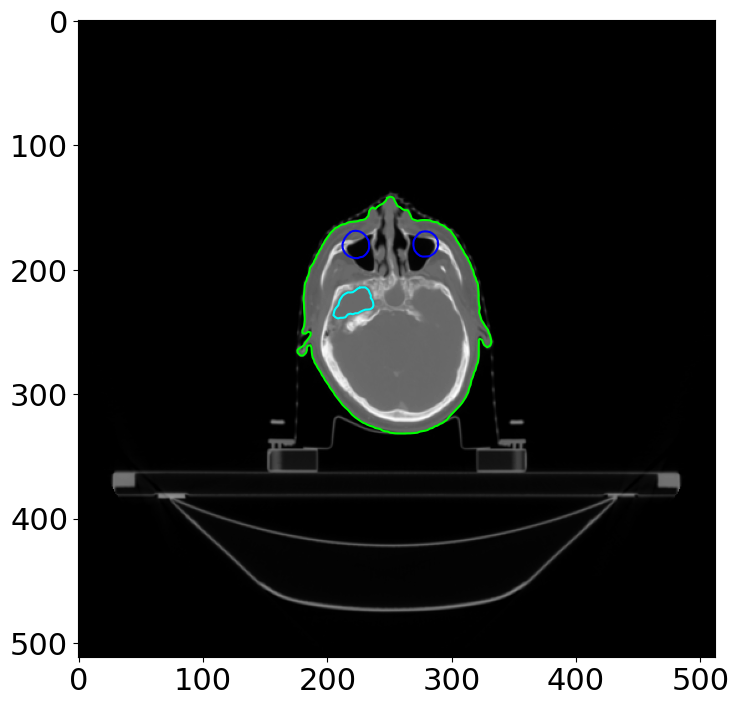

In [267]:
plt.imshow(image[ear_slice],cmap='gray')
plt.plot(roi_x,roi_y,'-',color='blue')
plt.plot(roi_x2,roi_y2,'-',color='blue')
# plt.plot(gland_x,gland_y,'-',color='magenta')
# plt.plot(ret_x,ret_y,'-',color='orange')
plt.plot(brain_x,brain_y,'-',color='cyan')
plt.plot(body_x,body_y,'-',color='lime')
# plt.plot(ptv_x,ptv_y,'r')

In [327]:
from scipy.interpolate import splrep, splev
from matplotlib.patches import Ellipse
from skimage.measure import EllipseModel

In [292]:
xy = [[xs,ys] for xs, ys in sorted(zip(body_x, body_y))]
xs, ys = zip(*xy)

In [339]:
slice = dict_contours_body['BODY'][roi_body]
xi, yi, zi = slice[::3], slice[1::3], slice[2::3]
tuples = np.array(list(zip(xi,yi)))

In [351]:
tuples

array([[-8.7300e+00, -3.0630e+01],
       [-6.4000e+00, -3.1650e+01],
       [-4.0700e+00, -3.1010e+01],
       [-3.1300e+00, -3.0120e+01],
       [-2.2000e+00, -2.7790e+01],
       [-1.7500e+00, -2.6980e+01],
       [-9.1000e-01, -2.5460e+01],
       [ 1.9000e-01, -2.3140e+01],
       [ 5.8000e-01, -2.2790e+01],
       [ 2.9100e+00, -2.1840e+01],
       [ 4.1600e+00, -2.0810e+01],
       [ 5.2400e+00, -1.9920e+01],
       [ 7.5700e+00, -1.8990e+01],
       [ 9.8900e+00, -1.8960e+01],
       [ 1.0400e+01, -1.8480e+01],
       [ 1.1740e+01, -1.6150e+01],
       [ 1.2220e+01, -1.5130e+01],
       [ 1.2800e+01, -1.3820e+01],
       [ 1.3660e+01, -1.1500e+01],
       [ 1.4550e+01, -1.0550e+01],
       [ 1.6880e+01, -9.7500e+00],
       [ 1.8620e+01, -9.1700e+00],
       [ 1.9210e+01, -8.9700e+00],
       [ 2.0080e+01, -9.1700e+00],
       [ 2.1540e+01, -9.5100e+00],
       [ 2.3860e+01, -9.7800e+00],
       [ 2.6190e+01, -9.8200e+00],
       [ 2.8520e+01, -9.6800e+00],
       [ 3.0850e+01,

In [348]:
ell = EllipseModel()
ell.estimate(tuples)

xc,yc,a,b,theta = ell.params
ell_patch = Ellipse((xc,yc),2*a, 2*b, theta*180/np.pi, edgecolor='blue',facecolor='none')



ellipse = Ellipse((np.mean(xi), np.mean(yi)),width=np.std(xi)*2,height=np.std(yi)*2,edgecolor='b',facecolor='none')

/tmp/ipykernel_367659/1488079818.py:5: MatplotlibDeprecationWarning: Passing the angle parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ell_patch = Ellipse((xc,yc),2*a, 2*b, theta*180/np.pi, edgecolor='blue',facecolor='none')


In [ ]:
tuples

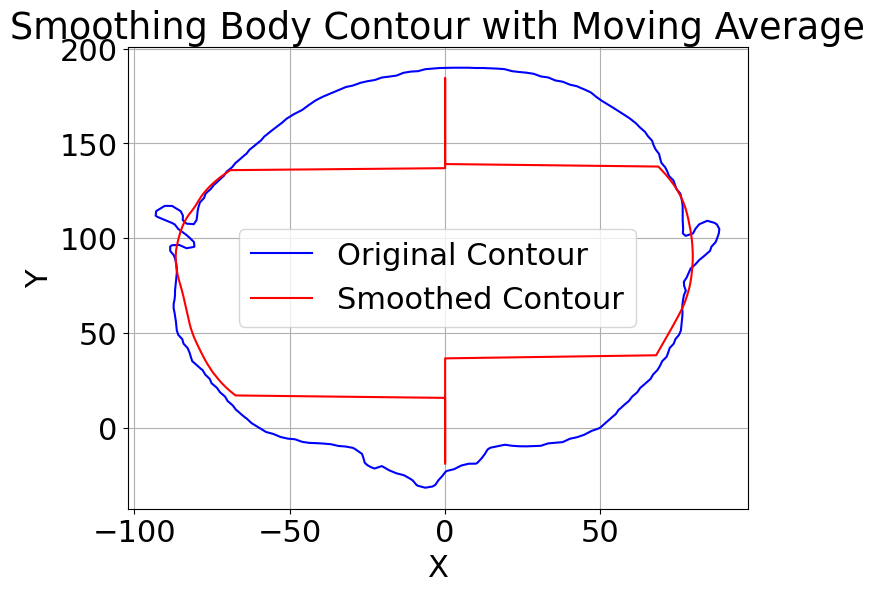

In [364]:
points=tuples
def moving_average(data, window_size,min_cut=0,max_cut=0):
    smoothed_data = np.zeros_like(data)
    half_window = window_size // 2

    for i in range(len(data)):
#         print(data[i])
        
        if data[i] <= min_cut or data[i] >= max_cut:
            start = max(0, i - half_window)
            end = min(len(data), i + half_window + 1)
            smoothed_data[i] = np.mean(data[start:end])

    return smoothed_data

# Choose a window size (e.g., 5 for a small window)
window_size = 50

# Apply moving average to x and y coordinates
smoothed_x = moving_average(points[:, 0], window_size,min_cut=-70,max_cut=70)
smoothed_y = moving_average(points[:, 1], window_size)#,min_cut=,max_cut=)

# Plot original and smoothed contours
plt.figure(figsize=(8, 6))
plt.plot(points[:, 0], points[:, 1], label='Original Contour', color='b')
plt.plot(smoothed_x, smoothed_y, label='Smoothed Contour', color='r')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Smoothing Body Contour with Moving Average')
plt.legend()
plt.grid(True)
plt.show()


In [349]:

# Fit spline with s=0 (passing through all points)
tck, u = interpolate.splprep([xi, yi], s=1000, per=True)

# Evaluate spline for 1000 evenly spaced points
xj, yj = interpolate.splev(np.linspace(0, 1, 1000), tck)

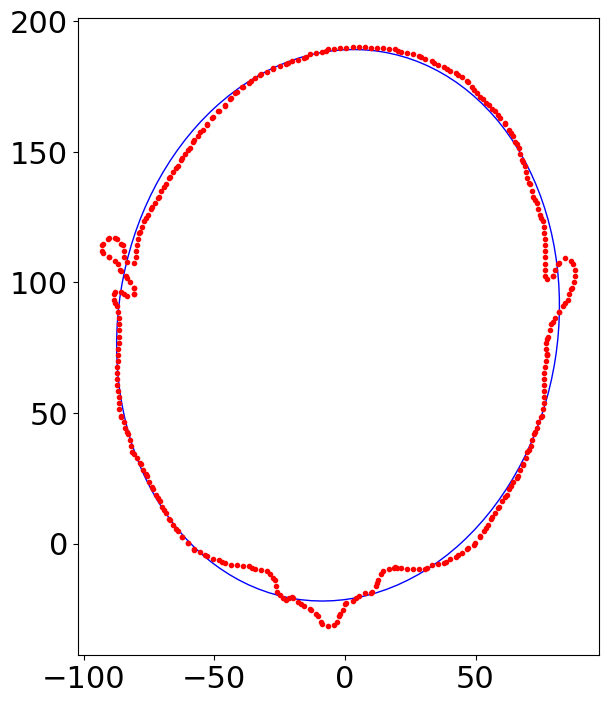

In [350]:
# plt.plot(xj,yj,'b-')
plt.plot(xi,yi,'r.')
ax = plt.gca()
# plt.gca().add_patch(ellipse)
plt.gca().add_patch(ell_patch)

ax.set_aspect('equal', adjustable='box')



In [249]:
ROI_names_to_keep = find_ROI_names(RS,'eye') + find_ROI_names(RS,'lacrimal') + find_ROI_names(RS,'PTV') +find_ROI_names(RS,keyword='brain')
contours_to_keep,_ = get_all_ROI_contours( ROI_names_to_keep, RS) 

In [250]:
anon,cmid =generate_anon_image(image,z_lists,spacing,y_cutoff, cut_above = True,isodose=[], contours_to_keep = contours_to_keep,origin=origin)

98 -434.5
99 -431.5
100 -428.5
101 -425.5
102 -422.5
103 -419.5
104 -416.5
105 -413.5
106 -410.5


In [251]:
ROI_names_to_keep# cmid

['Eye_R',
 'Eye_L',
 'PTV70+PTV60',
 'PTV_ALL',
 'PTV70',
 'PTV60',
 'PTV56',
 'Brain',
 'Brainstem_PRV5',
 'Brainstem']

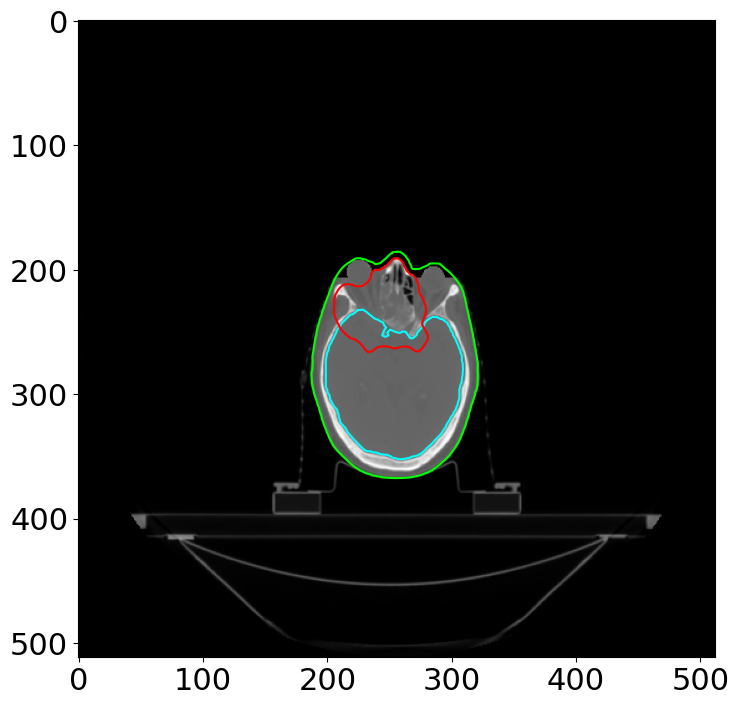

In [180]:

# fig = plt.figure(figsize=(20, 10))

# fig.add_subplot(1,2,1)
plt.imshow(anon[img_slice],cmap='gray')
# plt.plot(roi_x2,roi_y2,'-',color='blue')
# plt.plot(gland_x,gland_y,'-',color='magenta')
# plt.plot(ret_x,ret_y,'-',color='orange')
plt.plot(brain_x,brain_y,'-',color='cyan')
plt.plot(ptv_x,ptv_y,'-',color='red')
plt.plot(body_x,body_y,'-',color='lime')
# x_cord, y_cord = zip(*cmid.reshape(len(cmid),2))
# plt.plot(x_cord, y_cord ,'g-')

# fig.add_subplot(1,2,2)

In [194]:
z_smg

-347.5

In [111]:
full_stack_N = generate_anon_body(dict_contours_body,z_lists,y_cutoff_roi, isodose=[], body_name = 'BODY',contours_to_keep=contours_to_keep)
pts, triangles = generate_mesh_from_array(full_stack_N,z_cutoff=-450)

NameError: name 'contours_to_keep' is not defined

In [197]:
pts, triangles = generate_mesh_from_array(full_stack_N,z_cutoff=-450)

In [195]:
for slice in full_stack_N:
    if slice[2] == z_smg:
        break
x_new_body = slice[::3] 
y_new_body = slice[1::3] 
z_new_body =slice[2::3] 
x_new, y_new, z_new = xyz_to_image_coords(x_new_body,y_new_body,z_new_body,spacing,origin)
#(pts[::3], pts[1::3],

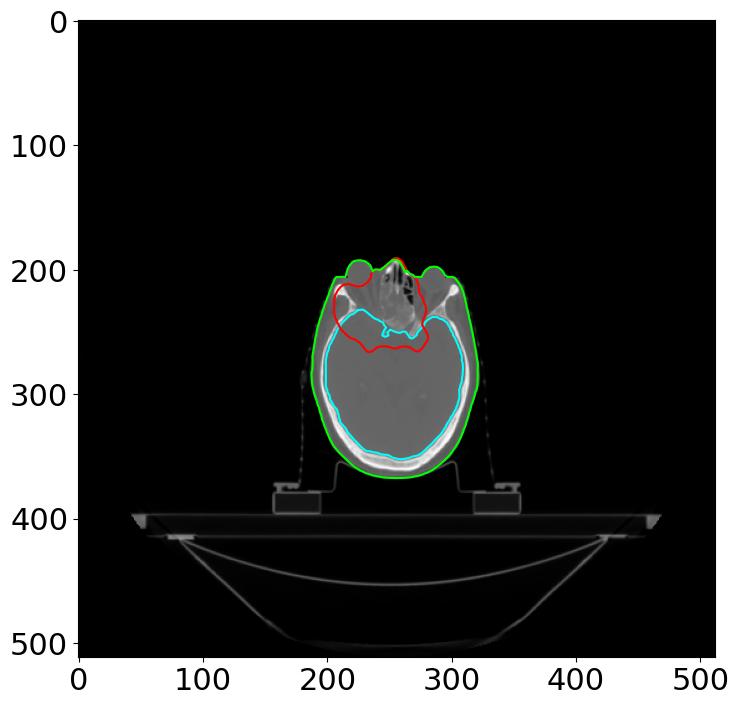

In [196]:

# fig = plt.figure(figsize=(20, 10))

# fig.add_subplot(1,2,1)
plt.imshow(anon[img_slice],cmap='gray')
# plt.plot(roi_x2,roi_y2,'-',color='blue')
# plt.plot(gland_x,gland_y,'-',color='magenta')
# plt.plot(ret_x,ret_y,'-',color='orange')
plt.plot(brain_x,brain_y,'-',color='cyan')
plt.plot(ptv_x,ptv_y,'-',color='red')
plt.plot(x_new ,y_new,'-',color='lime')
# x_cord, y_cord = zip(*cmid.reshape(len(cmid),2))
# plt.plot(x_cord, y_cord ,'g-')

# fig.add_subplot(1,2,2)

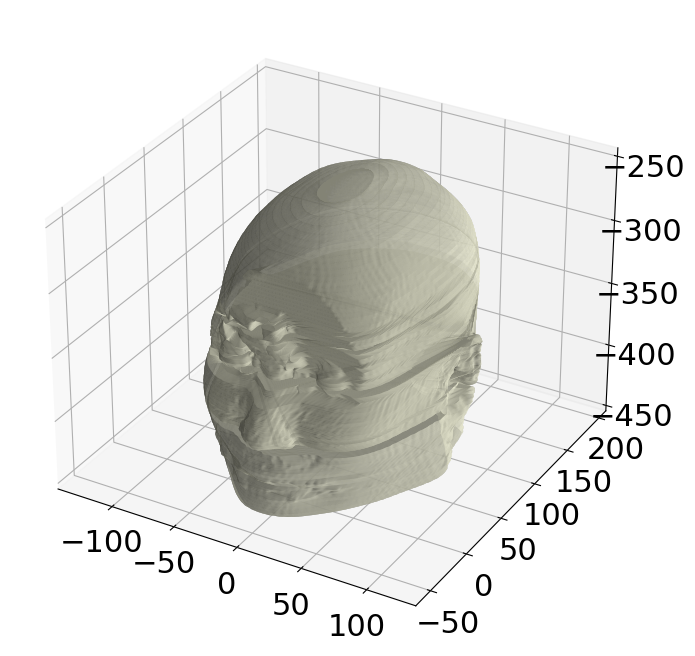

In [198]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot_trisurf(pts[::3], pts[1::3], pts[2::3], triangles=triangles, alpha=1, shade=True,color='beige')
# ax.plot_trisurf(ptsL[::3], ptsL[1::3], ptsL[2::3], triangles=trianglesL, alpha=1, shade=True,color='red')
# ax.plot_trisurf(ptsR[::3], ptsR[1::3], ptsR[2::3], triangles=trianglesR, alpha=1, shade=True,color='blue')
# ax.plot_trisurf(ptsLL[::3], ptsLL[1::3], ptsLL[2::3], triangles=trianglesLL, alpha=1, shade=True,color='green')
ax.set_aspect('equal', adjustable='box')
plt.show()

In [658]:
y_cutoff_roi

19.58

In [690]:
len(full_stack_N)

419

In [767]:
# def generate_anon_dose_map():
#     def generate_anon_image(image,z_lists,spacing,y_cutoff, cut_above = True,isodose=[], contours_to_keep = [],origin=[0,0,0]):
#     anon_image = image.copy()
#     cont_mid= []
#     all_z_slices = sorted(z_lists[0] + [z for z in z_lists[1] if z not in z_lists[0]])

#     prev_z = -1000
#     for i in range(max([len(z) for z in z_lists])):
#         current_z = all_z_slices[i]
#         img_slice = get_image_slice(start_z, all_z_slices[i], spacing)
#         print(img_slice,current_z)


#         for j,row in enumerate(image[img_slice]):
# #             print(j)
#             new_row = [-1000]*len(row)
            
#             if len(isodose) > 0:
#                 for k, col in enumerate(isodose[img_slice][j]):
#                     if col == 1:
#                         new_row[k] = row[k]
            
# #             if current_z != prev_z:
# #                 print("X")
#             for contour in contours_to_keep:
# #                 print(contour)
#                 for c_slice in contours_to_keep[contour]:
#                     if c_slice[2] == current_z:

#                         xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
#                         X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)



#                         cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
#                         cont_xy = cont_xy.reshape((-1,1,2))
# #                         cv2.drawContours(mask,cont_xy,-1,1)

# #                              print("HI",cont_xy)
#                         for k in range(len(new_row)):
#                             result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
# #                             print(k,j,result)
#                             if result == 1:
# #                                 print(contour)
#                                 new_row[k] = row[k]

#                         if img_slice ==111:
#                             cont_mid = cont_xy
#                         break
                
#             anon_image[img_slice][j] = new_row
#             prev_z = current_z

#             if j > y_cutoff:
#                 break
            
#     if cut_above:
#         for slice in range(img_slice,len(image)):
#         #     print(slice)
#             for j,row in enumerate(image[slice]):
#                 new_row = [-1000]*len(row)
                
#                 if len(isodose) > 0:
#                     for k, col in enumerate(isodose[img_slice][j]):
#     #                 print(col)
#                         if col == 1:
#                             new_row[k] = row[k]
                
#                 for contour in contours_to_keep:
#                 #                 print(contour)
#                     for c_slice in contours_to_keep[contour]:
#                         if c_slice[2] == current_z:

#                             xi, yi, zi = c_slice[::3], c_slice[1::3], c_slice[2::3]
#                             X,Y,Z = xyz_to_image_coords(xi,yi,zi,spacing,origin)



#                             cont_xy = np.array([tuple([int(x),int(y)]) for x,y in zip(X,Y)])
#                             cont_xy = cont_xy.reshape((-1,1,2))
#                         #                         cv2.drawContours(mask,cont_xy,-1,1)

#                         #                              print("HI",cont_xy)
#                             for k in range(len(new_row)):
#                                 result = cv2.pointPolygonTest(cont_xy, (k,j), False) 
#                         #                             print(k,j,result)
#                                 if result == 1:
#                         #                                 print(contour)
#                                     new_row[k] = row[k]
    
#                 anon_image[slice][j] = new_row
#                 #         print(len(row))
#                 #         print(new_row)
#                 if j > y_cutoff:
#                     break
                    
#     return anon_image,cont_mid



# CBCTs

In [ ]:
# use reg file Z and jsut do slicewise that way i think... no actually i dont think so 

In [569]:
patient ='19'
p_file_lists = get_file_lists(PATH+patient+'/',True)

['20180411_CT_09_APR_2018', '20180515_CT_10_MAY_2018']
['20180509_kV_CBCT_16a', '20180501_kV_CBCT_11a', '20180507_kV_CBCT_15a', '20180529_kV_CBCT_10a', '20180424_kV_CBCT_6a', '20180417_kV_CBCT_1a', '20180514_kV_CBCT_20a', '20180426_kV_CBCT_8a', '20180522_kV_CBCT_5a', '20180525_kV_CBCT_8a', '20180420_kV_CBCT_4a', '20180531_kV_CBCT_12a', '20180515_kV_CBCT_1a', '20180503_kV_CBCT_13a']
True
['20180417_kV_CBCT_1a', '20180515_kV_CBCT_1a']
['20180417_kV_CBCT_1a', '20180420_kV_CBCT_4a', '20180424_kV_CBCT_6a', '20180426_kV_CBCT_8a', '20180501_kV_CBCT_11a', '20180503_kV_CBCT_13a', '20180507_kV_CBCT_15a', '20180509_kV_CBCT_16a', '20180514_kV_CBCT_20a']
REPLNA ['20180515_kV_CBCT_1a', '20180522_kV_CBCT_5a', '20180525_kV_CBCT_8a', '20180529_kV_CBCT_10a', '20180531_kV_CBCT_12a']


In [519]:
p_file_lists

{'20231031_CT_27_OCT_2023': {'UID': '1.2.246.352.221.50993309802865898577308493759744761241',
  'CBCTs': ['20231106_kV_CBCT_01d',
   '20231108_kV_CBCT_03e',
   '20231113_kV_CBCT_06p',
   '20231115_kV_CBCT_08l',
   '20231120_kV_CBCT_11d',
   '20231122_kV_CBCT_13f',
   '20231127_kV_CBCT_16d',
   '20231129_kV_CBCT_18d',
   '20231204_kV_CBCT_21a',
   '20231206_kV_CBCT_23g',
   '20231211_kV_CBCT_26m',
   '20231213_kV_CBCT_28e']}}

In [520]:
import importlib

In [585]:
importlib.reload(Registration.dicom_registration)

<module 'Registration.dicom_registration' from '/home/kayla/HNC_Kayla/code/Data_Processing/Registration/dicom_registration.py'>

In [586]:
import Registration.dicom_registration

In [587]:
from Registration.dicom_registration import *

In [646]:
skipped

['1467',
 '1462',
 '1461',
 '1449',
 '1444',
 '1444',
 '1443',
 '1438',
 '1434',
 '1433',
 '1432',
 '1428',
 '1420',
 '1402',
 '1400',
 '1396',
 '1393',
 '1381',
 '1380',
 '1374',
 '1364',
 '1360',
 '1350',
 '1343',
 '1341',
 '1340',
 '1333',
 '1332',
 '1331',
 '1328',
 '1325',
 '1317',
 '1314',
 '1314',
 '1314',
 '1311',
 '1311',
 '1306',
 '1306',
 '1296',
 '1289',
 '1288',
 '1288',
 '1275',
 '1271',
 '1269',
 '1268',
 '1268',
 '1262',
 '1255',
 '1255',
 '1254',
 '1252',
 '1252',
 '1233',
 '1221',
 '1215',
 '1209',
 '1198',
 '1189',
 '1188',
 '1184',
 '1183',
 '1177',
 '1175',
 '1169',
 '1167',
 '1167',
 '1165',
 '1149',
 '1145',
 '1143',
 '1132',
 '1130',
 '1130',
 '1109',
 '1100',
 '1095',
 '1089',
 '1089',
 '1081',
 '1075',
 '1074',
 '1071',
 '1059',
 '1059',
 '1058',
 '1056',
 '1053',
 '1052',
 '1048',
 '1044',
 '1036',
 '1027',
 '1026',
 '1026',
 '1021',
 '1019',
 '1013',
 '1001',
 '991',
 '990',
 '980',
 '979',
 '978',
 '977',
 '977',
 '976',
 '975',
 '975',
 '974',
 '973',
 '97

In [601]:
list_all_patients.index('1462')

23

In [648]:
dict_reg_mat = {}
dict_num_slices = {}
cbct = ''
skipped = []

In [896]:
for patient in list_all_patients:
    print(patient)
    if patient=='666':
        continue
    dict_reg_mat[patient] = {}
    dict_num_slices[patient]={}
    p_file_lists = {}
    p_file_lists = get_file_lists(PATH+patient+'/',True)
    print(p_file_lists)
    
    for CT in p_file_lists:
        try:
            dict_num_slices[patient][CT] = {}
            dict_reg_mat[patient][CT] = {}

            eye_ROI_names = find_ROI_names(RS,keyword='eye')
            if len(eye_ROI_names) ==0:
                print(patient, "HAS NO EYES")
                continue
            dict_contours, z_lists = get_all_ROI_contours(eye_ROI_names, RS)
        #     roi_slice, z_smg = get_avg_ROI_z_and_slice(z_lists)
            z_min = [min(z_list) for z_list in z_lists]


            for cbct in p_file_lists[CT]['CBCTs']:
    #             print(cbct)
                cbct_path = PATH+patient+'/'+cbct+'/'
    #             print(cbct_path)
                registration_file=''

                for f in os.listdir(cbct_path):
        #             print(f)
                    if f[0:2] == 'RE':
                        registration_file = cbct_path + f
                        _, mat = get_transformation_matrix(registration_file)
                        z_trans = mat[2][3]
                        dict_reg_mat[patient][cbct] = mat[2][3]
                        continue

                z_min_cbct = z_min+z_trans

                slices = [dcm.read_file(PATH+patient+'/'+cbct + '/'+ s) for s in os.listdir(PATH+patient+'/'+cbct) if 'CT' in s]
                origin = slices[0].ImagePositionPatient
                start_z = origin[2]
                z_spacing = slices[0].SliceThickness 
                num_slices = len(slices)
                dict_num_slices[patient][CT][cbct] = {}
                dict_num_slices[patient][CT][cbct]['slices'] = num_slices
                dict_num_slices[patient][CT][cbct]['origin'] = origin
                dict_num_slices[patient][CT][cbct]['start_z'] = start_z
                dict_num_slices[patient][CT][cbct]['z_spacing'] = z_spacing
                dict_num_slices[patient][CT][cbct]['z_min_cbct'] = z_min_cbct
                dict_num_slices[patient][CT][cbct]['z_min_CT'] = z_min
                dict_num_slices[patient][CT][cbct]['z_trans'] = z_trans
        except Exception as e:
            print(patient,e)
            skipped.append(patient)


    # Order slices

1522
['20231031_CT_27_OCT_2023']
['20231106_kV_CBCT_01d', '20231129_kV_CBCT_18d', '20231211_kV_CBCT_26m', '20231204_kV_CBCT_21a', '20231120_kV_CBCT_11d', '20231115_kV_CBCT_08l', '20231213_kV_CBCT_28e', '20231127_kV_CBCT_16d', '20231206_kV_CBCT_23g', '20231122_kV_CBCT_13f', '20231113_kV_CBCT_06p', '20231108_kV_CBCT_03e']
False
{'20231031_CT_27_OCT_2023': {'UID': '1.2.246.352.221.50993309802865898577308493759744761241', 'CBCTs': ['20231106_kV_CBCT_01d', '20231108_kV_CBCT_03e', '20231113_kV_CBCT_06p', '20231115_kV_CBCT_08l', '20231120_kV_CBCT_11d', '20231122_kV_CBCT_13f', '20231127_kV_CBCT_16d', '20231129_kV_CBCT_18d', '20231204_kV_CBCT_21a', '20231206_kV_CBCT_23g', '20231211_kV_CBCT_26m', '20231213_kV_CBCT_28e']}}
1521
['20231208_CT_21_NOV_2023']
['20231214_kV_CBCT_01f', '20240115_kV_CBCT_21n', '20231214_kV_CBCT_01g', '20231226_kV_CBCT_08p', '20240125_kV_CBCT_29g', '20240117_kV_CBCT_23k', '20240104_kV_CBCT_14k', '20240102_kV_CBCT_12k', '20231228_kV_CBCT_10g', '20231218_kV_CBCT_03m', '202

1503
['20230918_CT_12_SEP_2023']
['20231030_kV_CBCT_24t', '20230928_kV_CBCT_03l', '20231024_kV_CBCT_20m', '20231005_kV_CBCT_08r', '20231017_kV_CBCT_15r', '20231003_kV_CBCT_06t', '20230926_kV_CBCT_01f', '20231012_kV_CBCT_12r', '20231101_kV_CBCT_26l', '20231010_kV_CBCT_10t', '20231026_kV_CBCT_22q', '20231106_kV_CBCT_29c', '20231019_kV_CBCT_17m']
False
{'20230918_CT_12_SEP_2023': {'UID': '1.2.246.352.221.52161829691990489026777861417936457137', 'CBCTs': ['20230926_kV_CBCT_01f', '20230928_kV_CBCT_03l', '20231003_kV_CBCT_06t', '20231005_kV_CBCT_08r', '20231010_kV_CBCT_10t', '20231012_kV_CBCT_12r', '20231017_kV_CBCT_15r', '20231019_kV_CBCT_17m', '20231024_kV_CBCT_20m', '20231026_kV_CBCT_22q', '20231030_kV_CBCT_24t', '20231101_kV_CBCT_26l', '20231106_kV_CBCT_29c']}}
1502
['20230817_CT_09_AUG_2023', '20230911_CT_07_SEP_2023', '20230929_CT_27_SEP_2023']
['20230823_kV_CBCT_01e', '20230912_kV_CBCT_01j', '20230825_kV_CBCT_03c', '20230927_kV_CBCT_12d', '20230914_kV_CBCT_03l', '20230926_kV_CBCT_11c'

1471
['20230505_CT_01_MAY_2023']
['20230531_kV_CBCT_17m', '20230508_kV_CBCT_01n', '20230517_kV_CBCT_08d', '20230529_kV_CBCT_15n', '20230605_kV_CBCT_20e', '20230523_kV_CBCT_11c', '20230515_kV_CBCT_06h', '20230510_kV_CBCT_03n', '20230525_kV_CBCT_13d']
False
{'20230505_CT_01_MAY_2023': {'UID': '1.2.246.352.221.57450193718631270893435316425516876695', 'CBCTs': ['20230508_kV_CBCT_01n', '20230510_kV_CBCT_03n', '20230515_kV_CBCT_06h', '20230517_kV_CBCT_08d', '20230523_kV_CBCT_11c', '20230525_kV_CBCT_13d', '20230529_kV_CBCT_15n', '20230531_kV_CBCT_17m', '20230605_kV_CBCT_20e']}}
1470
['20230403_CT_27_MAR_2023']
['20230425_kV_CBCT_14i', '20230419_kV_CBCT_10n', '20230413_kV_CBCT_06l', '20230508_kV_CBCT_23o', '20230510_kV_CBCT_25p', '20230405_kV_CBCT_01m', '20230517_kV_CBCT_30p', '20230501_kV_CBCT_18k', '20230503_kV_CBCT_20o', '20230427_kV_CBCT_16n', '20230515_kV_CBCT_28m', '20230417_kV_CBCT_08o', '20230410_kV_CBCT_03l']
False
{'20230403_CT_27_MAR_2023': {'UID': '1.2.246.352.221.46946485401443616

KeyboardInterrupt: 

In [897]:
len(dict_num_slices)


502

In [591]:
dict_num_slices

{'19': {'20180411_CT_09_APR_2018': {'20180417_kV_CBCT_1a': {'slices': 139,
    'origin': [-298, -196, -530.5],
    'start_z': '-530.5',
    'z_spacing': '3.0',
    'z_min_cbct': array([-1012., -1012.]),
    'z_min_CT': [-454.5, -454.5],
    'z_trans': -557.5},
   '20180420_kV_CBCT_4a': {'slices': 139,
    'origin': [-298, -196, -530.5],
    'start_z': '-530.5',
    'z_spacing': '3.0',
    'z_min_cbct': array([-1012., -1012.]),
    'z_min_CT': [-454.5, -454.5],
    'z_trans': -557.5},
   '20180424_kV_CBCT_6a': {'slices': 139,
    'origin': [-298, -196, -530.5],
    'start_z': '-530.5',
    'z_spacing': '3.0',
    'z_min_cbct': array([-1012., -1012.]),
    'z_min_CT': [-454.5, -454.5],
    'z_trans': -557.5},
   '20180426_kV_CBCT_8a': {'slices': 139,
    'origin': [-298, -196, -530.5],
    'start_z': '-530.5',
    'z_spacing': '3.0',
    'z_min_cbct': array([-1012.79679144, -1012.79679144]),
    'z_min_CT': [-454.5, -454.5],
    'z_trans': -558.29679144385},
   '20180501_kV_CBCT_11a': {'

In [721]:
dict_fin

[86.56755781811495,
 124.79651769157817,
 5.3647020917429415,
 134.069726150721,
 27.490992681987876,
 71.45190072059617,
 111.24639105796797,
 133.1333607435226,
 71.83734716259482,
 120.77832104687957,
 38.4287229712599,
 22.510926836310915,
 95.43483075154566,
 168.4638535059415,
 233.90637993346974,
 81.21113600823469,
 235.81879963562608,
 78.92645268294767,
 134.93382565363868,
 222.77688166555566,
 122.97500291582568,
 232.8807299889389,
 85.64111426520668,
 190.9421202232306,
 80.32517014254466,
 202.28943663348375,
 252.6226153209936,
 271.6640724925933,
 141.46379478448864,
 208.54193792122305,
 284.08285539475634,
 129.23178561110566,
 182.65694269403966,
 250.37065610408405,
 198.57539016150707,
 123.26088586597366,
 191.19967845133868,
 277.57358645930475,
 179.78153067925265,
 44.46450726700769,
 58.37707539358766,
 151.08493234835007,
 57.830040001011696,
 7.496778110661694,
 132.04085275606815,
 17.44464911619768,
 127.47042101085381,
 123.49138640655934,
 85.9821445058

In [612]:
total_dict =  {**dict_num_slices, **old_dict}

In [904]:
# test_p = total_dict['665']
# patient='665'
print("START")
dict_fin = []
dict_slice = []
dict_slices_below = []
num_abv = 0
num_cbcts = 0
num_disc = 0
for patient in dict_num_slices:
    print(patient)
    if patient=='1434':
        continue
    test_p = dict_num_slices[patient]
    for CT in test_p:
        for CBCT in test_p[CT]:
            num_cbcts+=1
            dcms = [f for f in os.listdir(PATH+patient+'/'+CBCT) if 'CT' in f][0:2]
#             print("dcms")
            img = [dcm.read_file(PATH+patient+'/'+CBCT+'/'+f) for f in dcms]
#             print(img)
            img.sort(key = lambda x: (x.InstanceNumber))
            z_reverse=False
#             print(img[0].InstanceNumber, img[0].ImagePositionPatient[2] ,img[1].InstanceNumber, img[1].ImagePositionPatient[2])
            
#             if img[0].ImagePositionPatient[2] > img[1].ImagePositionPatient[2]:
#                 z_reverse=True
#                 print(patient, "REVERSE")
            z_eye =  min(test_p[CT][CBCT]['z_min_CT'])-test_p[CT][CBCT]['z_trans']
    #         slices =test_p[CT][CBCT]['slices']
            slices = len([f for f in os.listdir(PATH+patient+'/'+CBCT) if 'CT' in f])
#             img = len([f for f in os.listdir(PATH+patient+'/'+CBCT) if 'CT' in f])
#             print(slices)
            start_z=float(test_p[CT][CBCT]['start_z'])
            z_space = float(test_p[CT][CBCT]['z_spacing'])
            if z_eye < start_z:
#                 print(patient,"ze < zstart")
                reverse_z = True
#             else:
#                 print(patient, "zeye>z_start")
            if z_reverse:
                z_above = start_z - z_eye
            else:
                z_above = start_z+slices*z_space - z_eye#/z_space
            if start_z+slices*z_space < z_eye:# or (z_reverse and z_eye > start_z):
                z_above=0
                num_abv+=1
#             if z_above < 0:
            elif z_eye < start_z:
                z_above=0
                num_abv+=1
#             elif z_above > slices*z_space:
#                 print(z_above)
#                 print(patient,start_z,num_slices,z_space,z_eye)
            
            if slices > 93 or z_above > 200:
                print(z_above)
                print(patient,"OVER 93")
                print(CBCT)
                
            if z_above > slices*z_space:
                print(patient, "NOT POSSIBLE, SET 0")
                z_above=0
                
    #         print(int(z_above/z_space))
    #         print(z_above)
            if z_above < 93*1.99:
                dict_fin.append(z_above)
                dict_slice.append(int(z_above/z_space))
                dict_slices_below.append((slices-int(z_above/z_space))/slices)
            else:
                print("DISC ",patient)
                num_disc+=1


START
1462
1461
1449
1444
1443
1438
1434
1433
1432
1428
1420
1402
1400
1396
1393
1381
1380
1374
1364
1360
1350
1343
1341
1340
1333
1332
1331
1328
1325
1317
1314
1311
1306
1296
1289
1288
1275
1271
1269
1268
1262
1255
1254
1252
1233
1221
1215
1209
1198
1189
1188
41.425596349913974
1188 OVER 93
20231123_kVCBCT_01g02_MRG
1184
1183
1177
1175
1169
1167
1165
1149
1145
1143
1132
1130
1109
1100
352.3719329974258
1100 OVER 93
20180606_kV_CBCT_11a
DISC  1100
1095
1089
1081
1075
1074
1071
1059
1058
1056
1053
1052
1048
1044
1036
1027
1026
1021
1019
1013
1001
991
990
980
979
978
977
976
975
974
973
972
971
970
968
967
966
965
964
963
962
961
960
957
956
955
954
953
952
951
950
949
947
946
945
944
943
942
941
939
938
937
936
935
934
933
932
931
929
928
927
925
924
923
922
921
920
919
918
917
916
915
914
913
912
911
910
909
908
907
906
905
904
903
902
901
900
899
898
897
337.62986207008333
897 OVER 93
20210531_kV_CBCT_1a
DISC  897
895
894
893
225.04742793025645
893 OVER 93
20210512_kV_CBCT_3a
DISC  89

In [899]:
dict_slices_below[-1]

0.6913471188582845

In [906]:
len(dict_slices_below)

7047

In [907]:
num_cbcts

7054

In [913]:
print(min(dict_slices_below))
print(max(dict_slices_below))
print(1-np.mean(dict_slices_below))
ones=0

below_ex_all = []
for i in dict_slices_below:
    if i != 1:
        below_ex_all.append(i)
    else:
        ones+=1

print(min(below_ex_all))
print(max(below_ex_all))
print(1-np.mean(below_ex_all))
print((ones))

0.010752688172043012
1.0
0.22540352292958465
0.010752688172043012
0.989247311827957
0.4132202461198706
3203


(array([ 190.,  212.,  254.,  262.,  409.,  532.,  497.,  453.,  455.,
        3524.]),
 array([0.00249927, 0.10224934, 0.20199942, 0.30174949, 0.40149956,
        0.50124964, 0.60099971, 0.70074978, 0.80049985, 0.90024993,
        1.        ]),
 <BarContainer object of 10 artists>)

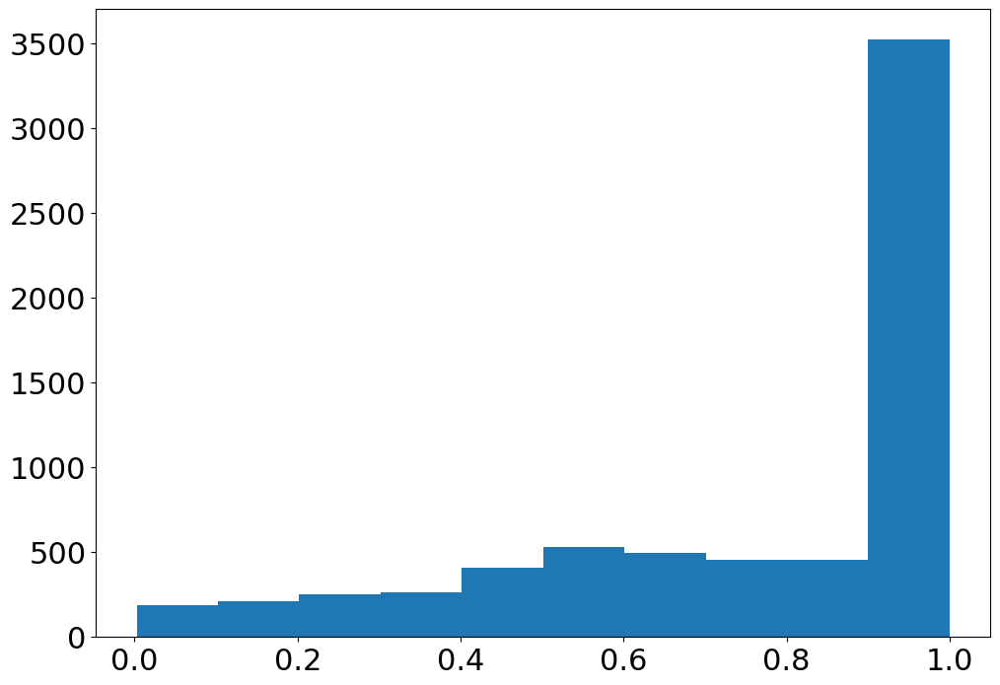

In [861]:
plt.hist(dict_slices_below)

In [764]:
float(test_p[CT][CBCT]['start_z'])+93*float(test_p[CT][CBCT]['z_spacing'])

161.16768586635587

In [765]:
min(test_p[CT][CBCT]['z_min_CT'])-test_p[CT][CBCT]['z_trans']

164.68316310658997

In [859]:
min(dict_fin)

0

(array([3524.,  454.,  453.,  500.,  528.,  410.,  261.,  254.,  214.,
         190.]),
 array([  0.        ,  18.45819059,  36.91638119,  55.37457178,
         73.83276238,  92.29095297, 110.74914356, 129.20733416,
        147.66552475, 166.12371534, 184.58190594]),
 <BarContainer object of 10 artists>)

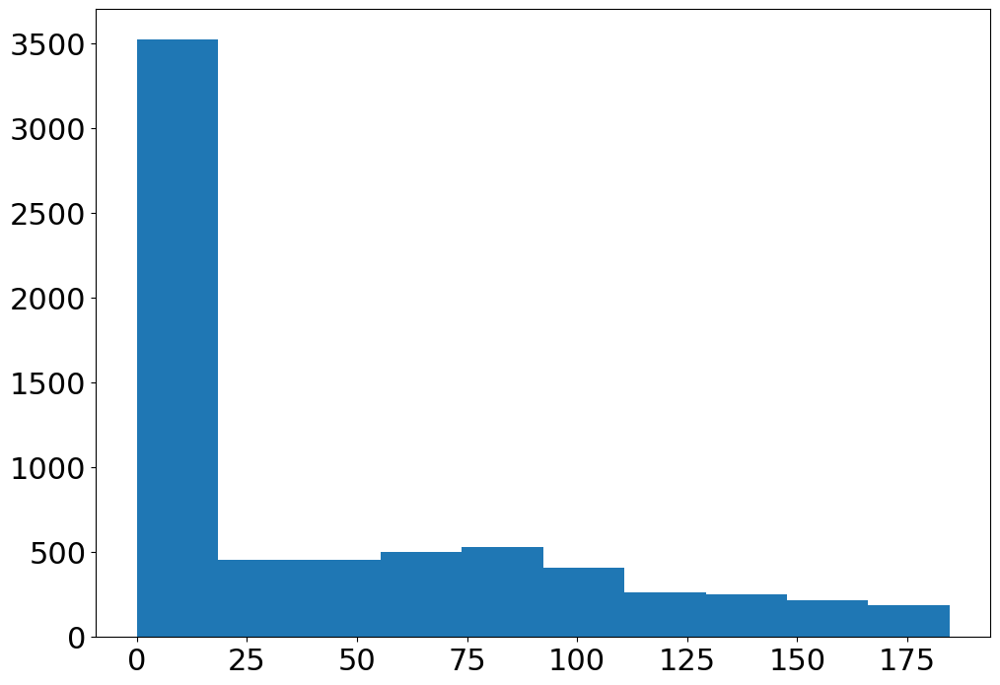

In [860]:
plt.hist(dict_fin)

In [826]:
count_0 = 0
count_100 = 0
count_10 =0
for i in dict_fin:
    if i ==0:
        count_0+=1
    elif i < 10:
        count_10+=1
    elif i < 100:
        count_100+=1

In [828]:
count_0

3061

In [875]:
img[10].ImagePositionPatient

[-130.60922703147, -130.60922703147, -71.630082607269]

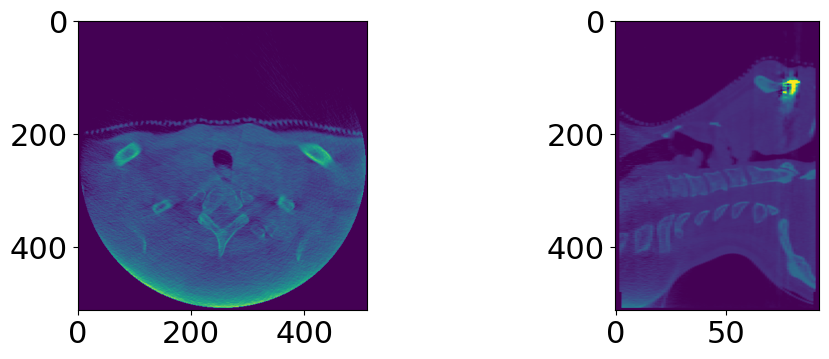

In [885]:
plot_3_views(img,10)

In [857]:
max(dict_fin)

184.58190593841238

In [903]:
np.mean(dict_fin)

42.24270076634573

In [835]:
print(max(dict_slice))
print(min(dict_slice))
print(np.mean(dict_slice))

177
0
21.171008094186902


In [706]:
num_abv

1944

In [892]:
patient = '1522'
test_p = dict_num_slices[patient]
print(test_p)
CT = '20180411_CT_09_APR_2018'
CBCT = '20180417_kV_CBCT_1a'
print(test_p[CT][CBCT])

KeyError: '1522'

In [884]:
patient
img = [dcm.read_file(PATH+patient+'/'+CBCT+'/'+f) for f in os.listdir(PATH+patient+'/'+CBCT) if 'CT' in f]
img.sort(key = lambda x: (x.InstanceNumber))
img[1].ImagePositionPatient
print(len(img))
print(img[0].SliceThickness)

93
1.98972451686859


In [914]:
# plt.imshow(img[180].pixel_array)

In [684]:
test_p=dict_num_slices['22']
patient='22'
CT = '20180921_CT_13_SEP_2018'
CBCT = '20180924_kV_CBCT_1a'
z_eye =  min(test_p['20180921_CT_13_SEP_2018']['20180924_kV_CBCT_1a']['z_min_CT'])-test_p['20180921_CT_13_SEP_2018']['20180924_kV_CBCT_1a']['z_trans']
#         slices =test_p[CT][CBCT]['slices']
slices = len([f for f in os.listdir(PATH+patient+'/'+CBCT) if 'CT' in f])
#             print(slices)
z_space = float(test_p[CT][CBCT]['z_spacing'])
z_above = (float(test_p[CT][CBCT]['start_z'])-z_eye)/z_space

In [663]:
z_above

-64.18110639494522

## NOSE

# Comparing autocontouring

In [241]:
anon_path = '/mnt/iDriveShare/Kayla/CBCT_images/anonymized/22/20180921_CT_13_SEP_2018/'
RS_path = anon_path+'RS.1.2.246.352.205.5548404720262746199.8088424948936543396.dcm'
RS_anon = dcm.read_file(RS_path)

In [263]:
RS_man_to_AI = {}
RS_names = find_ROI_names(RS)
RS_AI_anon = find_ROI_names(RS_anon)
not_in_AI = []
names_AI_got = []

for name in RS_names:
    name_ = name.replace(" ","").replace("_","").lower()
    found = False
    for name_AI in RS_AI_anon:
        if name_ == name_AI.replace(" ","").replace("_","").lower():
            RS_man_to_AI[name] = name_AI
            names_AI_got.append(name_AI)
            found=True
    if not found:
        not_in_AI.append(name)
        


In [264]:
not_in_AI

['BrainStem PRV',
 'SpinalCord',
 'SpinalCord PRV',
 'OralCavity',
 'Mandible',
 'Submandibular R',
 'Submandibular L',
 'External',
 'BrachialPlexus L',
 'BrachialPlexus R',
 'TemporalLobe L',
 'TemporalLobe R',
 'Shoulders',
 'OpticNerve L',
 'OpticNerve L PRV',
 'OpticNerve R',
 'OpticNerve R PRV',
 'Chiasm',
 'Chiasm PRV',
 'opt_Ring_70',
 'GTVn',
 'CTV_5600',
 'CTV_6300',
 'CTV_7000',
 'PTV_7000',
 'PTV_6300',
 'PTV_5600',
 'opt_Ring_Avoid',
 'CARINA',
 'BONES_RADCAL',
 'opt_Ring_63',
 'opt_Ring_56',
 'Lens L',
 'Lens R',
 'Thyroid',
 'opt_Middle_Avoid',
 'opt_Post_Avoid',
 'GTVp',
 'Level_IB_R',
 'Level_IIB_R',
 'Level_IIA_R',
 'Level_III_R',
 'Level_V_R',
 'Level_Retropha_R',
 'Level_IA',
 'Level_Retropha_L',
 'Level_IV_L',
 'Lens_R',
 'Level_IB_L',
 'Level_IV_R',
 'Level_V_L',
 'Level_IIA_L',
 'Level_III_L',
 'Level_IIB_L',
 'Level_VI',
 'Density_Override',
 'Contra_Parot',
 'Ipsi_Parot',
 'opt_CTV56_crop03',
 'opt_CTV63_crop03',
 'GTV_interm nodes',
 'GTV',
 'PTV_ALL',
 'opt_C

In [283]:
RS_man_to_AI['SpinalCord'] = 'SpinalCord~'
RS_man_to_AI['OralCavity'] = 'Cavity_Oral'
RS_man_to_AI['Mandible'] = 'Bone_Mandible'
RS_man_to_AI['Submandibular R'] = 'Glnd_Submand_R'
RS_man_to_AI['Submandibular L'] = 'Glnd_Submand_L'
RS_man_to_AI['BrachialPlexus L'] = 'BrachialPlex_L'
RS_man_to_AI['BrachialPlexus R'] = 'BrachialPlex_R'
RS_man_to_AI['Chiasm'] = 'OpticChiasm'
RS_man_to_AI['OpticNerve L'] = 'OpticNrv_L'
RS_man_to_AI['OpticNerve R'] = 'OpticNrv_R'


In [284]:
# names_AI_got
not_in_AI = find_ROI_names(RS_anon)
not_in_man = find_ROI_names(RS)
for key in RS_man_to_AI:
#     print(key)
    not_in_man.remove(key)
    not_in_AI.remove(RS_man_to_AI[key])
    

In [285]:
not_in_man

['BrainStem PRV',
 'SpinalCord PRV',
 'External',
 'TemporalLobe L',
 'TemporalLobe R',
 'Shoulders',
 'OpticNerve L PRV',
 'OpticNerve R PRV',
 'Chiasm PRV',
 'opt_Ring_70',
 'GTVn',
 'CTV_5600',
 'CTV_6300',
 'CTV_7000',
 'PTV_7000',
 'PTV_6300',
 'PTV_5600',
 'opt_Ring_Avoid',
 'CARINA',
 'BONES_RADCAL',
 'opt_Ring_63',
 'opt_Ring_56',
 'Lens L',
 'Lens R',
 'Thyroid',
 'opt_Middle_Avoid',
 'opt_Post_Avoid',
 'GTVp',
 'Level_IB_R',
 'Level_IIB_R',
 'Level_IIA_R',
 'Level_III_R',
 'Level_V_R',
 'Level_Retropha_R',
 'Level_IA',
 'Level_Retropha_L',
 'Level_IV_L',
 'Lens_R',
 'Level_IB_L',
 'Level_IV_R',
 'Level_V_L',
 'Level_IIA_L',
 'Level_III_L',
 'Level_IIB_L',
 'Level_VI',
 'Density_Override',
 'Contra_Parot',
 'Ipsi_Parot',
 'opt_CTV56_crop03',
 'opt_CTV63_crop03',
 'GTV_interm nodes',
 'GTV',
 'PTV_ALL',
 'opt_CTV70_crop03',
 'opt_PTV56_Avoid',
 'opt_PTV56_cover',
 'MOD_CTV_5600',
 'MOD_PTV_5600',
 'old_CTV_5600',
 'old_PTV_5600']

In [286]:
not_in_AI

['Bone_Hyoid',
 'Clavicle_L',
 'Clavicle_R',
 'Cornea_L',
 'Cornea_R',
 'Glnd_Thyroid',
 'Hippocampus_L',
 'Hippocampus_R',
 'LN_Neck_2347AB_L',
 'LN_Neck_2347AB_R',
 'LN_Neck_IA',
 'LN_Neck_IB_L',
 'LN_Neck_IB_R',
 'LN_Neck_L',
 'LN_Neck_R',
 'LN_Neck_V_L',
 'LN_Neck_V_R',
 'LN_Neck_VI',
 'SpinalCanal',
 'BODY']

In [287]:
# [f for f in find_ROI_names(RS_anon) if f not in names_AI_got]

In [267]:
# find_ROI_names(RS_anon)

In [288]:
RS_man_to_AI

{'BrainStem': 'Brainstem',
 'Lips': 'Lips',
 'Parotid R': 'Parotid_R',
 'Parotid L': 'Parotid_L',
 'Pharynx': 'Pharynx',
 'Esophagus': 'Esophagus',
 'Larynx': 'Larynx',
 'Pituitary': 'Pituitary',
 'Eye L': 'Eye_L',
 'Eye R': 'Eye_R',
 'LUNG_L': 'Lung_L',
 'LUNG_R': 'Lung_R',
 'BRAIN': 'Brain',
 'COCHLEA_R': 'Cochlea_R',
 'COCHLEA_L': 'Cochlea_L',
 'SpinalCord': 'SpinalCord~',
 'OralCavity': 'Cavity_Oral',
 'Mandible': 'Bone_Mandible',
 'Submandibular R': 'Glnd_Submand_R',
 'Submandibular L': 'Glnd_Submand_L',
 'BrachialPlexus L': 'BrachialPlex_L',
 'BrachialPlexus R': 'BrachialPlex_R',
 'Chiasm': 'OpticChiasm',
 'OpticNerve L': 'OpticNrv_L',
 'OpticNerve R': 'OpticNrv_R'}

In [269]:
find_ROI_names(RS_anon)

['Bone_Hyoid',
 'Bone_Mandible',
 'BrachialPlex_L',
 'BrachialPlex_R',
 'Brain',
 'Brainstem',
 'Cavity_Oral',
 'Clavicle_L',
 'Clavicle_R',
 'Cochlea_L',
 'Cochlea_R',
 'Cornea_L',
 'Cornea_R',
 'Esophagus',
 'Eye_L',
 'Eye_R',
 'Glnd_Submand_L',
 'Glnd_Submand_R',
 'Glnd_Thyroid',
 'Hippocampus_L',
 'Hippocampus_R',
 'Larynx',
 'Lips',
 'LN_Neck_2347AB_L',
 'LN_Neck_2347AB_R',
 'LN_Neck_IA',
 'LN_Neck_IB_L',
 'LN_Neck_IB_R',
 'LN_Neck_L',
 'LN_Neck_R',
 'LN_Neck_V_L',
 'LN_Neck_V_R',
 'LN_Neck_VI',
 'Lung_L',
 'Lung_R',
 'OpticChiasm',
 'OpticNrv_L',
 'OpticNrv_R',
 'Parotid_L',
 'Parotid_R',
 'Pharynx',
 'Pituitary',
 'SpinalCanal',
 'SpinalCord~',
 'BODY']

In [598]:
from struct import unpack

In [1319]:
dr_path = '/mnt/iDriveShare/Kayla/CBCT_images/anonymized/DR.1.2.246.352.205.5334600060660530631.12418067677413169837.dcm'

In [1320]:
ds = dcm.read_file(dr_path)

In [1372]:
# extract the deformation values
dvf_vals_raw = ds.DeformableRegistrationSequence[0].DeformableRegistrationGridSequence[0].VectorGridData

# # convert to numbers
dvf_vals = unpack(f"<{len(dvf_vals_raw) // 4}f", dvf_vals_raw)

# we need more image info to properly define the transform
reg = ds["DeformableRegistrationSequence"][0]["DeformableRegistrationGridSequence"][0]

dvf_grid_size = reg["GridDimensions"].value
dvf_grid_res = reg["GridResolution"].value
dvf_grid_origin = reg["ImagePositionPatient"].value

dvf_arr = np.reshape(dvf_vals, dvf_grid_size[::-1]+[3,])
dvf_img = sitk.GetImageFromArray(dvf_arr)
dvf_img.SetSpacing(dvf_grid_res)

dvf_img.SetOrigin(dvf_grid_origin)
# convert this to a transform
tfm = sitk.DisplacementFieldTransform(dvf_img)


In [716]:
# tfm.SetInterpolator(sitk.sitkNearestNeighbor)
# resampler = sitk.ResampleImageFilter()
# resampler.SetTransform(tfm)
# resampler.SetReferenceImage(fixed_image)
# deformed  = resampler.Execute(fixed_image) 

resampler = sitk.ResampleImageFilter()
resampler.SetReferenceImage(img_ref)
resampler.SetInterpolator(sitk.sitkLinear)
resampler.SetDefaultPixelValue(-1000)
resampler.SetTransform(tfm)

out = resampler.Execute(moving)
simg1 = sitk.Cast(sitk.RescaleIntensity(img_ref), sitk.sitkUInt8)
simg2 = sitk.Cast(sitk.RescaleIntensity(out), sitk.sitkUInt8)
# Use the // floor division operator so that the pixel type is
# the same for all three images which is the expectation for
# the compose filter.
cimg = sitk.Compose(simg1, simg2, simg1 // 2.0 + simg2 // 2.0)
# sitk.Show(cimg, "DeformableRegistration1 Composition")

In [1322]:
moving_resampled = sitk.Resample(moving,img_ref,tfm,sitk.sitkLinear,-1000,moving.GetPixelID())

In [1400]:
image = ['/mnt/iDriveShare/Kayla/CBCT_images/test_phantom/'+f for f in os.listdir(phantom_path_CT) if f[0:2]=='CT']

# now we can finally apply the transform
# NB: image can be list of str for DICOM filenames, or NIfTI, etc.
# img = sitk.ReadImage(image)
fixed_reader = sitk.ImageSeriesReader()
for file in os.listdir('/mnt/iDriveShare/Kayla/CBCT_images/test_phantom/'):
        if 'CT' in file:
            series_id = dcm.read_file('/mnt/iDriveShare/Kayla/CBCT_images/test_phantom/'+file).SeriesInstanceUID
            continue
dicom_names = fixed_reader.GetGDCMSeriesFileNames('/mnt/iDriveShare/Kayla/CBCT_images/test_phantom/', seriesID=series_id)
fixed_reader.SetFileNames(dicom_names)
moving = fixed_reader.Execute()


In [718]:
print(resampler)

itk::simple::ResampleImageFilter
  Size: [ 512, 512, 153 ]
  Interpolator: Linear
  OutputOrigin: [ -310.5, -245.5, -807.5 ]
  OutputSpacing: [ 1.21289, 1.21289, 3 ]
  OutputDirection: [ 1, 0, 0, 0, 1, 0, 0, 0, 1 ]
  DefaultPixelValue: -1000
  OutputPixelType: Unknown pixel id
  UseNearestNeighborExtrapolator: 0
  Debug: 0
  NumberOfThreads: 2
  NumberOfWorkUnits: 0
  Commands: (none)
  ProgressMeasurement: 1
  ActiveProcess: (none)



In [1341]:

# NB: 2 -> linear interpolation, -1000 -> default (background) value
# img_def = sitk.Transform(moving,tfm, 2, -1000)

In [1373]:
img_def = sitk.Resample(moving_rigid, tfm, interpolator=sitk.sitkLinear, defaultPixelValue=-1000)

In [690]:
# img_ref =  sitk.ReadImage([PATH+patient+'/'+CT + '/'+ s for s in os.listdir(PATH+patient+'/'+CT) if 'CT' in s])

fixed_reader = sitk.ImageSeriesReader()
for file in os.listdir(PATH+patient+'/'+CT + '/'):
        if 'CT' in file:
            series_id = dcm.read_file(PATH+patient+'/'+CT + '/'+file).SeriesInstanceUID
            continue
dicom_names = fixed_reader.GetGDCMSeriesFileNames(PATH+patient+'/'+CT + '/', seriesID=series_id)
fixed_reader.SetFileNames(dicom_names)
img_ref = fixed_reader.Execute()


In [651]:

resampled = sitk.Resample(img, img_ref,tfm,sitk.sitkLinear,-1000,img.GetPixelID())

In [ ]:
print(dvf_img.GetSpacing())

In [622]:
dvf_grid_res

[2.42578124, 2.42578124, 3.0]

In [613]:
dvf_img.SetSpacing(dvf_grid_res)
print(dvf_img.GetSpacing())

(2.42578124, 2.42578124)


In [704]:
# plt.imshow(slices[41].pixel_array)

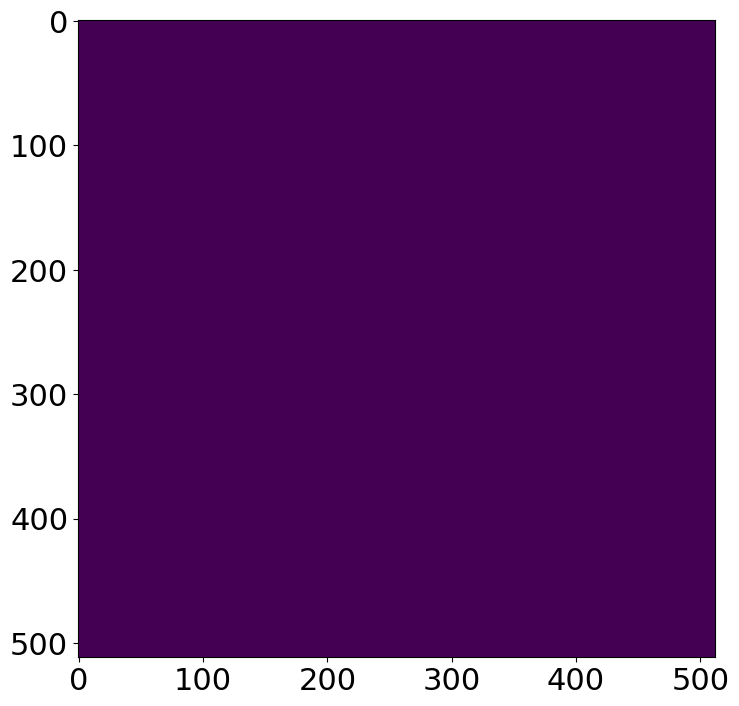

In [1374]:
plt.imshow(sitk.GetArrayFromImage(img_def)[100])

In [747]:
# plt.imshow(sitk.GetArrayFromImage(moving_resampled)[100])

In [746]:
# plt.imshow(sitk.GetArrayFromImage(img_ref)[100])

In [889]:
deformed_phantom_path = '/mnt/iDriveShare/Kayla/CBCT_images/anonymized/deformed_phantom_743/2_try/'

In [890]:
CT_dcm_def = dcm.read_file(deformed_phantom_path+[f for f in os.listdir(deformed_phantom_path) if 'CT' in f][0])

slices_def = [dcm.read_file(deformed_phantom_path+ s) for s in os.listdir(deformed_phantom_path) if 'CT' in s]
# Order slices
# for slice in slices_def:
#     print(slice.SOPInstanceUID, slice.ImagePositionPatient[2])
slices_def.sort(key = lambda x: (x.ImagePositionPatient[2]))
image_def = get_pixels_hu(slices)

Intersept: -1024
slope: 1


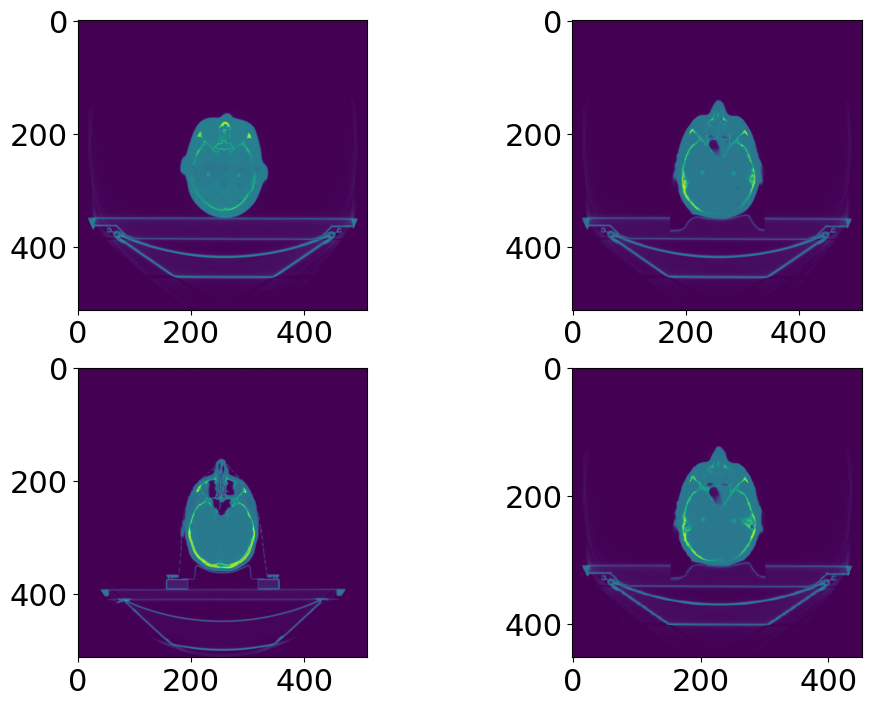

In [1375]:
fig = plt.figure()

fig.add_subplot(2,2,1)
plt.imshow(slices[40].pixel_array)

fig.add_subplot(2,2,2)
plt.imshow(slices_def[94].pixel_array)
        
fig.add_subplot(2,2,3)
plt.imshow(slices_i[104].pixel_array)

fig.add_subplot(2,2,4)
plt.imshow(result[31])

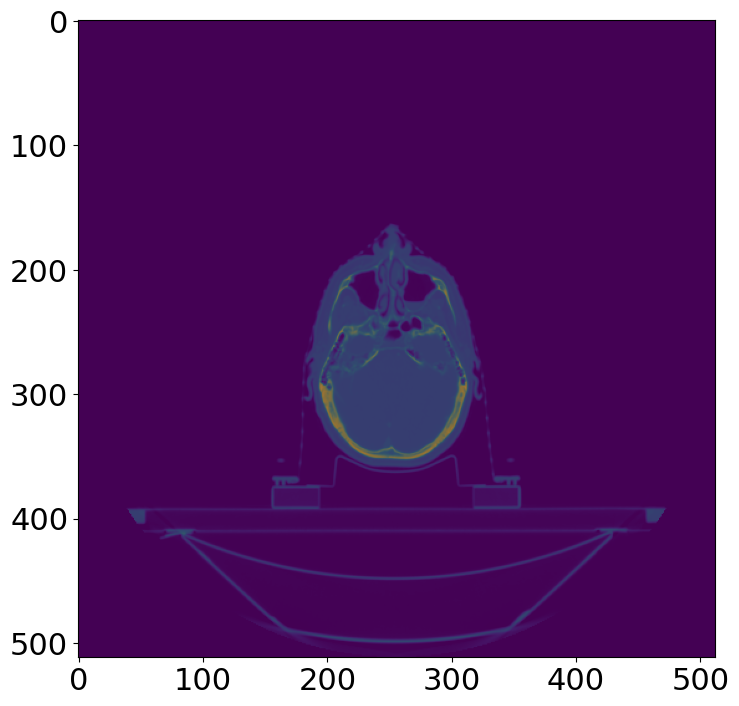

In [1376]:
plt.imshow(sitk.GetArrayFromImage(img_def)[90])
plt.imshow(sitk.GetArrayFromImage(fixed_image)[100],alpha=0.5)


In [1339]:
len(sitk.GetArrayFromImage(img_def))

139

In [863]:
slices_def[111].ImagePositionPatient

[-280.84701936268, -176.09346427916, -406.67283695453]

In [854]:
slices_i[94].ImagePositionPatient

[-310.5, -245.5, -525.5]

In [856]:
slices[94].ImagePositionPatient

[-275, -275, 9.5]

In [857]:
len(slices_i)-len(slices_def)

14

In [858]:
slices[0].SliceThickness

'2.5'

In [859]:
slices_def[0].SliceThickness

'1.0'

In [860]:
slices_i[0].SliceThickness

'3.0'

In [959]:
# for i,slice in enumerate(slices_i):
#     print(i,slice.ImagePositionPatient[2])

In [958]:
# ds

In [1150]:
old_spacing = [slices_def[0].PixelSpacing[0],slices_def[0].PixelSpacing[1],slices_def[0].SliceThickness]
new_spacing = [slices_i[0].PixelSpacing[0],slices_i[0].PixelSpacing[1],slices_i[0].SliceThickness]
print(new_spacing,old_spacing)

['1.21289062', '1.21289062', '3.0'] ['1.074219', '1.074219', '1.0']


In [1153]:
len(slices_def)/3

46.333333333333336

In [913]:
slices_i[0].PixelSpacing[0:2]

['1.21289062', '1.21289062']

In [1151]:
image_def = get_pixels_hu(slices_def)
result = resample_dose_map_3D(image_def, new_spacing, old_spacing)


Intersept: -1000
slope: 1
[512 512 139]
[46, 453, 453]
[453.46226521 453.46226521  46.33333333]
(46, 453, 453)


In [1186]:
result_2 = resize_dose_map_3D(result, [slices_i[0].Rows,slices_i[0].Columns,len(slices_i)],[1,.5,3], slices_def[0].ImagePositionPatient,slices_i[0].ImagePositionPatient, default=-1000)

(153, 512, 512)
z_img 42 42.326842222306674
len dose map 46
len dose map after < 0 46
0 42
new or (DOSE) -680.51947333308
old or (IMG) -807.5
spacing [1, 0.5, 3]
24 49
24.760239198010026 49.58682361382
X 24 453
Y 49 453
477
xy ends 477 502
1 43
new or (DOSE) -680.51947333308
old or (IMG) -807.5
spacing [1, 0.5, 3]
24 49
24.760239198010026 49.58682361382
X 24 453
Y 49 453
477
xy ends 477 502
2 44
new or (DOSE) -680.51947333308
old or (IMG) -807.5
spacing [1, 0.5, 3]
24 49
24.760239198010026 49.58682361382
X 24 453
Y 49 453
477
xy ends 477 502
3 45
new or (DOSE) -680.51947333308
old or (IMG) -807.5
spacing [1, 0.5, 3]
24 49
24.760239198010026 49.58682361382
X 24 453
Y 49 453
477
xy ends 477 502
4 46
new or (DOSE) -680.51947333308
old or (IMG) -807.5
spacing [1, 0.5, 3]
24 49
24.760239198010026 49.58682361382
X 24 453
Y 49 453
477
xy ends 477 502
5 47
new or (DOSE) -680.51947333308
old or (IMG) -807.5
spacing [1, 0.5, 3]
24 49
24.760239198010026 49.58682361382
X 24 453
Y 49 453
477
xy end

In [1129]:
slices_i[0].ImagePositionPatient,  slices_def[0].ImagePositionPatient,

([-310.5, -245.5, -807.5],
 [-285.73976080199, -220.70658819309, -680.51947333308])

In [1130]:
slices_i[0].Columns

512

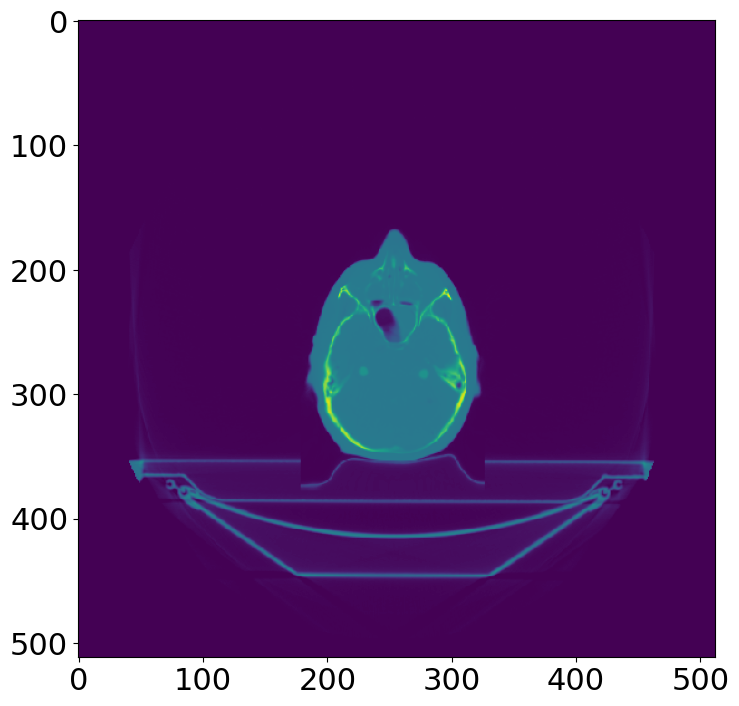

In [1131]:
plt.imshow(blank)

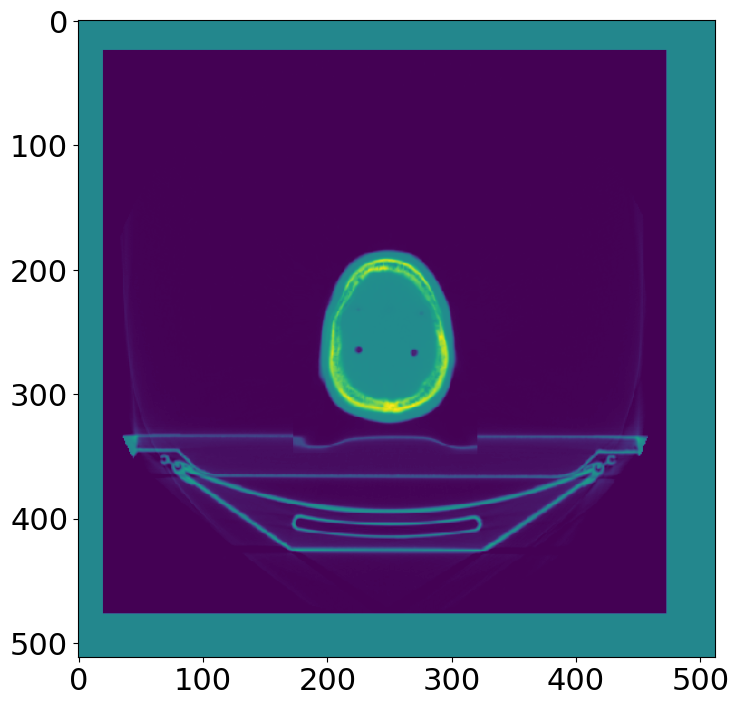

In [1175]:
plt.imshow(result_2[84])

In [1126]:
slices_i[104].ImagePositionPatient

[-310.5, -245.5, -495.5]

In [1058]:
slices_def[1].ImagePositionPatient

[-285.69568205029, -220.30466815783, -678.05238651886]

In [1040]:
new_spacing

['1.21289062', '1.21289062', '3.0']

In [1155]:
blank = np.full((512,512), -1000)
blank[492-453+5:492+5,20+5:20+453+5] = result[31]

ValueError: could not broadcast input array from shape (512,512) into shape (453,453)

In [1157]:
for i,slice in enumerate(result_2):
    if np.sum(slice) !=0:
        print(i)

42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87


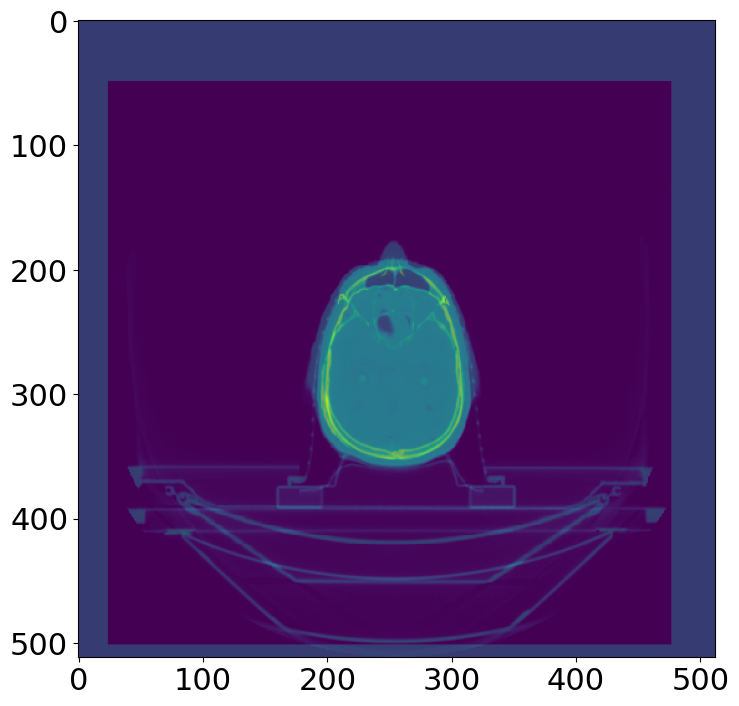

In [1195]:
plt.imshow(result_2[74])
# blank = np.full((512,512), -1000)
# blank[492-453+5:492+5,20+5:20+453+5] = result[45]
# plt.imshow(blank,cmap='gray')
# plt.imshow(slices[90].pixel_array,alpha=0.5)
plt.imshow(slices_i[119].pixel_array,alpha=0.5)

In [1349]:
# slices_i[0]

In [1348]:
# slices_def[0]

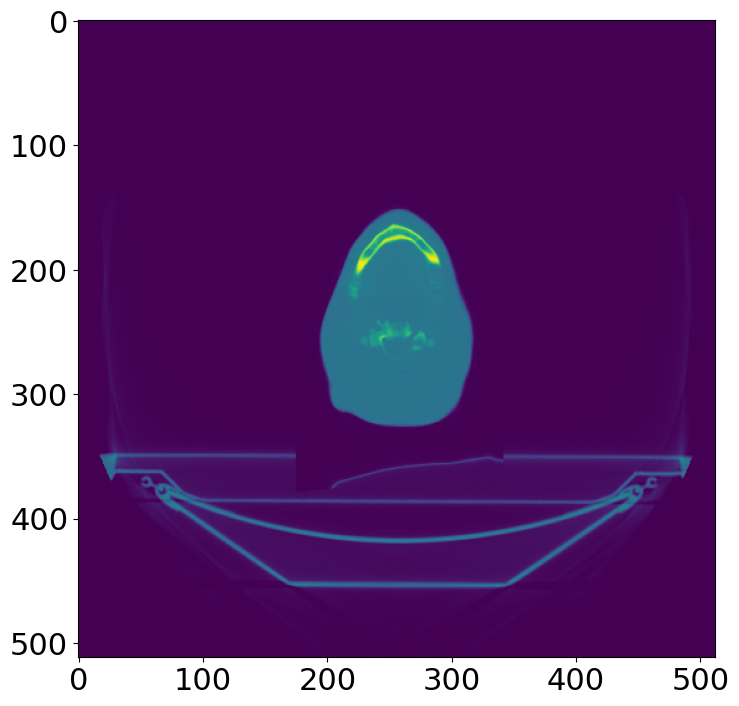

In [1217]:
plt.imshow(slices_def[56].pixel_array)

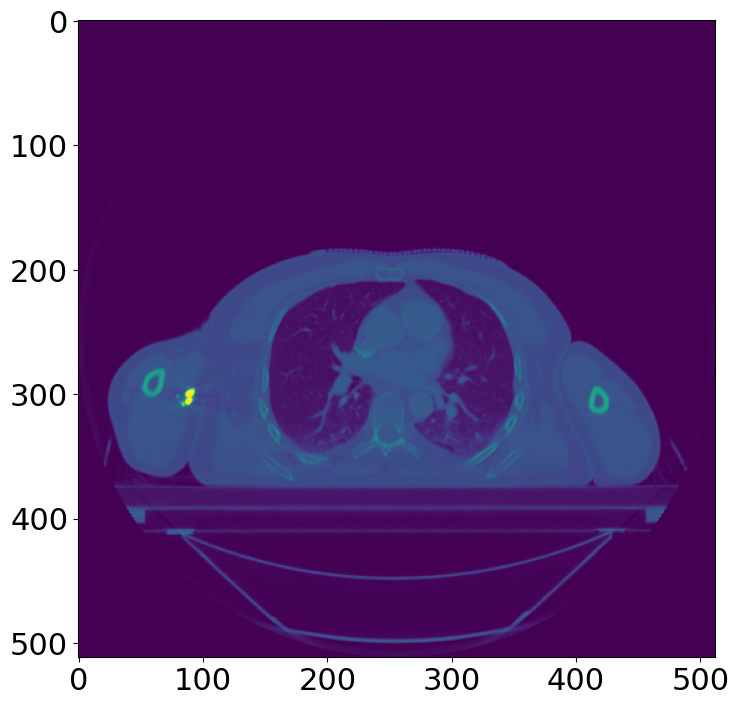

In [1206]:
plt.imshow(slices_i[0].pixel_array)

In [1347]:
# slices_def[0]

In [1346]:
# slices_i[0]

In [ ]:
def rescale_position(img, transformation):
    

In [1235]:
        
def generate_sitk_image2(DCM_path):
        """
        generate_sitk_image     Reads DICOM file at DCM_path as a SITK (SimpleITK) image.

        :param DCM_path: Path to dicom series directory. 

        :returns: The DICOM image in SITK format
        """

        series_id = ''

        for file in os.listdir(DCM_path):
                if 'CT' in file:
                        series_id = dcm.read_file(DCM_path+file).SeriesInstanceUID
                        continue
           
        fixed_reader = sitk.ImageSeriesReader()
        dicom_names = fixed_reader.GetGDCMSeriesFileNames(DCM_path, seriesID=series_id)
        fixed_reader.SetFileNames(dicom_names)
        fixed_image = fixed_reader.Execute()

        return fixed_image
        

In [1241]:
# Load your fixed and moving CT scans (replace filenames)
fixed_image = sitk.Cast(generate_sitk_image2(PATH+patient+'/'+CT+'/'),sitk.sitkFloat32)#sitk.ReadImage("fixed_ct_scan.dcm", sitk.sitkFloat32)
moving_image = sitk.Cast(generate_sitk_image2(phantom_path_CT),sitk.sitkFloat32)#sitk.ReadImage("moving_ct_scan.dcm", sitk.sitkFloat32)


In [1269]:

# Set up the Demons registration method
registration_method = sitk.ImageRegistrationMethod()
registration_method.SetMetricAsMeanSquares()
registration_method.SetOptimizerAsRegularStepGradientDescent(learningRate=2.0, minStep=1e-4, numberOfIterations=200)
registration_method.SetInitialTransform(sitk.TranslationTransform(fixed_image.GetDimension()))
registration_method.SetInterpolator(sitk.sitkLinear)

# Execute the registration
displacement_field = registration_method.Execute(fixed_image, moving_image)

# Apply the displacement field to the moving image
registered_image = sitk.Resample(moving_image, fixed_image, displacement_field)

# Save the registered image
# sitk.WriteImage(registered_image, "/data/kayla/registered_ct_scan.dcm")

MeanSquaresImageToImageMetricv4 (0x14000700): No valid points were found during metric evaluation. For image metrics, verify that the images overlap appropriately. For instance, you can align the image centers by translation. For point-set metrics, verify that the fixed points, once transformed into the virtual domain space, actually lie within the virtual domain.



In [1345]:
# plt.imshow(sitk.GetArrayFromImage(registered_image)[75])

In [1233]:
print(moving_image.GetPixelIDTypeAsString())

32-bit signed integer


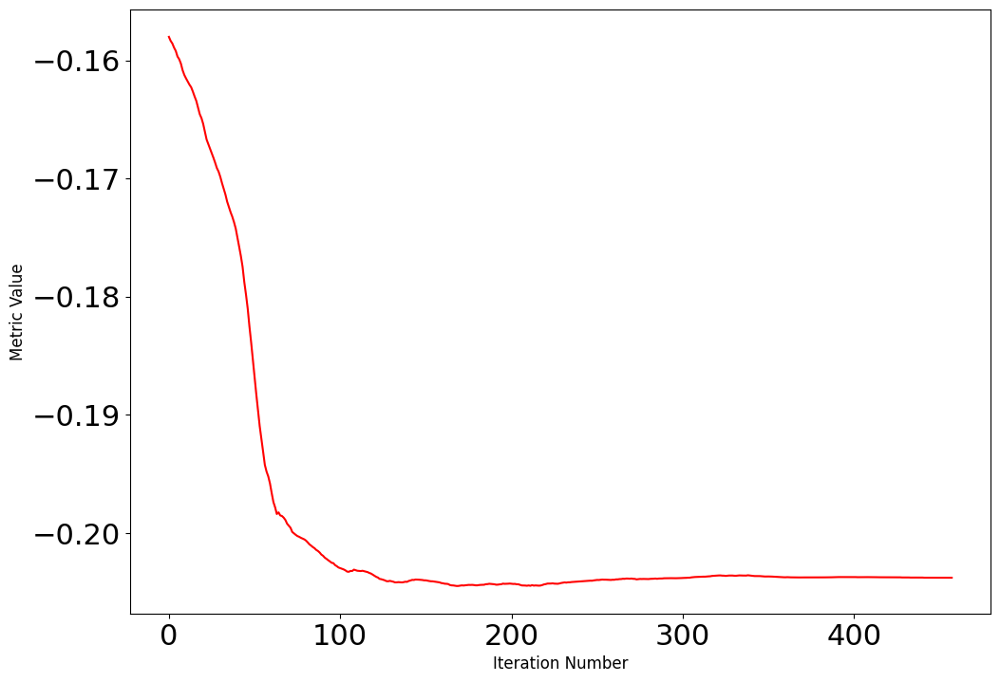

Final metric value: -0.20376966799122403
Optimizer's stopping condition, RegularStepGradientDescentOptimizerv4: Step too small after 458 iterations. Current step (8.30767e-05) is less than minimum step (0.0001).


In [1279]:
moving_resampled, trans, metric, stop =  register_images_without_dicom_reg(fixed_image, moving_image)

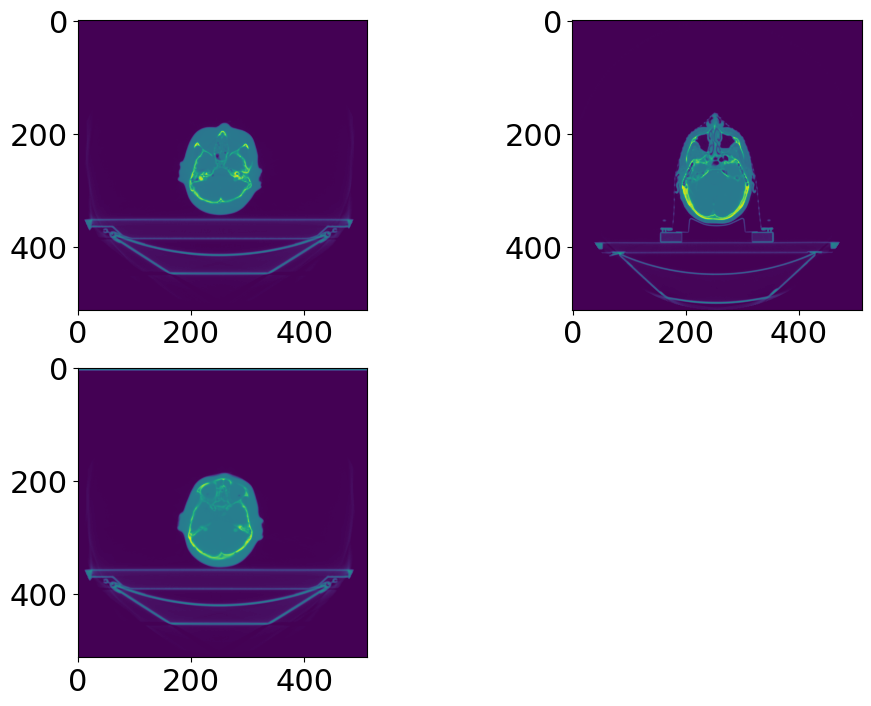

In [1315]:
plt.subplot(2,2,1)
plt.imshow(sitk.GetArrayFromImage(moving_resampled)[100])
plt.subplot(2,2,2)
plt.imshow(sitk.GetArrayFromImage(fixed_image)[100])
plt.subplot(2,2,3)
plt.imshow(sitk.GetArrayFromImage(registered_image)[100])

In [1284]:
# Set up the registration method
registration_method = sitk.ImageRegistrationMethod()
registration_method.SetMetricAsMeanSquares()#.SetMetricAsMattesMutualInformation(24)
registration_method.SetOptimizerAsRegularStepGradientDescent(learningRate=2.0, minStep=1e-4, numberOfIterations=500)
registration_method.SetInitialTransform(sitk.TranslationTransform(fixed_image.GetDimension()))
#SetInitialTransform(sitk.CenteredTransformInitializer(fixed_image, moving_image, sitk.Similarity2DTransform()))
registration_method.SetInterpolator(sitk.sitkLinear)

# Execute the registration
transform = registration_method.Execute(fixed_image, moving_resampled)

# Apply the transform to the moving image
registered_image = sitk.Resample(moving_resampled, fixed_image, transform)

In [1274]:
resampler = sitk.ResampleImageFilter()
resampler.SetReferenceImage(fixed_image)
resampler.SetInterpolator(sitk.sitkLinear)
resampler.SetDefaultPixelValue(-1000)  # Set a default value for out-of-bound pixels
resampler.SetTransform(transform)
registered_moving_image = resampler.Execute(moving_resampled)

In [1291]:
len(sitk.GetArrayFromImage(fixed_image))

153

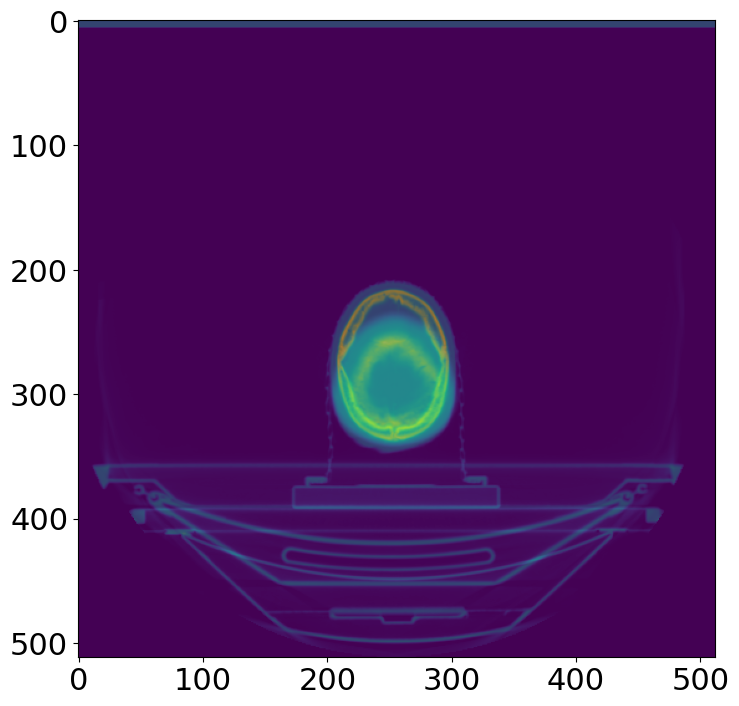

In [1304]:
plt.imshow(sitk.GetArrayFromImage(registered_image)[130])
plt.imshow(sitk.GetArrayFromImage(fixed_image)[130],alpha=0.5)
# plt.imshow(sitk.GetArrayFromImage(moving_resampled)[100],alpha=.5)

In [1306]:
elastixImageFilter = sitk.ElastixImageFilter()
elastixImageFilter.SetFixedImage(fixed_image)
elastixImageFilter.SetMovingImage(moving_image)

parameterMapVector = sitk.VectorOfParameterMap()
parameterMapVector.append(sitk.GetDefaultParameterMap("affine"))
parameterMapVector.append(sitk.GetDefaultParameterMap("bspline"))
elastixImageFilter.SetParameterMap(parameterMapVector)

elastixImageFilter.Execute()
sitk.WriteImage(elastixImageFilter.GetResultImage())

AttributeError: module 'SimpleITK' has no attribute 'ElastixImageFilter'

In [1316]:
result_image = sitk.Elastix(fixed_image, moving_resampled)

AttributeError: module 'SimpleITK' has no attribute 'Elastix'

In [1278]:
for i, slice in enumerate(sitk.GetArrayFromImage(registered_moving_image)):
#     print(slice)
    
    print(i,np.max(slice))

0 -1000.0
1 -1000.0
2 -1000.0
3 -1000.0
4 -1000.0
5 -1000.0
6 -1000.0
7 -1000.0
8 -1000.0
9 -1000.0
10 -1000.0
11 -1000.0
12 -1000.0
13 -1000.0
14 -1000.0
15 -1000.0
16 -1000.0
17 -1000.0
18 -1000.0
19 -1000.0
20 -1000.0
21 -1000.0
22 -1000.0
23 -1000.0
24 -1000.0
25 -1000.0
26 -1000.0
27 -1000.0
28 -1000.0
29 -1000.0
30 -1000.0
31 -1000.0
32 -1000.0
33 -1000.0
34 -1000.0
35 -1000.0
36 -1000.0
37 -1000.0
38 -1000.0
39 -1000.0
40 -1000.0
41 -1000.0
42 -1000.0
43 -1000.0
44 -1000.0
45 -1000.0
46 -1000.0
47 -1000.0
48 -1000.0
49 -1000.0
50 -1000.0
51 -1000.0
52 -1000.0
53 -1000.0
54 -1000.0
55 -1000.0
56 -1000.0
57 -1000.0
58 -1000.0
59 -1000.0
60 -1000.0
61 -1000.0
62 -1000.0
63 -1000.0
64 -1000.0
65 -1000.0
66 -1000.0
67 -1000.0
68 -1000.0
69 -1000.0
70 -1000.0
71 -1000.0
72 -1000.0
73 -1000.0
74 -1000.0
75 -1000.0
76 -1000.0
77 -1000.0
78 -1000.0
79 -1000.0
80 -1000.0
81 -1000.0
82 -1000.0
83 -1000.0
84 -1000.0
85 -1000.0
86 -1000.0
87 -1000.0
88 -1000.0
89 -1000.0
90 -1000.0
91 -1000.

In [1344]:
# sitk.GetArrayFromImage(moving_image)

In [1343]:
# find_ROI_names(RS)

In [1342]:
# find_ROI_names(RS_phantom)

In [1351]:
slices_i[0].ImageOrientationPatient

[1, 0, 0, 0, 1, 0]

In [1352]:
slices_def[0].ImageOrientationPatient

[0.99983595097504, -0.0069291157008, -0.0167349482655, 0.0041474475931, 0.9869678986657, -0.1608638109765]

In [1412]:
def register_images_with_dicom_regX(fixed_image: sitk.Image, moving_image: sitk.Image, registration_matrix,
                                                                        min_value=-1000, method=sitk.sitkLinear):
        """
        register_images_with_dicom_reg2 Register a moving image to fixed image using known registratio_matrix from dicom registration file.
                                                                        Function modified from https://github.com/brianmanderson/RegisteringImages.

        :param fixed_image: The fixed image
        :param moving_image: The moving image
        :param registration_matrix: the DICOM registration matrix
        :param min_value: Value to put as background in resampled image (-1000 for HU)
        :param method: interpolating method, recommend sitk.sitkLinear for images and sitk.sitkNearestNeighbor for masks

        :return: The registered moving SITK image.
        """

        affine_transform = sitk.AffineTransform(3)
#         registration_matrix = np.linalg.inv(registration_matrix)
        affine_transform.SetMatrix(registration_matrix[:3, :3].ravel())
        affine_transform.SetTranslation(registration_matrix[:3, -1])
        print(registration_matrix[:3, :3].ravel())
        moving_resampled = sitk.Resample(moving_image, fixed_image, affine_transform, method, min_value,
                                                                         moving_image.GetPixelID())
        return moving_resampled

In [1392]:
# mov_res = register_images_with_dicom_regX

In [1391]:
# mat = get_transformation_matrix(dr_path)

In [1390]:
[0.99983595097504, -0.0069291157008, -0.0167349482655, 0.0041474475931, 0.9869678986657, -0.1608638109765]

In [1413]:
rigid_matrix = np.asarray(ds.DeformableRegistrationSequence[0].PreDeformationMatrixRegistrationSequence[0].FrameOfReferenceTransformationMatrix).reshape(4,4)

In [1409]:
rigid_matrix[:3, :3].ravel()

array([ 0.99983595, -0.00692912, -0.01673495,  0.00414745,  0.9869679 ,
       -0.16086381,  0.0176315 ,  0.16076801,  0.98683473])

In [1411]:
np.linalg.inv(rigid_matrix)

array([[ 9.99835951e-01,  4.14744759e-03,  1.76315007e-02,
        -7.87236038e+00],
       [-6.92911570e-03,  9.86967899e-01,  1.60768014e-01,
         6.49612625e+01],
       [-1.67349483e-02, -1.60863811e-01,  9.86834726e-01,
        -6.30182242e+02],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]])

In [1414]:
moving_rigid = register_images_with_dicom_regX(fixed_image, moving, rigid_matrix)

[ 0.99983595 -0.00692912 -0.01673495  0.00414745  0.9869679  -0.16086381
  0.0176315   0.16076801  0.98683473]


In [1377]:
dvf_vals_raw = ds.DeformableRegistrationSequence[0].DeformableRegistrationGridSequence[0].VectorGridData

# # convert to numbers
dvf_vals = unpack(f"<{len(dvf_vals_raw) // 4}f", dvf_vals_raw)

# we need more image info to properly define the transform
reg = ds["DeformableRegistrationSequence"][0]["DeformableRegistrationGridSequence"][0]

dvf_grid_size = reg["GridDimensions"].value
dvf_grid_res = reg["GridResolution"].value
dvf_grid_origin = reg["ImagePositionPatient"].value

dvf_arr = np.reshape(dvf_vals, dvf_grid_size[::-1]+[3,])
dvf_img = sitk.GetImageFromArray(dvf_arr)
dvf_img.SetSpacing(dvf_grid_res)

dvf_img.SetOrigin(dvf_grid_origin)
# convert this to a transform
tfm = sitk.DisplacementFieldTransform(dvf_img)


In [1416]:
img_def = sitk.Resample(moving_rigid, tfm, interpolator=sitk.sitkLinear, defaultPixelValue=-1000)

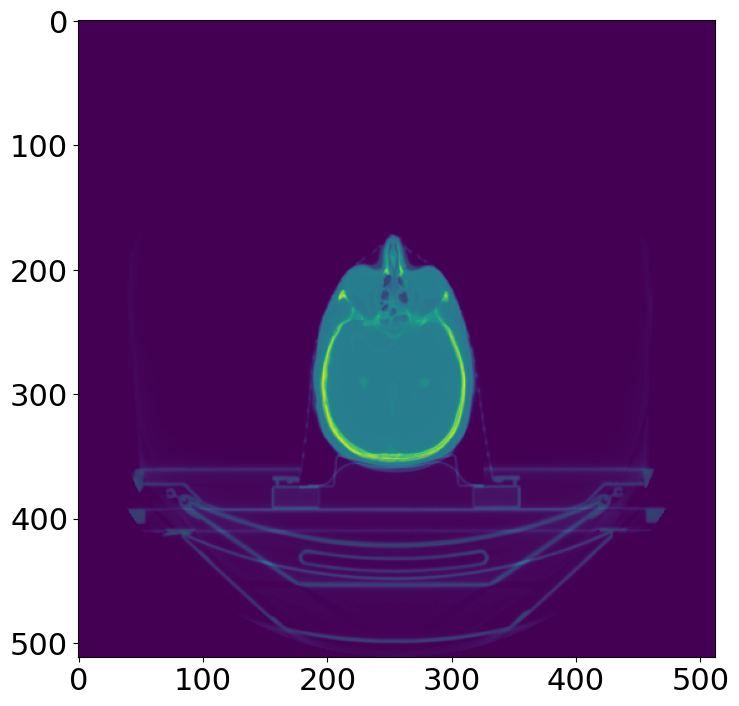

In [1422]:
plt.imshow(sitk.GetArrayFromImage(img_def)[110])
plt.imshow(sitk.GetArrayFromImage(fixed_image)[110],alpha=0.5)


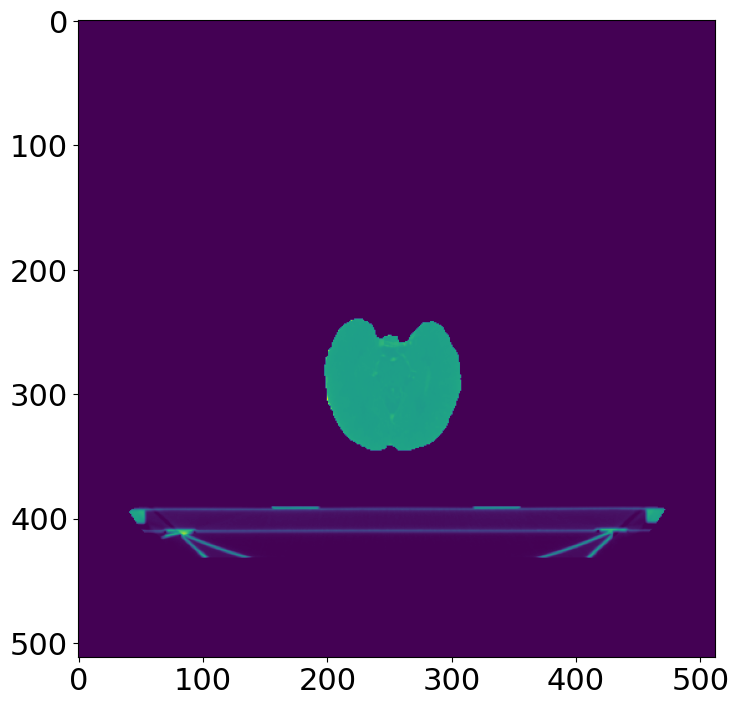

In [1510]:
plt.imshow(anon_all[106])
# plt.imshow(sitk.GetArrayFromImage(fixed_image)[100],alpha=0.5)


In [1512]:
d2_anon = anon_all[112].copy()
d2_phan = sitk.GetArrayFromImage(img_def)[112]
d3_phan = sitk.GetArrayFromImage(img_def)

In [1532]:
combined_image = []
for k,slice in enumerate(anon_all):
    if k < 106:
        combined_image.append(slice.copy())
        continue
    print(k)
    
    
    combined = []
    
    phan_slice = d3_phan[k].copy()
    
    for i,row in enumerate(slice):
        phan_row = phan_slice[i].copy()
        new_row = row.copy()

        for j, col in enumerate(row):

            if col == -1000 and phan_row[j] != -1000:
    #             print("JO")
                new_row[j] = phan_row[j]
        combined.append(new_row)
    combined_image.append(combined)
        
    

106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152


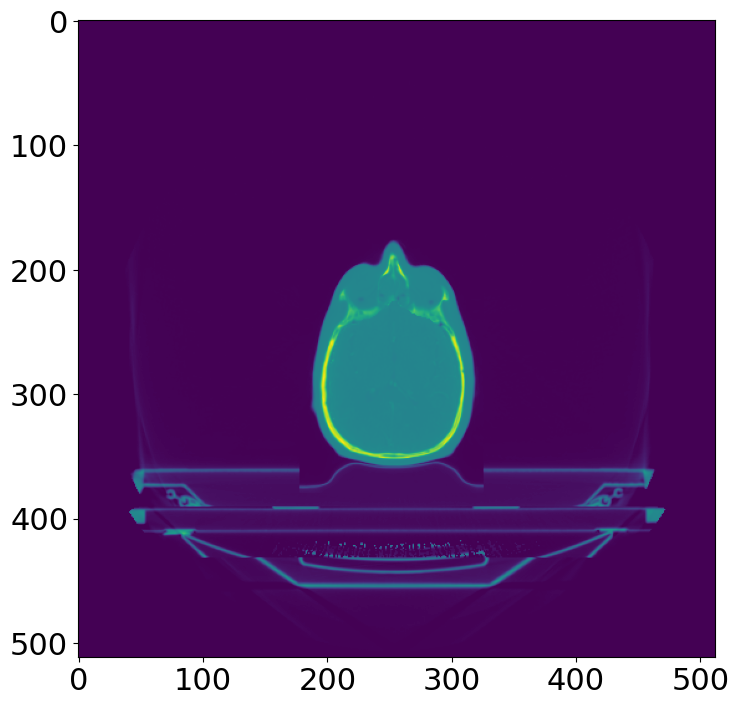

In [1502]:
plt.imshow(np.array(combined))

In [1432]:
len(combined[0])

512

In [1435]:
np.array(combined).shape

(512, 512)

In [1503]:
# [-1000]*(len(row))

In [1538]:
# anon = combined_image
print(len(combined_image), len(slices))
slices_copy = slices_i.copy()
anon_rev = reverse_pixels_hu(np.array(anon_all), slices)
slope = 1.0
intercept = -1000
for i,slice in enumerate(slices_copy):
    slices_copy[i].PixelData = ((np.array(anon_all)[i]-intercept)).tobytes() #NOTE: divide by SLOPE IS FUCKED
    

153 139
Intersept: -1024
slope: 1


In [1541]:
save_path_anon = '/data/kayla/anon_imgs/'

study_uid = dcm.uid.generate_uid()
series_uid = dcm.uid.generate_uid()

for slice in slices_copy:
    if not os.path.exists(save_path_anon+patient):
        os.makedirs(save_path_anon+patient)
    if not os.path.exists(save_path_anon+patient+'/'+CT):
        os.makedirs(save_path_anon+patient+'/'+CT)
        
#     file_meta.MediaStorageSOPClassUID = UID('1.2.840.10008.5.1.4.1.1.2')
#     file_meta.MediaStorageSOPInstanceUID = UID("1.2.3")
#     file_meta.ImplementationClassUID = UID("1.2.3.4")
#     UID = 
#     slice.MediaStorageSOPInstanceUID = slice.SOPInstanceUID[0:-5]+'11111'
    new_uid = dcm.uid.generate_uid()
    print(new_uid)
    slice.SOPInstanceUID = new_uid

    slice.StudyInstanceUID =study_uid
    slice.SeriesInstanceUID = series_uid
        
    slice.save_as(save_path_anon+patient+'crop'+'/'+CT+'/'+'CT.'+new_uid+'.dcm')

1.2.826.0.1.3680043.8.498.10420242524861434585764953822002673464
1.2.826.0.1.3680043.8.498.64682387483925109851502883191691185668
1.2.826.0.1.3680043.8.498.41839749060936071555409120814489757377
1.2.826.0.1.3680043.8.498.76077548089051136122893871737185027025
1.2.826.0.1.3680043.8.498.75501835457696598232237910231152093045
1.2.826.0.1.3680043.8.498.40496408850695697931934624005162460212
1.2.826.0.1.3680043.8.498.49852285466747417904672862274634687264
1.2.826.0.1.3680043.8.498.11540267637373309312987078968956055693
1.2.826.0.1.3680043.8.498.72380154609139074829355693929267252396
1.2.826.0.1.3680043.8.498.13390850798167353158771423353114919593
1.2.826.0.1.3680043.8.498.52234617980812392514507871621677588290
1.2.826.0.1.3680043.8.498.80269843374052212231201342570455372419
1.2.826.0.1.3680043.8.498.56173965314884865961098187776901236208
1.2.826.0.1.3680043.8.498.48562736918616305350728250555267794727
1.2.826.0.1.3680043.8.498.33392805346572327117050895505362609210
1.2.826.0.1.3680043.8.498

In [1522]:
slices_i[0].SOPInstanceUID[0:-5]+('111.1')

'1.2.246.352.221.5104421705839964932182313203088171111.1'

In [1524]:
slices_i[0].SOPInstanceUID

'1.2.246.352.221.510442170583996493218231320308817155458'

In [1521]:
slices_i[0]

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 186
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.246.352.221.510442170583996493218231320308817155458
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.246.352.70.2.1.160.3
(0002, 0013) Implementation Version Name         SH: 'DCIE 2.2'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 192'
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY', 'AXIAL']
(0008, 0012) Instance Creation Date              DA: '20230608'
(0008, 0013) Instance Creation Time              TM: '003452'
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID